In [1]:
import tensorflow as tf

In [2]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [3]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [4]:
len(tf.config.list_physical_devices('GPU'))

1

In [5]:
tf.test.is_built_with_cuda()

True

In [6]:
# Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import tensorflow
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import MinMaxScaler
from tensorflow import keras
from keras import callbacks
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, LSTM, Dropout, GRU, Bidirectional
from tensorflow.keras.layers import Activation
from tensorflow.keras.optimizers import SGD
import math
from sklearn.metrics import mean_squared_error
from tensorflow.keras import backend as K
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
import random
import cv2
import os
from imutils import paths
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import classification_report

In [7]:
df = pd.read_csv('I:/Study Materials/Thesis/Dataset/dataset_halfsecondWindow.csv')
df

,id,time,activityrecognition#0,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,...,sound#mean,sound#min,sound#max,sound#std,speed#mean,speed#min,speed#max,speed#std,target,user
0,156661,3,NaN,62,10.053802,4.328630,14.419712,2.359507,0.629076,0.436463,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bus,U12
1,156662,4,NaN,62,10.687402,6.373194,16.329818,2.912315,0.577839,0.376494,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bus,U12
2,156663,5,NaN,62,11.816800,4.817410,16.854629,3.199759,0.651511,0.585485,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bus,U12
3,156664,6,NaN,62,9.401312,6.124588,12.230792,1.572354,0.713226,0.693072,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bus,U12
4,156665,7,NaN,62,10.389851,5.313790,38.533453,5.426978,0.707375,0.684707,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Bus,U12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62580,82695,4066,NaN,51,10.105329,10.089159,10.135641,0.026270,0.834765,0.834765,...,89.761985,89.761985,89.761985,NaN,0.00,0.00,0.00,NaN,Walking,U1
62581,77608,604,NaN,100,9.544118,9.544118,9.544118,14.491194,0.965309,0.965309,...,89.747010,89.747010,89.747010,NaN,1.50,1.50,1.50,NaN,Walking,U1
62582,85219,1341,NaN,100,14.258467,14.258467,14.258467,0.829544,0.773370,0.773370,...,89.729460,89.729460,89.729460,NaN,0.00,0.00,0.00,NaN,Walking,U1
62583,69368,1186,NaN,90,10.726491,10.726491,10.726491,7.089701,0.789832,0.789832,...,89.778343,89.778343,89.778343,NaN,1.00,1.00,1.00,NaN,Walking,U1


In [8]:
column_lst = list(df.columns)
mostly_null = []
partially_null = []
no_null = []

In [9]:
print(column_lst)

['id', 'time', 'activityrecognition#0', 'activityrecognition#1', 'android.sensor.accelerometer#mean', 'android.sensor.accelerometer#min', 'android.sensor.accelerometer#max', 'android.sensor.accelerometer#std', 'android.sensor.game_rotation_vector#mean', 'android.sensor.game_rotation_vector#min', 'android.sensor.game_rotation_vector#max', 'android.sensor.game_rotation_vector#std', 'android.sensor.gravity#mean', 'android.sensor.gravity#min', 'android.sensor.gravity#max', 'android.sensor.gravity#std', 'android.sensor.gyroscope#mean', 'android.sensor.gyroscope#min', 'android.sensor.gyroscope#max', 'android.sensor.gyroscope#std', 'android.sensor.gyroscope_uncalibrated#mean', 'android.sensor.gyroscope_uncalibrated#min', 'android.sensor.gyroscope_uncalibrated#max', 'android.sensor.gyroscope_uncalibrated#std', 'android.sensor.light#mean', 'android.sensor.light#min', 'android.sensor.light#max', 'android.sensor.light#std', 'android.sensor.linear_acceleration#mean', 'android.sensor.linear_acceler

In [10]:
for i in column_lst:
    percentage = (df[i].isnull().sum()*100)/62585
    if percentage >= 60:
        mostly_null.append(i)
    elif df[i].isnull().sum() > 0:
        partially_null.append(i)
    elif df[i].isnull().sum() == 0:
        no_null.append(i)

    print('Feature Name:',i)
    print("Number of missing values: ",df[i].isnull().sum(),"out of 62585")
    print("Missing percentage:"+str(percentage)+"%")
    print()

Feature Name: id
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: time
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: activityrecognition#0
Number of missing values:  62585 out of 62585
Missing percentage:100.0%

Feature Name: activityrecognition#1
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#mean
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#min
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#max
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#std
Number of missing values:  2 out of 62585
Missing percentage:0.003195653910681473%

Feature Name: android.sensor.game_rotation_vector#mean
Number of missing values:  8585 out of 62585
Missing percentage:13.717344411600223%

Feat

In [11]:
if len(mostly_null)+len(partially_null)+len(no_null) == len(column_lst):
    print("True")
else:
    print("False")

True


In [12]:
mostly_null

['activityrecognition#0',
 'android.sensor.light#std',
 'android.sensor.pressure#mean',
 'android.sensor.pressure#min',
 'android.sensor.pressure#max',
 'android.sensor.pressure#std',
 'android.sensor.proximity#mean',
 'android.sensor.proximity#min',
 'android.sensor.proximity#max',
 'android.sensor.proximity#std',
 'android.sensor.step_counter#mean',
 'android.sensor.step_counter#min',
 'android.sensor.step_counter#max',
 'android.sensor.step_counter#std',
 'sound#std',
 'speed#std']

In [13]:
for i in mostly_null:
    df = df.drop([i], axis = 1)

In [14]:
df = df.drop(['id'], axis = 1)

In [15]:
partially_null

['android.sensor.accelerometer#std',
 'android.sensor.game_rotation_vector#mean',
 'android.sensor.game_rotation_vector#min',
 'android.sensor.game_rotation_vector#max',
 'android.sensor.game_rotation_vector#std',
 'android.sensor.gravity#mean',
 'android.sensor.gravity#min',
 'android.sensor.gravity#max',
 'android.sensor.gravity#std',
 'android.sensor.gyroscope#mean',
 'android.sensor.gyroscope#min',
 'android.sensor.gyroscope#max',
 'android.sensor.gyroscope#std',
 'android.sensor.gyroscope_uncalibrated#mean',
 'android.sensor.gyroscope_uncalibrated#min',
 'android.sensor.gyroscope_uncalibrated#max',
 'android.sensor.gyroscope_uncalibrated#std',
 'android.sensor.light#mean',
 'android.sensor.light#min',
 'android.sensor.light#max',
 'android.sensor.linear_acceleration#mean',
 'android.sensor.linear_acceleration#min',
 'android.sensor.linear_acceleration#max',
 'android.sensor.linear_acceleration#std',
 'android.sensor.magnetic_field#mean',
 'android.sensor.magnetic_field#min',
 'and

In [16]:
for i in partially_null:
    print("Partially Null Feature Name:",i)
    print("Number of unique values: ",len(df[i].unique()),"and Number of missing values: ",df[i].isnull().sum())
    print()

Partially Null Feature Name: android.sensor.accelerometer#std
Number of unique values:  47810 and Number of missing values:  2

Partially Null Feature Name: android.sensor.game_rotation_vector#mean
Number of unique values:  35432 and Number of missing values:  8585

Partially Null Feature Name: android.sensor.game_rotation_vector#min
Number of unique values:  35031 and Number of missing values:  8585

Partially Null Feature Name: android.sensor.game_rotation_vector#max
Number of unique values:  35033 and Number of missing values:  8585

Partially Null Feature Name: android.sensor.game_rotation_vector#std
Number of unique values:  12710 and Number of missing values:  10662

Partially Null Feature Name: android.sensor.gravity#mean
Number of unique values:  8433 and Number of missing values:  5534

Partially Null Feature Name: android.sensor.gravity#min
Number of unique values:  8849 and Number of missing values:  5534

Partially Null Feature Name: android.sensor.gravity#max
Number of uni

In [17]:
for i in partially_null:
    df[i] = df[i].fillna(0)

In [18]:
newcolumns = list(df.columns)

In [19]:
for i in newcolumns:
    
    print('Feature Name:',i)
    print("Number of missing values: ",df[i].isnull().sum(),"out of 62585")
    print("Missing percentage:"+str(percentage)+"%")
    print()

Feature Name: time
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: activityrecognition#1
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#mean
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#min
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#max
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.accelerometer#std
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.game_rotation_vector#mean
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.game_rotation_vector#min
Number of missing values:  0 out of 62585
Missing percentage:0.0%

Feature Name: android.sensor.game_rotation_vector#max
Number of missing values:  0 out of 62585
Missing percent

In [20]:
df

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#min,android.sensor.game_rotation_vector#max,android.sensor.game_rotation_vector#std,...,android.sensor.rotation_vector#max,android.sensor.rotation_vector#std,sound#mean,sound#min,sound#max,speed#mean,speed#min,speed#max,target,user
0,3,62,10.053802,4.328630,14.419712,2.359507,0.629076,0.436463,0.762086,0.114439,...,0.809349,0.137706,0.000000,0.000000,0.000000,0.00,0.00,0.00,Bus,U12
1,4,62,10.687402,6.373194,16.329818,2.912315,0.577839,0.376494,0.654833,0.079211,...,0.997289,0.046025,0.000000,0.000000,0.000000,0.00,0.00,0.00,Bus,U12
2,5,62,11.816800,4.817410,16.854629,3.199759,0.651511,0.585485,0.713222,0.033566,...,0.981119,0.026574,0.000000,0.000000,0.000000,0.00,0.00,0.00,Bus,U12
3,6,62,9.401312,6.124588,12.230792,1.572354,0.713226,0.693072,0.748520,0.014745,...,0.938264,0.014528,0.000000,0.000000,0.000000,0.00,0.00,0.00,Bus,U12
4,7,62,10.389851,5.313790,38.533453,5.426978,0.707375,0.684707,0.749263,0.018754,...,0.972659,0.021917,0.000000,0.000000,0.000000,0.00,0.00,0.00,Bus,U12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62580,4066,51,10.105329,10.089159,10.135641,0.026270,0.834765,0.834765,0.834765,0.000162,...,0.837442,0.000220,89.761985,89.761985,89.761985,0.00,0.00,0.00,Walking,U1
62581,604,100,9.544118,9.544118,9.544118,14.491194,0.965309,0.965309,0.965309,0.012192,...,0.980068,0.002820,89.747010,89.747010,89.747010,1.50,1.50,1.50,Walking,U1
62582,1341,100,14.258467,14.258467,14.258467,0.829544,0.773370,0.773370,0.773370,0.014168,...,0.978259,0.000834,89.729460,89.729460,89.729460,0.00,0.00,0.00,Walking,U1
62583,1186,90,10.726491,10.726491,10.726491,7.089701,0.789832,0.789832,0.789832,0.005423,...,0.787902,0.012880,89.778343,89.778343,89.778343,1.00,1.00,1.00,Walking,U1


In [21]:
df['target'].unique()

array(['Bus', 'Car', 'Still', 'Train', 'Walking'], dtype=object)

In [22]:
df['target'] = df['target'].map({'Bus':0,'Car':1,'Still':2,'Train':3,'Walking':4}) 

In [23]:
df = df.drop(['user'], axis = 1)

<AxesSubplot:>

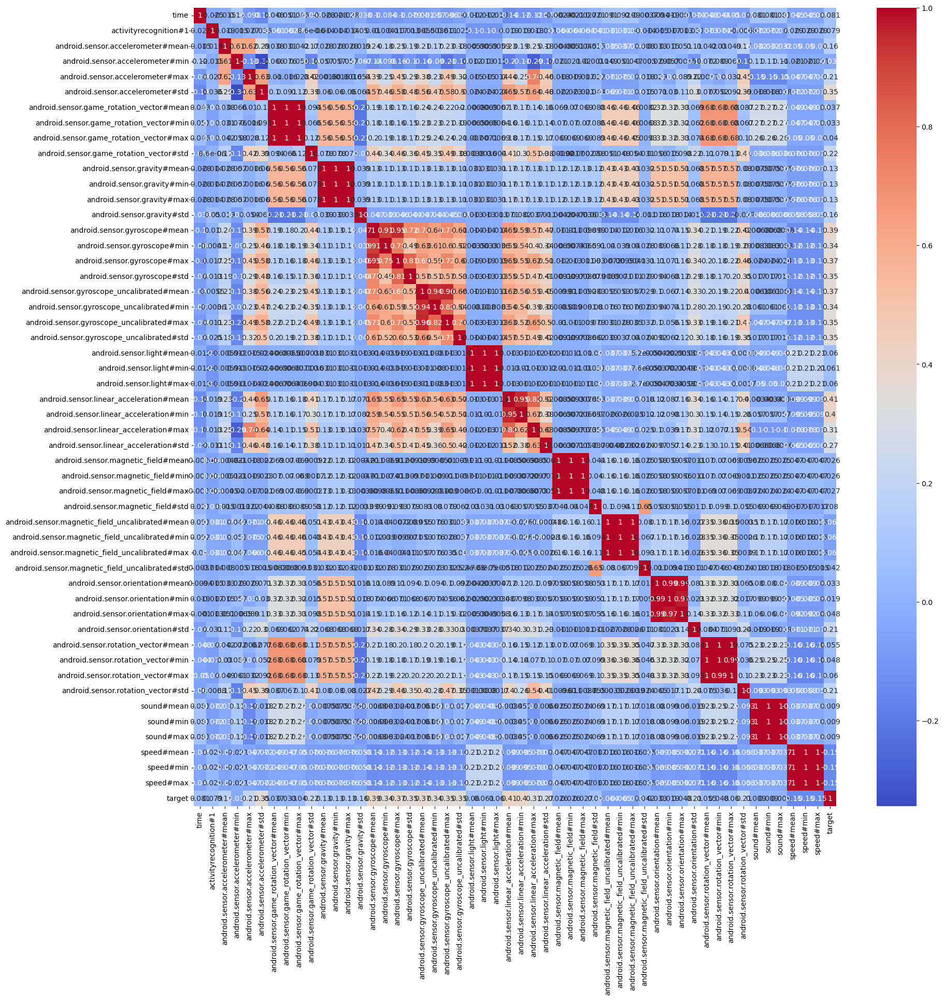

In [24]:
corr = df.corr()

plt.figure(figsize=(20,20))  
sns.heatmap(corr, annot = True, cmap = 'coolwarm')

In [25]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) >= threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [26]:
corr_features = correlation(df, 0.7)
len(set(corr_features))

27

In [27]:
corr_features

{'android.sensor.game_rotation_vector#max',
 'android.sensor.game_rotation_vector#min',
 'android.sensor.gravity#max',
 'android.sensor.gravity#min',
 'android.sensor.gyroscope#max',
 'android.sensor.gyroscope#min',
 'android.sensor.gyroscope#std',
 'android.sensor.gyroscope_uncalibrated#max',
 'android.sensor.gyroscope_uncalibrated#mean',
 'android.sensor.gyroscope_uncalibrated#min',
 'android.sensor.gyroscope_uncalibrated#std',
 'android.sensor.light#max',
 'android.sensor.light#min',
 'android.sensor.linear_acceleration#max',
 'android.sensor.linear_acceleration#min',
 'android.sensor.magnetic_field#max',
 'android.sensor.magnetic_field#min',
 'android.sensor.magnetic_field_uncalibrated#max',
 'android.sensor.magnetic_field_uncalibrated#min',
 'android.sensor.orientation#max',
 'android.sensor.orientation#min',
 'android.sensor.rotation_vector#max',
 'android.sensor.rotation_vector#min',
 'sound#max',
 'sound#min',
 'speed#max',
 'speed#min'}

In [28]:
df1 = df.drop(corr_features,axis=1)

In [29]:
df1

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#std,android.sensor.gravity#mean,android.sensor.gravity#std,...,android.sensor.magnetic_field#std,android.sensor.magnetic_field_uncalibrated#mean,android.sensor.magnetic_field_uncalibrated#std,android.sensor.orientation#mean,android.sensor.orientation#std,android.sensor.rotation_vector#mean,android.sensor.rotation_vector#std,sound#mean,speed#mean,target
0,3,62,10.053802,4.328630,14.419712,2.359507,0.629076,0.114439,9.806645,3.800000e-06,...,0.655650,38.660465,3.515975,69.212414,20.480671,0.551880,0.137706,0.000000,0.00,0
1,4,62,10.687402,6.373194,16.329818,2.912315,0.577839,0.079211,9.806640,4.620000e-06,...,0.890534,61.175710,6.865865,147.052105,18.099960,0.943359,0.046025,0.000000,0.00,0
2,5,62,11.816800,4.817410,16.854629,3.199759,0.651511,0.033566,9.806636,6.110000e-06,...,0.706742,72.826001,0.620963,138.203285,14.463783,0.943879,0.026574,0.000000,0.00,0
3,6,62,9.401312,6.124588,12.230792,1.572354,0.713226,0.014745,9.806635,5.950000e-06,...,0.116360,69.046004,2.365450,147.486429,20.478035,0.911758,0.014528,0.000000,0.00,0
4,7,62,10.389851,5.313790,38.533453,5.426978,0.707375,0.018754,9.806633,5.620000e-06,...,0.239648,69.424097,3.585474,142.051738,23.746712,0.926211,0.021917,0.000000,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62580,4066,51,10.105329,10.089159,10.135641,0.026270,0.834765,0.000162,9.806650,9.030000e-08,...,0.407428,79.829254,0.175239,356.129645,0.098269,0.837442,0.000220,89.761985,0.00,4
62581,604,100,9.544118,9.544118,9.544118,14.491194,0.965309,0.012192,9.806650,1.880000e-08,...,0.572358,177.278007,0.453734,197.447131,5.171732,0.980068,0.002820,89.747010,1.50,4
62582,1341,100,14.258467,14.258467,14.258467,0.829544,0.773370,0.014168,9.806650,1.420000e-07,...,0.352223,160.922798,0.052567,208.464276,36.220598,0.978259,0.000834,89.729460,0.00,4
62583,1186,90,10.726491,10.726491,10.726491,7.089701,0.789832,0.005423,9.806650,1.440000e-07,...,3.812070,119.849556,3.641726,122.660341,1.452735,0.787902,0.012880,89.778343,1.00,4


<AxesSubplot:>

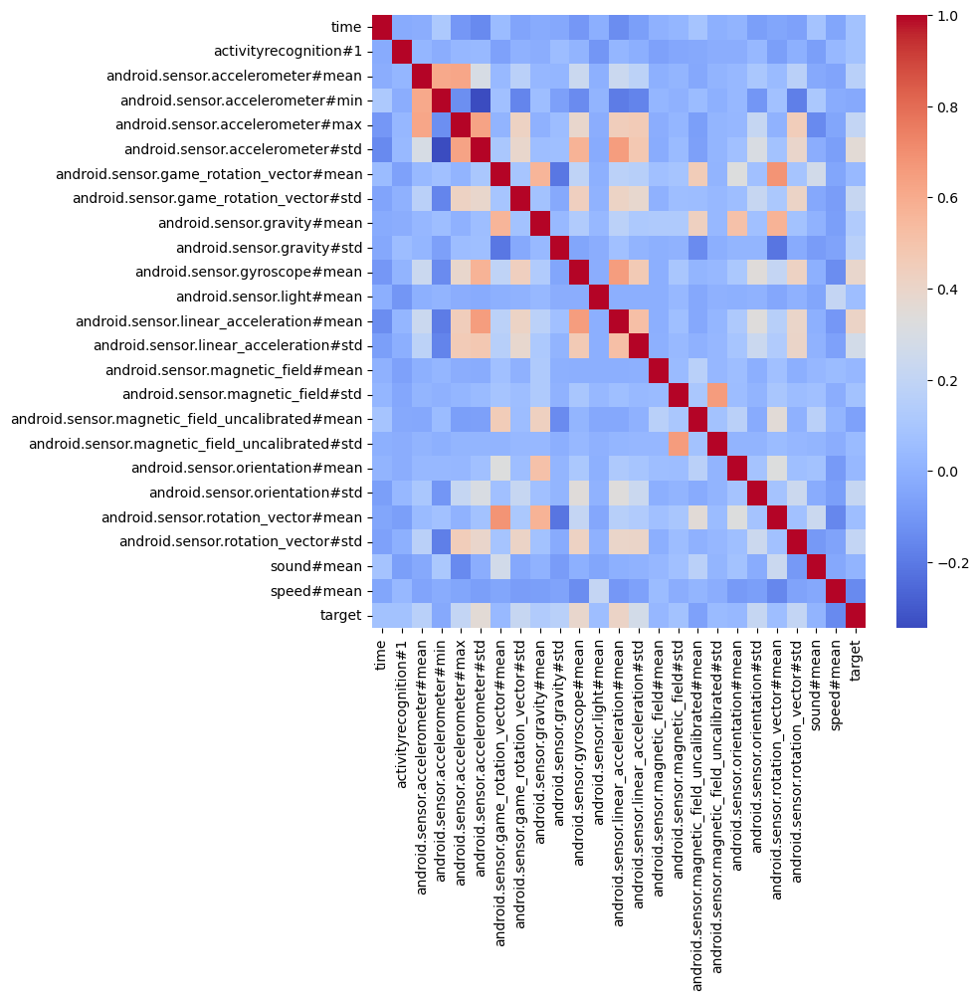

In [30]:
corr = df1.corr()

plt.figure(figsize=(8,8))  
sns.heatmap(corr, annot = False, cmap = 'coolwarm')

In [31]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62585 entries, 0 to 62584
Data columns (total 25 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   time                                             62585 non-null  int64  
 1   activityrecognition#1                            62585 non-null  int64  
 2   android.sensor.accelerometer#mean                62585 non-null  float64
 3   android.sensor.accelerometer#min                 62585 non-null  float64
 4   android.sensor.accelerometer#max                 62585 non-null  float64
 5   android.sensor.accelerometer#std                 62585 non-null  float64
 6   android.sensor.game_rotation_vector#mean         62585 non-null  float64
 7   android.sensor.game_rotation_vector#std          62585 non-null  float64
 8   android.sensor.gravity#mean                      62585 non-null  float64
 9   android.sensor.gravity#std  

In [32]:
final_df = df1

In [33]:
final_df

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#std,android.sensor.gravity#mean,android.sensor.gravity#std,...,android.sensor.magnetic_field#std,android.sensor.magnetic_field_uncalibrated#mean,android.sensor.magnetic_field_uncalibrated#std,android.sensor.orientation#mean,android.sensor.orientation#std,android.sensor.rotation_vector#mean,android.sensor.rotation_vector#std,sound#mean,speed#mean,target
0,3,62,10.053802,4.328630,14.419712,2.359507,0.629076,0.114439,9.806645,3.800000e-06,...,0.655650,38.660465,3.515975,69.212414,20.480671,0.551880,0.137706,0.000000,0.00,0
1,4,62,10.687402,6.373194,16.329818,2.912315,0.577839,0.079211,9.806640,4.620000e-06,...,0.890534,61.175710,6.865865,147.052105,18.099960,0.943359,0.046025,0.000000,0.00,0
2,5,62,11.816800,4.817410,16.854629,3.199759,0.651511,0.033566,9.806636,6.110000e-06,...,0.706742,72.826001,0.620963,138.203285,14.463783,0.943879,0.026574,0.000000,0.00,0
3,6,62,9.401312,6.124588,12.230792,1.572354,0.713226,0.014745,9.806635,5.950000e-06,...,0.116360,69.046004,2.365450,147.486429,20.478035,0.911758,0.014528,0.000000,0.00,0
4,7,62,10.389851,5.313790,38.533453,5.426978,0.707375,0.018754,9.806633,5.620000e-06,...,0.239648,69.424097,3.585474,142.051738,23.746712,0.926211,0.021917,0.000000,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62580,4066,51,10.105329,10.089159,10.135641,0.026270,0.834765,0.000162,9.806650,9.030000e-08,...,0.407428,79.829254,0.175239,356.129645,0.098269,0.837442,0.000220,89.761985,0.00,4
62581,604,100,9.544118,9.544118,9.544118,14.491194,0.965309,0.012192,9.806650,1.880000e-08,...,0.572358,177.278007,0.453734,197.447131,5.171732,0.980068,0.002820,89.747010,1.50,4
62582,1341,100,14.258467,14.258467,14.258467,0.829544,0.773370,0.014168,9.806650,1.420000e-07,...,0.352223,160.922798,0.052567,208.464276,36.220598,0.978259,0.000834,89.729460,0.00,4
62583,1186,90,10.726491,10.726491,10.726491,7.089701,0.789832,0.005423,9.806650,1.440000e-07,...,3.812070,119.849556,3.641726,122.660341,1.452735,0.787902,0.012880,89.778343,1.00,4


In [34]:
X = final_df.iloc[:,0:24] 
y = final_df.iloc[:,24]

In [35]:
X

,time,activityrecognition#1,android.sensor.accelerometer#mean,android.sensor.accelerometer#min,android.sensor.accelerometer#max,android.sensor.accelerometer#std,android.sensor.game_rotation_vector#mean,android.sensor.game_rotation_vector#std,android.sensor.gravity#mean,android.sensor.gravity#std,...,android.sensor.magnetic_field#mean,android.sensor.magnetic_field#std,android.sensor.magnetic_field_uncalibrated#mean,android.sensor.magnetic_field_uncalibrated#std,android.sensor.orientation#mean,android.sensor.orientation#std,android.sensor.rotation_vector#mean,android.sensor.rotation_vector#std,sound#mean,speed#mean
0,3,62,10.053802,4.328630,14.419712,2.359507,0.629076,0.114439,9.806645,3.800000e-06,...,26.294306,0.655650,38.660465,3.515975,69.212414,20.480671,0.551880,0.137706,0.000000,0.00
1,4,62,10.687402,6.373194,16.329818,2.912315,0.577839,0.079211,9.806640,4.620000e-06,...,26.295125,0.890534,61.175710,6.865865,147.052105,18.099960,0.943359,0.046025,0.000000,0.00
2,5,62,11.816800,4.817410,16.854629,3.199759,0.651511,0.033566,9.806636,6.110000e-06,...,27.048843,0.706742,72.826001,0.620963,138.203285,14.463783,0.943879,0.026574,0.000000,0.00
3,6,62,9.401312,6.124588,12.230792,1.572354,0.713226,0.014745,9.806635,5.950000e-06,...,25.878591,0.116360,69.046004,2.365450,147.486429,20.478035,0.911758,0.014528,0.000000,0.00
4,7,62,10.389851,5.313790,38.533453,5.426978,0.707375,0.018754,9.806633,5.620000e-06,...,25.599663,0.239648,69.424097,3.585474,142.051738,23.746712,0.926211,0.021917,0.000000,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62580,4066,51,10.105329,10.089159,10.135641,0.026270,0.834765,0.000162,9.806650,9.030000e-08,...,47.952133,0.407428,79.829254,0.175239,356.129645,0.098269,0.837442,0.000220,89.761985,0.00
62581,604,100,9.544118,9.544118,9.544118,14.491194,0.965309,0.012192,9.806650,1.880000e-08,...,39.067852,0.572358,177.278007,0.453734,197.447131,5.171732,0.980068,0.002820,89.747010,1.50
62582,1341,100,14.258467,14.258467,14.258467,0.829544,0.773370,0.014168,9.806650,1.420000e-07,...,44.275992,0.352223,160.922798,0.052567,208.464276,36.220598,0.978259,0.000834,89.729460,0.00
62583,1186,90,10.726491,10.726491,10.726491,7.089701,0.789832,0.005423,9.806650,1.440000e-07,...,59.172471,3.812070,119.849556,3.641726,122.660341,1.452735,0.787902,0.012880,89.778343,1.00


In [36]:
y

0        0
1        0
2        0
3        0
4        0
        ..
62580    4
62581    4
62582    4
62583    4
62584    4
Name: target, Length: 62585, dtype: int64

In [37]:
from sklearn.preprocessing import MinMaxScaler   #min max scaling

scaler = MinMaxScaler(feature_range=(0,1))

scaler.fit(X)

X_scaled = scaler.transform(X)

In [38]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test =train_test_split(X_scaled,y,test_size=0.20)

In [39]:
y_train.shape

(50068,)

In [40]:
from re import L

def create_clients(feature_list, label_list, num_clients=5, initial='clients'):
    ''' return: a dictionary with keys clients' names and value as 
                data shards - tuple of features and label lists.
        args: 
            feature_list: a list of numpy arrays of training features
            label_list:a list of binarized labels for each feature
            num_client: number of fedrated members (clients)
            initials: the clients'name prefix, e.g, clients_1 
            
    '''

    #create a list of client names
    client_names = ['{}_{}'.format(initial, i+1) for i in range(num_clients)]

    #randomize the data
    print(len(feature_list))
    print(len(label_list))
    data = list(zip(feature_list, label_list))
    print(len(data))
    random.shuffle(data)
    #shard data and place at each client
    size = len(data)//num_clients
    shards = [data[i:i + size] for i in range(0, size*num_clients, size)]

    #number of clients must equal number of shards
    assert(len(shards) == len(client_names))

    return {client_names[i] : shards[i] for i in range(len(client_names))} 

In [41]:
X_train.shape

(50068, 24)

In [42]:
#create clients
clients = create_clients(X_train, y_train, num_clients=5, initial='client')

50068
50068
50068


In [43]:
len(clients['client_3'])

10013

In [44]:
def batch_data(data_shard, bs=32):
    '''Takes in a clients data shard and create a tfds object off it
    args:
        shard: a data, label constituting a client's data shard
        bs:batch size
    return:
        tfds object'''
    #seperate shard into data and labels lists
    data, label = zip(*data_shard)
    dataset = tf.data.Dataset.from_tensor_slices((list(data), list(label)))
    return dataset.shuffle(len(label)).batch(bs)

In [45]:

#process and batch the training data for each client
clients_batched = dict()
for (client_name, data) in clients.items():
    clients_batched[client_name] = batch_data(data)
    
#process and batch the test set  
test_batched = tf.data.Dataset.from_tensor_slices((X_test, y_test)).batch(len(y_test))

In [46]:
class SimpleMLP:
    @staticmethod
    def build(shape, classes):
        model = Sequential()
        model.add(Dense(256, input_shape=(24,)))
        model.add(Activation("relu"))
        model.add(Dropout(0.45))
        model.add(Dense(256))
        model.add(Activation("relu"))
        model.add(Dropout(0.45))
        model.add(Dense(5))
        model.add(Activation("softmax"))
        return model

In [47]:

lr = 0.01 
comms_round = 200
loss='sparse_categorical_crossentropy'
metrics = ['sparse_categorical_accuracy']
optimizer = SGD(learning_rate=lr, 
                decay=lr / comms_round, 
                momentum=0.9)  

In [48]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from itertools import cycle
from sklearn.preprocessing import LabelBinarizer
def weight_scalling_factor(clients_trn_data, client_name):
    client_names = list(clients_trn_data.keys())
    #get the bs
    bs = list(clients_trn_data[client_name])[0][0].shape[0]
    #first calculate the total training data points across clinets
    global_count = sum([tf.data.experimental.cardinality(clients_trn_data[client_name]).numpy() for client_name in client_names])*bs
    # get the total number of data points held by a client
    local_count = tf.data.experimental.cardinality(clients_trn_data[client_name]).numpy()*bs
    return local_count/global_count


def scale_model_weights(weight, scalar):
    '''function for scaling a models weights'''
    weight_final = []
    steps = len(weight)
    for i in range(steps):
        weight_final.append(scalar * weight[i])
    return weight_final



def sum_scaled_weights(scaled_weight_list):
    '''Return the sum of the listed scaled weights. The is equivalent to scaled avg of the weights'''
    avg_grad = list()
    #get the average grad accross all client gradients
    for grad_list_tuple in zip(*scaled_weight_list):
        layer_mean = tf.math.reduce_sum(grad_list_tuple, axis=0)
        avg_grad.append(layer_mean)
        
    return avg_grad


def test_model(X_test, Y_test,  model, comm_round):
    y_pred = []
    cce = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    #logits = model.predict(X_test, batch_size=100)
    logits = model.predict(X_test)
    c1 = tf.argmax(logits, axis=1).numpy()
    for i in range(len(c1)):
        y_pred.append(c1[i])

    y_pred = np.array(y_pred)

    print("y_pred =", y_pred)
    loss = cce(Y_test, logits)
    print("y_test =", Y_test)
    acc = accuracy_score(y_pred, Y_test)
    print(y_pred.shape)
    print(Y_test.shape)
    print('comm_round: {} | global_acc: {:.3%} | global_loss: {}'.format(comm_round, acc, loss))
    cf=classification_report(Y_test,y_pred)
    print(cf)

    target= ["Bus","Car", "Still","Train","Walking"]

    # set plot figure size
    fig, c_ax = plt.subplots(1,1, figsize = (8, 6))
    lb = LabelBinarizer()
    lb.fit(Y_test)
    Y_test = lb.transform(Y_test)
    y_pred = lb.transform(y_pred)

    for (idx, c_label) in enumerate(target):
        fpr, tpr, thresholds = roc_curve(Y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
    print(roc_auc_score(Y_test, y_pred, average="macro"))


    c_ax.legend()
    c_ax.set_xlabel('False Positive Rate', size=14)
    c_ax.set_ylabel('True Positive Rate', size=14)
    c_ax.set_title('ROC Curve for FedMLP (half-second window)', size=14)
    plt.show()
    
    return acc, loss

313/313 [==============================] - 1s 4ms/step - loss: 1.4486 - sparse_categorical_accuracy: 0.3662
y_pred = [0 0 0 ... 0 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 0 | global_acc: 54.933% | global_loss: 1.4835350513458252
              precision    recall  f1-score   support

           0       0.42      0.70      0.52      2487
           1       0.57      0.69      0.63      2516
           2       0.61      0.66      0.63      2498
           3       0.35      0.15      0.21      2471
           4       0.91      0.54      0.68      2545

    accuracy                           0.55     12517
   macro avg       0.57      0.55      0.53     12517
weighted avg       0.57      0.55      0.54     12517

0.7179372044382577


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


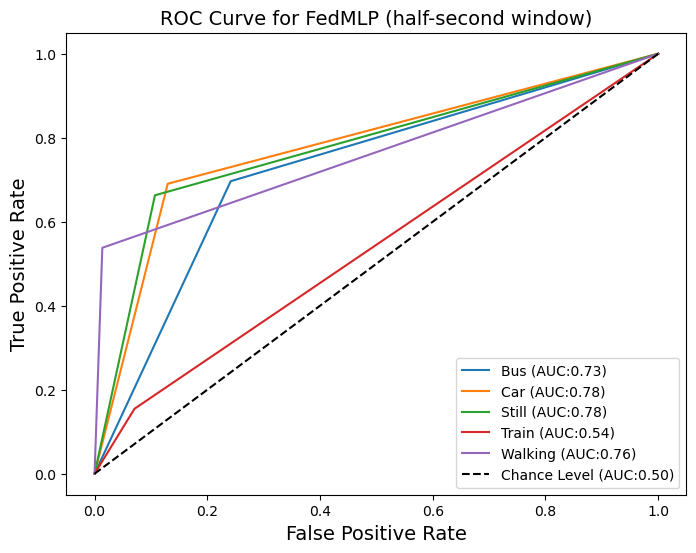

313/313 [==============================] - 2s 4ms/step - loss: 1.1129 - sparse_categorical_accuracy: 0.5600
y_pred = [0 0 1 ... 0 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 1 | global_acc: 68.291% | global_loss: 1.3505756855010986
              precision    recall  f1-score   support

           0       0.56      0.79      0.65      2487
           1       0.68      0.72      0.70      2516
           2       0.69      0.81      0.75      2498
           3       0.58      0.25      0.35      2471
           4       0.91      0.85      0.88      2545

    accuracy                           0.68     12517
   macro avg       0.68      0.68      0.66     12517
weighted avg       0.68      0.68      0.67     12517

0.8010830631798388


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


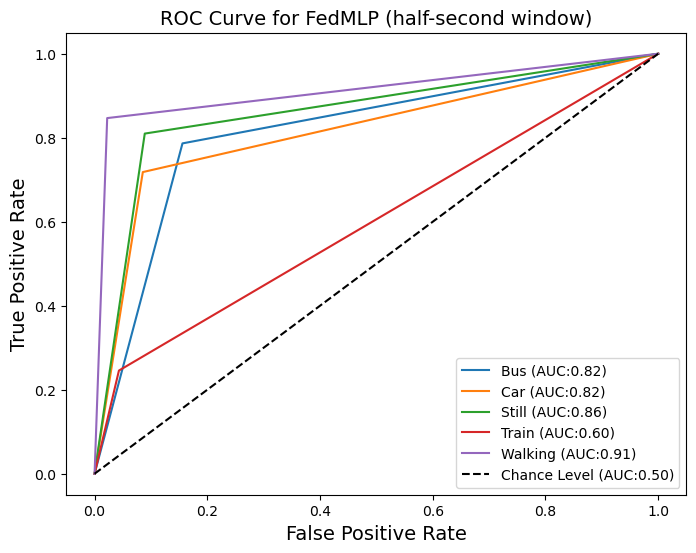

313/313 [==============================] - 1s 4ms/step - loss: 0.9006 - sparse_categorical_accuracy: 0.6603
y_pred = [0 0 0 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 2 | global_acc: 74.475% | global_loss: 1.2773634195327759
              precision    recall  f1-score   support

           0       0.59      0.85      0.70      2487
           1       0.81      0.70      0.75      2516
           2       0.75      0.85      0.79      2498
           3       0.73      0.46      0.57      2471
           4       0.92      0.86      0.89      2545

    accuracy                           0.74     12517
   macro avg       0.76      0.74      0.74     12517
weighted avg       0.76      0.74      0.74     12517

0.8400560151738222


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


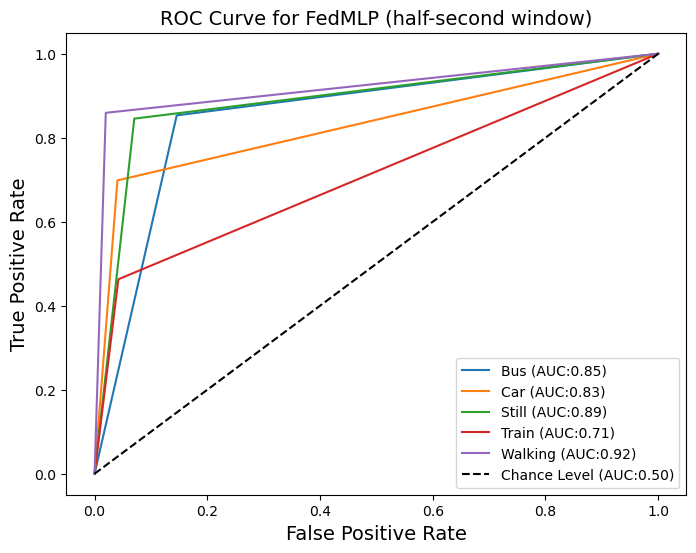

313/313 [==============================] - 1s 4ms/step - loss: 0.8008 - sparse_categorical_accuracy: 0.7053
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 3 | global_acc: 78.845% | global_loss: 1.2306267023086548
              precision    recall  f1-score   support

           0       0.68      0.80      0.74      2487
           1       0.87      0.74      0.80      2516
           2       0.75      0.88      0.81      2498
           3       0.77      0.63      0.69      2471
           4       0.91      0.89      0.90      2545

    accuracy                           0.79     12517
   macro avg       0.80      0.79      0.79     12517
weighted avg       0.80      0.79      0.79     12517

0.86747688813969


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


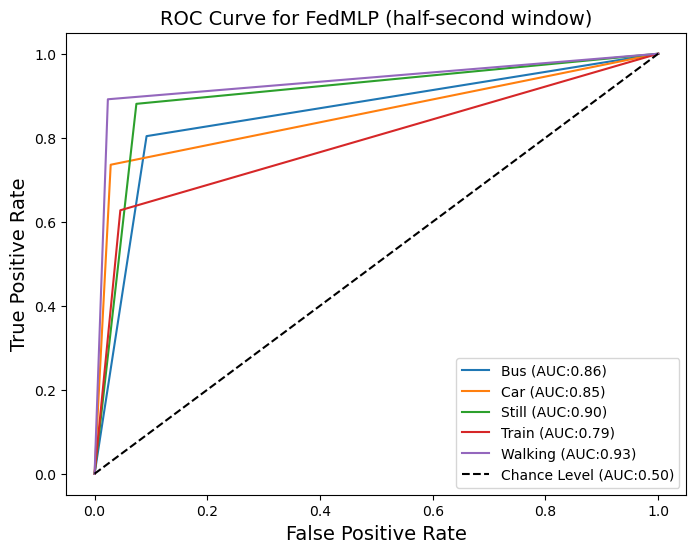

313/313 [==============================] - 1s 4ms/step - loss: 0.7605 - sparse_categorical_accuracy: 0.7224
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 4 | global_acc: 79.572% | global_loss: 1.2039594650268555
              precision    recall  f1-score   support

           0       0.67      0.84      0.74      2487
           1       0.87      0.75      0.80      2516
           2       0.78      0.85      0.81      2498
           3       0.80      0.62      0.70      2471
           4       0.90      0.91      0.91      2545

    accuracy                           0.80     12517
   macro avg       0.80      0.80      0.79     12517
weighted avg       0.80      0.80      0.79     12517

0.8719848943170465


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


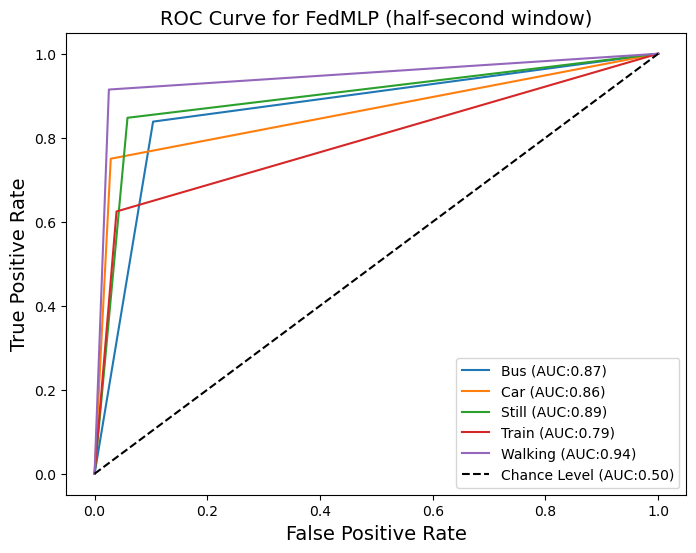

313/313 [==============================] - 1s 4ms/step - loss: 0.6973 - sparse_categorical_accuracy: 0.7437
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 5 | global_acc: 79.971% | global_loss: 1.1961766481399536
              precision    recall  f1-score   support

           0       0.67      0.88      0.76      2487
           1       0.90      0.73      0.81      2516
           2       0.74      0.88      0.81      2498
           3       0.84      0.62      0.71      2471
           4       0.93      0.90      0.91      2545

    accuracy                           0.80     12517
   macro avg       0.82      0.80      0.80     12517
weighted avg       0.82      0.80      0.80     12517

0.8745439514660042


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


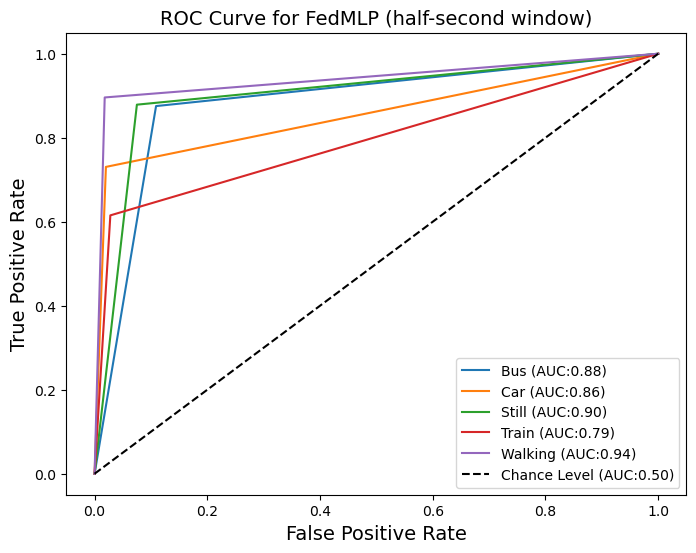

313/313 [==============================] - 1s 4ms/step - loss: 0.6991 - sparse_categorical_accuracy: 0.7468
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 6 | global_acc: 81.529% | global_loss: 1.1778491735458374
              precision    recall  f1-score   support

           0       0.68      0.87      0.76      2487
           1       0.89      0.76      0.82      2516
           2       0.82      0.85      0.83      2498
           3       0.81      0.69      0.74      2471
           4       0.92      0.91      0.92      2545

    accuracy                           0.82     12517
   macro avg       0.82      0.81      0.82     12517
weighted avg       0.82      0.82      0.82     12517

0.8843188706827474


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


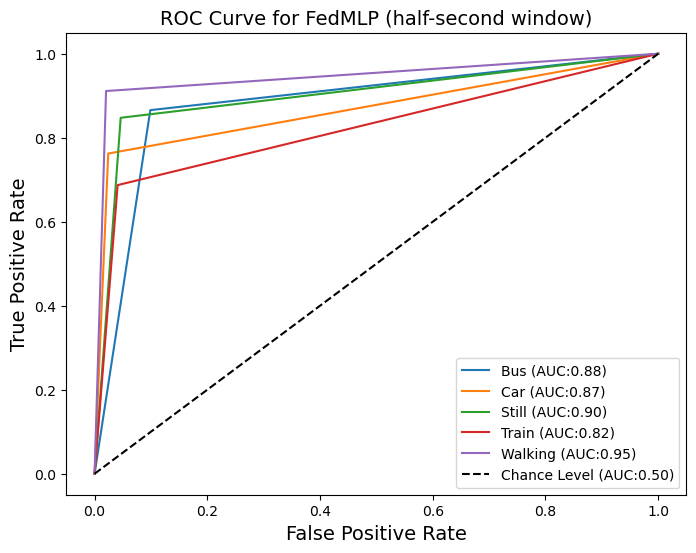

313/313 [==============================] - 1s 4ms/step - loss: 0.6645 - sparse_categorical_accuracy: 0.7598
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 7 | global_acc: 81.521% | global_loss: 1.1700093746185303
              precision    recall  f1-score   support

           0       0.67      0.89      0.76      2487
           1       0.91      0.75      0.82      2516
           2       0.83      0.82      0.83      2498
           3       0.79      0.72      0.75      2471
           4       0.94      0.90      0.92      2545

    accuracy                           0.82     12517
   macro avg       0.83      0.81      0.82     12517
weighted avg       0.83      0.82      0.82     12517

0.8843488468340887


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


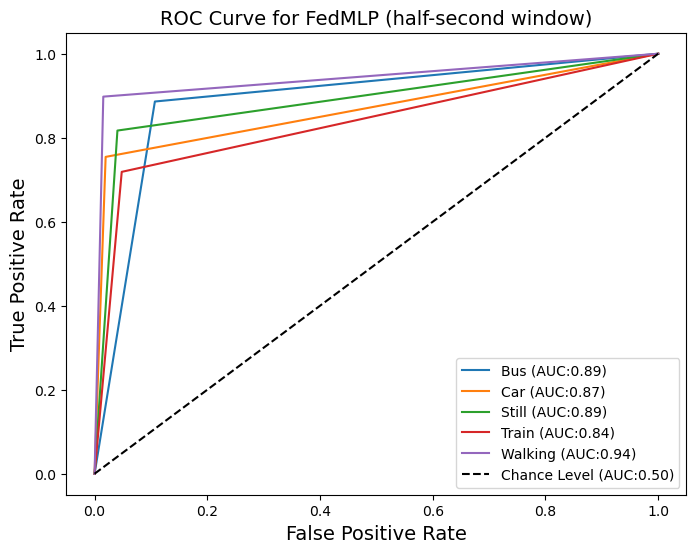

313/313 [==============================] - 1s 4ms/step - loss: 0.6514 - sparse_categorical_accuracy: 0.7650
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 8 | global_acc: 81.865% | global_loss: 1.164273738861084
              precision    recall  f1-score   support

           0       0.68      0.85      0.76      2487
           1       0.91      0.77      0.83      2516
           2       0.82      0.84      0.83      2498
           3       0.85      0.70      0.76      2471
           4       0.88      0.94      0.91      2545

    accuracy                           0.82     12517
   macro avg       0.83      0.82      0.82     12517
weighted avg       0.83      0.82      0.82     12517

0.8863620393073128


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


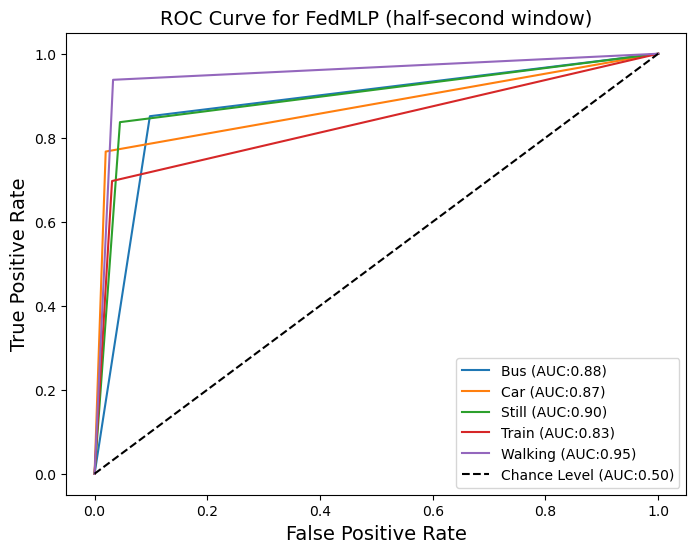

313/313 [==============================] - 1s 4ms/step - loss: 0.6277 - sparse_categorical_accuracy: 0.7741
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 9 | global_acc: 81.441% | global_loss: 1.1603444814682007
              precision    recall  f1-score   support

           0       0.66      0.90      0.76      2487
           1       0.92      0.75      0.82      2516
           2       0.79      0.87      0.83      2498
           3       0.87      0.64      0.74      2471
           4       0.93      0.91      0.92      2545

    accuracy                           0.81     12517
   macro avg       0.83      0.81      0.81     12517
weighted avg       0.83      0.81      0.81     12517

0.8837459340272809


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


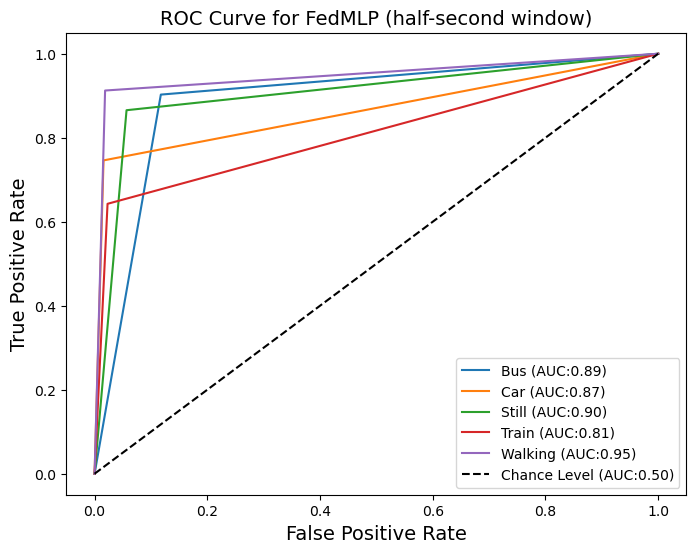

313/313 [==============================] - 1s 4ms/step - loss: 0.6151 - sparse_categorical_accuracy: 0.7721
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 10 | global_acc: 82.887% | global_loss: 1.1506705284118652
              precision    recall  f1-score   support

           0       0.73      0.87      0.79      2487
           1       0.90      0.78      0.84      2516
           2       0.79      0.88      0.83      2498
           3       0.84      0.70      0.76      2471
           4       0.93      0.91      0.92      2545

    accuracy                           0.83     12517
   macro avg       0.84      0.83      0.83     12517
weighted avg       0.84      0.83      0.83     12517

0.892812312397323


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


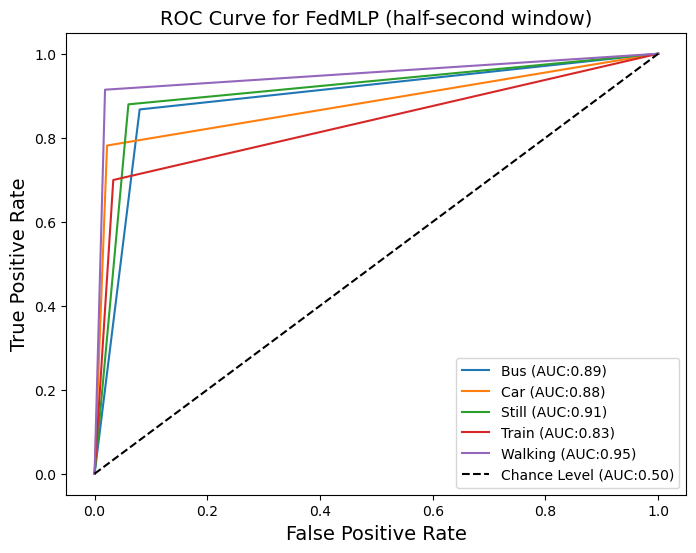

313/313 [==============================] - 1s 4ms/step - loss: 0.6033 - sparse_categorical_accuracy: 0.7824
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 11 | global_acc: 81.465% | global_loss: 1.1512593030929565
              precision    recall  f1-score   support

           0       0.67      0.91      0.77      2487
           1       0.92      0.76      0.83      2516
           2       0.78      0.88      0.82      2498
           3       0.86      0.63      0.73      2471
           4       0.94      0.90      0.92      2545

    accuracy                           0.81     12517
   macro avg       0.83      0.81      0.81     12517
weighted avg       0.83      0.81      0.81     12517

0.883917155286302


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


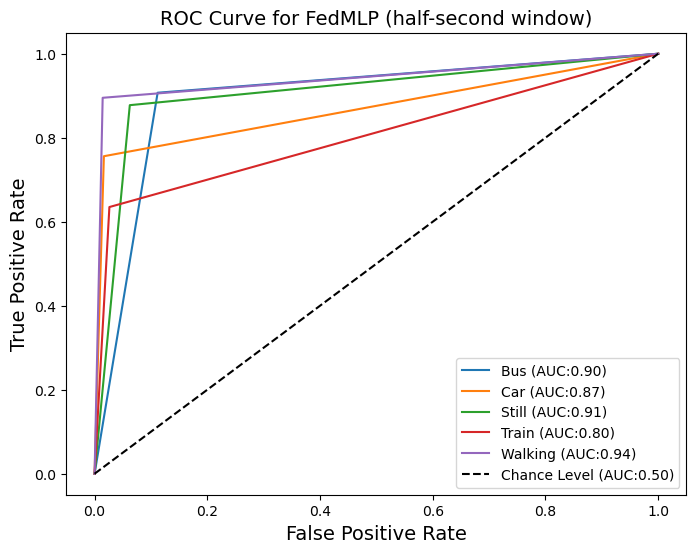

313/313 [==============================] - 1s 4ms/step - loss: 0.6037 - sparse_categorical_accuracy: 0.7826
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 12 | global_acc: 83.423% | global_loss: 1.1423062086105347
              precision    recall  f1-score   support

           0       0.72      0.88      0.80      2487
           1       0.92      0.75      0.83      2516
           2       0.80      0.87      0.84      2498
           3       0.83      0.76      0.79      2471
           4       0.94      0.91      0.92      2545

    accuracy                           0.83     12517
   macro avg       0.84      0.83      0.83     12517
weighted avg       0.84      0.83      0.83     12517

0.896268812672522


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


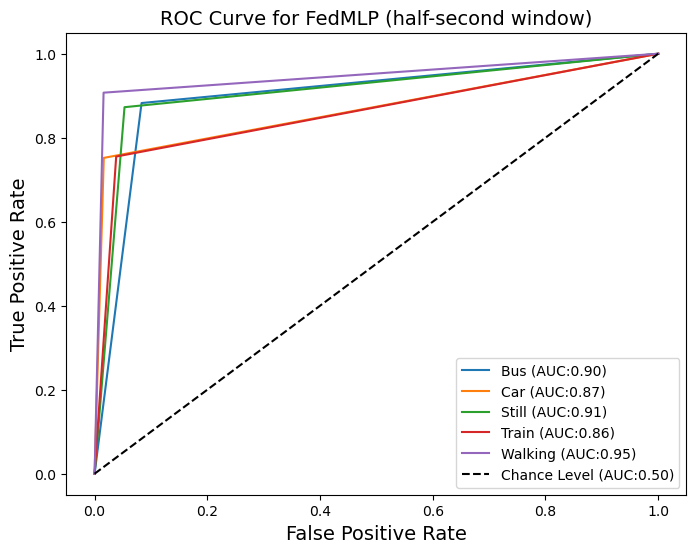

313/313 [==============================] - 1s 4ms/step - loss: 0.5904 - sparse_categorical_accuracy: 0.7905
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 13 | global_acc: 82.783% | global_loss: 1.1368571519851685
              precision    recall  f1-score   support

           0       0.69      0.89      0.78      2487
           1       0.92      0.78      0.84      2516
           2       0.80      0.87      0.83      2498
           3       0.85      0.69      0.76      2471
           4       0.94      0.91      0.92      2545

    accuracy                           0.83     12517
   macro avg       0.84      0.83      0.83     12517
weighted avg       0.84      0.83      0.83     12517

0.8921790273343693


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


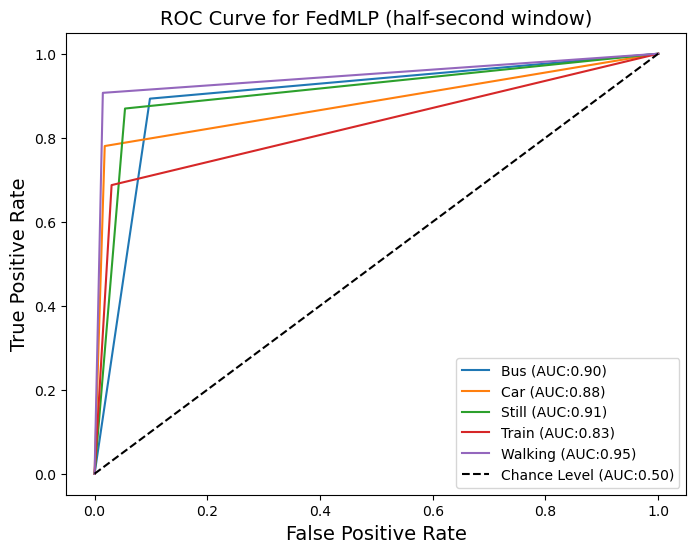

313/313 [==============================] - 1s 4ms/step - loss: 0.5866 - sparse_categorical_accuracy: 0.7891
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 14 | global_acc: 83.998% | global_loss: 1.1264034509658813
              precision    recall  f1-score   support

           0       0.76      0.86      0.81      2487
           1       0.92      0.78      0.85      2516
           2       0.82      0.86      0.84      2498
           3       0.81      0.76      0.78      2471
           4       0.92      0.92      0.92      2545

    accuracy                           0.84     12517
   macro avg       0.84      0.84      0.84     12517
weighted avg       0.84      0.84      0.84     12517

0.8998097007460608


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


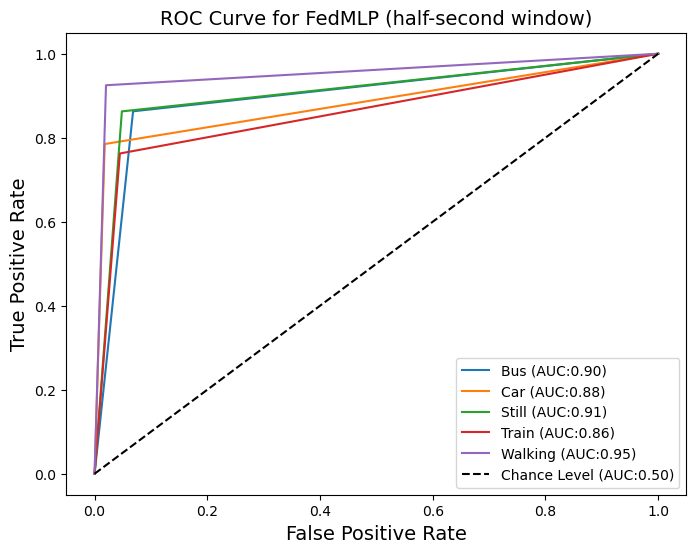

313/313 [==============================] - 2s 4ms/step - loss: 0.5559 - sparse_categorical_accuracy: 0.7998
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 15 | global_acc: 83.686% | global_loss: 1.1285098791122437
              precision    recall  f1-score   support

           0       0.74      0.88      0.80      2487
           1       0.91      0.78      0.84      2516
           2       0.79      0.89      0.84      2498
           3       0.86      0.70      0.77      2471
           4       0.92      0.92      0.92      2545

    accuracy                           0.84     12517
   macro avg       0.84      0.84      0.84     12517
weighted avg       0.85      0.84      0.84     12517

0.8978059915540862


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


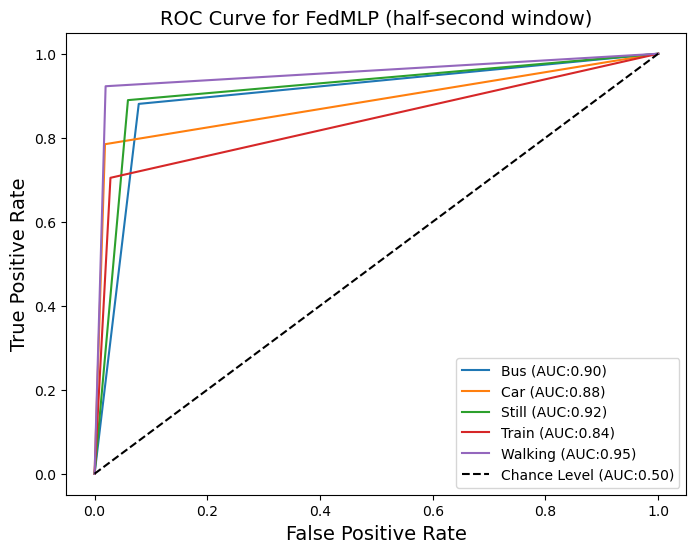

313/313 [==============================] - 1s 4ms/step - loss: 0.5753 - sparse_categorical_accuracy: 0.7959
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 16 | global_acc: 83.758% | global_loss: 1.1242661476135254
              precision    recall  f1-score   support

           0       0.73      0.88      0.80      2487
           1       0.92      0.79      0.85      2516
           2       0.80      0.88      0.84      2498
           3       0.85      0.71      0.77      2471
           4       0.92      0.92      0.92      2545

    accuracy                           0.84     12517
   macro avg       0.85      0.84      0.84     12517
weighted avg       0.85      0.84      0.84     12517

0.898261039018878


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


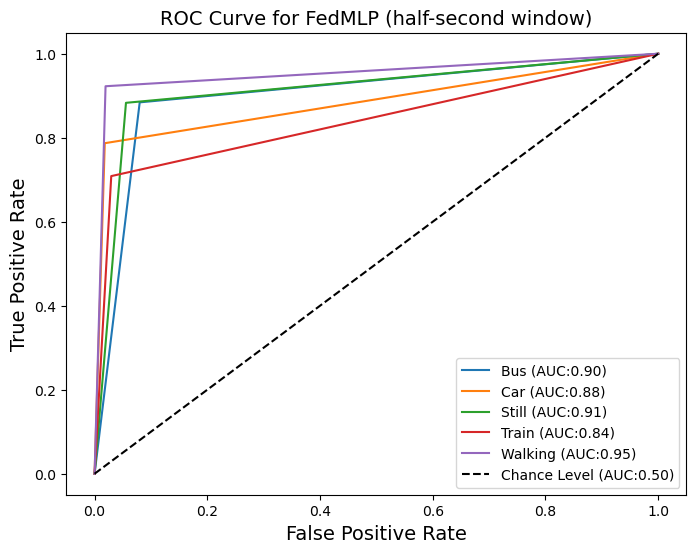

313/313 [==============================] - 1s 4ms/step - loss: 0.5509 - sparse_categorical_accuracy: 0.8026
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 17 | global_acc: 83.846% | global_loss: 1.1192407608032227
              precision    recall  f1-score   support

           0       0.75      0.87      0.81      2487
           1       0.91      0.79      0.85      2516
           2       0.81      0.86      0.84      2498
           3       0.82      0.74      0.78      2471
           4       0.92      0.92      0.92      2545

    accuracy                           0.84     12517
   macro avg       0.84      0.84      0.84     12517
weighted avg       0.84      0.84      0.84     12517

0.8988462079735611


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


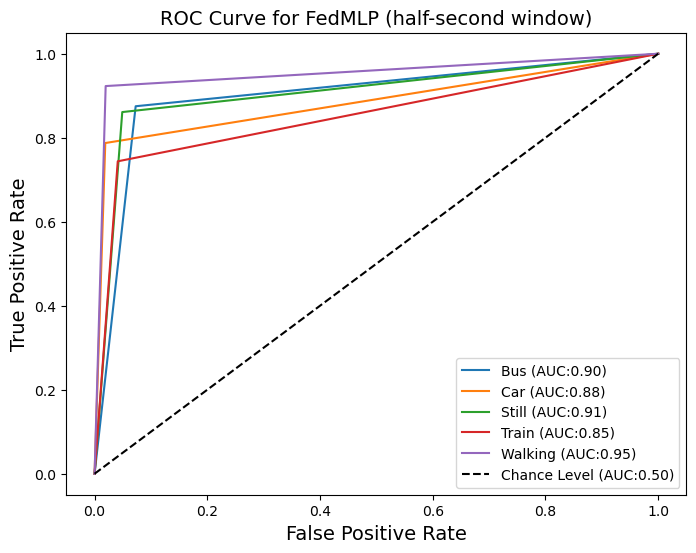

313/313 [==============================] - 1s 4ms/step - loss: 0.5575 - sparse_categorical_accuracy: 0.7993
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 18 | global_acc: 84.126% | global_loss: 1.120827078819275
              precision    recall  f1-score   support

           0       0.74      0.88      0.80      2487
           1       0.92      0.79      0.85      2516
           2       0.83      0.86      0.84      2498
           3       0.84      0.74      0.79      2471
           4       0.90      0.94      0.92      2545

    accuracy                           0.84     12517
   macro avg       0.85      0.84      0.84     12517
weighted avg       0.85      0.84      0.84     12517

0.9005627704803827


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


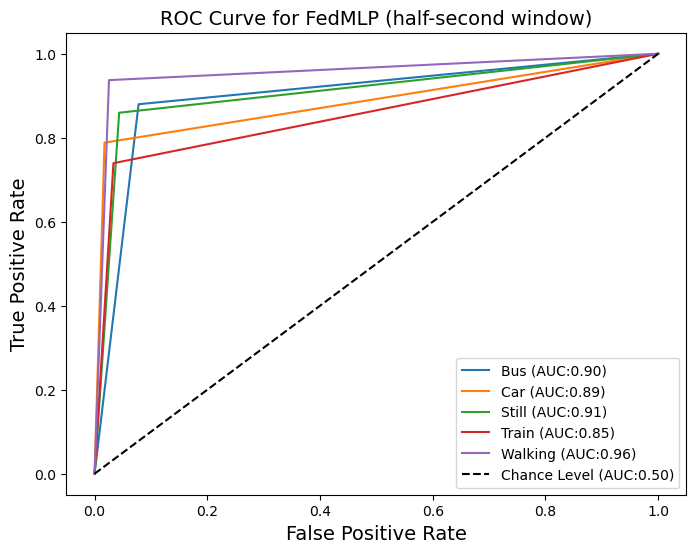

313/313 [==============================] - 1s 4ms/step - loss: 0.5316 - sparse_categorical_accuracy: 0.8096
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 19 | global_acc: 84.197% | global_loss: 1.1146279573440552
              precision    recall  f1-score   support

           0       0.74      0.88      0.81      2487
           1       0.92      0.79      0.85      2516
           2       0.84      0.85      0.84      2498
           3       0.81      0.76      0.79      2471
           4       0.92      0.93      0.92      2545

    accuracy                           0.84     12517
   macro avg       0.85      0.84      0.84     12517
weighted avg       0.85      0.84      0.84     12517

0.9010552103264237


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


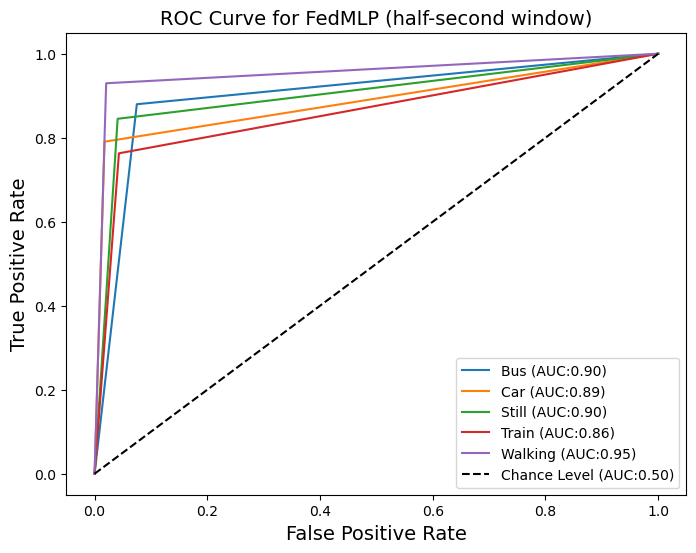

313/313 [==============================] - 1s 4ms/step - loss: 0.5394 - sparse_categorical_accuracy: 0.8058
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 20 | global_acc: 84.317% | global_loss: 1.115858793258667
              precision    recall  f1-score   support

           0       0.75      0.88      0.81      2487
           1       0.91      0.80      0.85      2516
           2       0.81      0.88      0.84      2498
           3       0.84      0.73      0.78      2471
           4       0.93      0.92      0.93      2545

    accuracy                           0.84     12517
   macro avg       0.85      0.84      0.84     12517
weighted avg       0.85      0.84      0.84     12517

0.9017780762520445


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


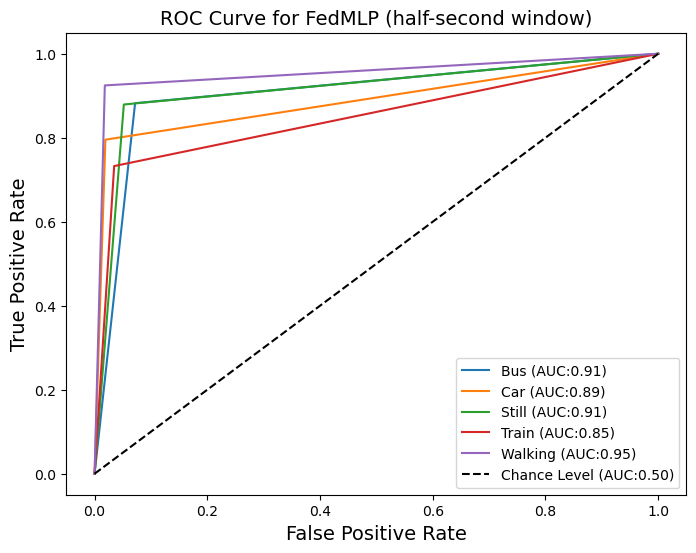

313/313 [==============================] - 1s 4ms/step - loss: 0.5433 - sparse_categorical_accuracy: 0.8056
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 21 | global_acc: 84.397% | global_loss: 1.1169841289520264
              precision    recall  f1-score   support

           0       0.74      0.90      0.81      2487
           1       0.92      0.80      0.86      2516
           2       0.81      0.87      0.84      2498
           3       0.85      0.73      0.78      2471
           4       0.93      0.92      0.93      2545

    accuracy                           0.84     12517
   macro avg       0.85      0.84      0.84     12517
weighted avg       0.85      0.84      0.84     12517

0.9022785866969769


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


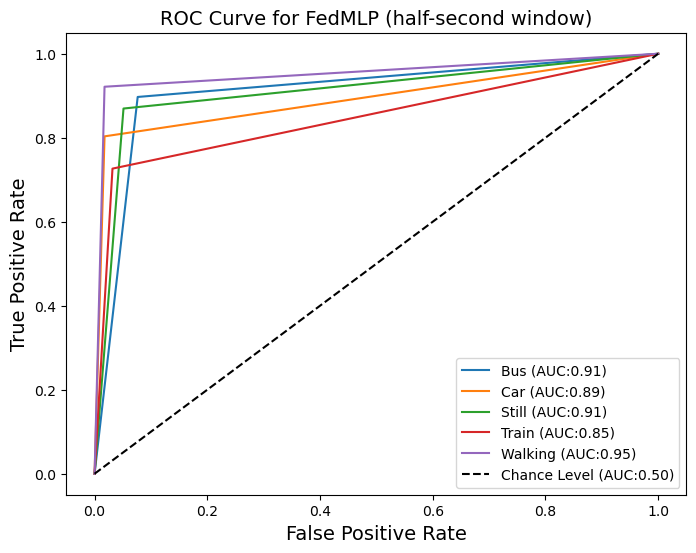

313/313 [==============================] - 1s 4ms/step - loss: 0.5268 - sparse_categorical_accuracy: 0.8123
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 22 | global_acc: 84.797% | global_loss: 1.1098332405090332
              precision    recall  f1-score   support

           0       0.77      0.87      0.82      2487
           1       0.93      0.79      0.85      2516
           2       0.82      0.87      0.85      2498
           3       0.83      0.78      0.80      2471
           4       0.92      0.93      0.92      2545

    accuracy                           0.85     12517
   macro avg       0.85      0.85      0.85     12517
weighted avg       0.85      0.85      0.85     12517

0.9048199445325776


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


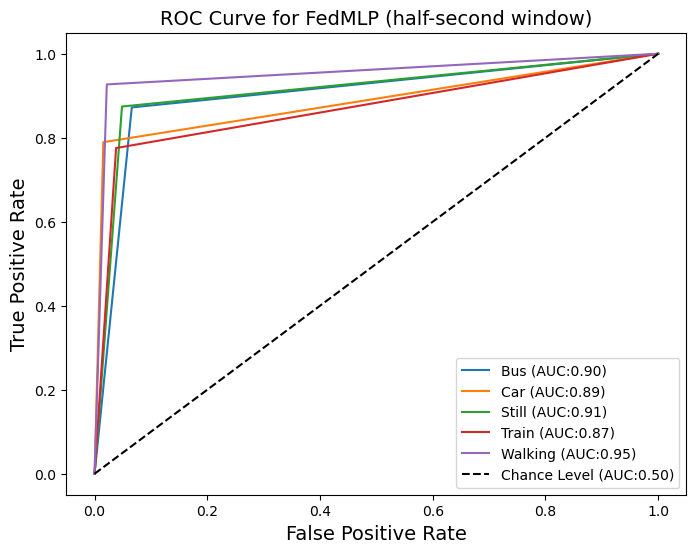

313/313 [==============================] - 1s 4ms/step - loss: 0.5277 - sparse_categorical_accuracy: 0.8068
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 23 | global_acc: 84.789% | global_loss: 1.108109712600708
              precision    recall  f1-score   support

           0       0.76      0.88      0.82      2487
           1       0.92      0.80      0.86      2516
           2       0.82      0.87      0.84      2498
           3       0.84      0.76      0.79      2471
           4       0.92      0.93      0.93      2545

    accuracy                           0.85     12517
   macro avg       0.85      0.85      0.85     12517
weighted avg       0.85      0.85      0.85     12517

0.9047417253386412


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


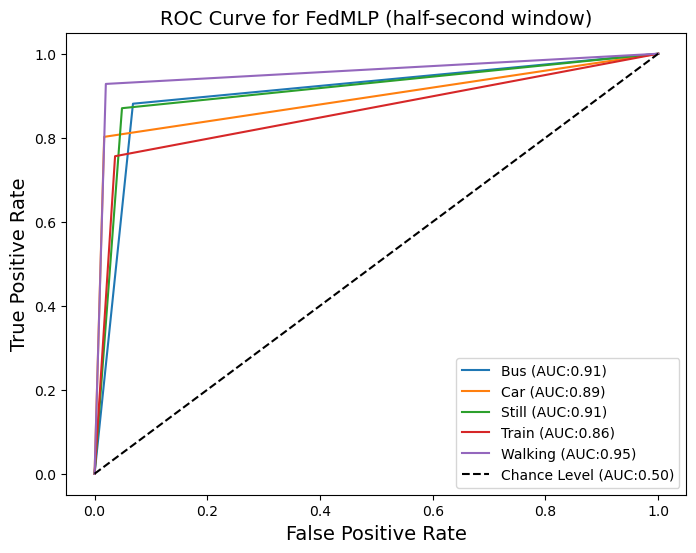

313/313 [==============================] - 1s 4ms/step - loss: 0.5246 - sparse_categorical_accuracy: 0.8114
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 24 | global_acc: 85.036% | global_loss: 1.1127997636795044
              precision    recall  f1-score   support

           0       0.75      0.90      0.82      2487
           1       0.93      0.81      0.87      2516
           2       0.80      0.89      0.85      2498
           3       0.86      0.74      0.79      2471
           4       0.95      0.91      0.93      2545

    accuracy                           0.85     12517
   macro avg       0.86      0.85      0.85     12517
weighted avg       0.86      0.85      0.85     12517

0.9062993927276579


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


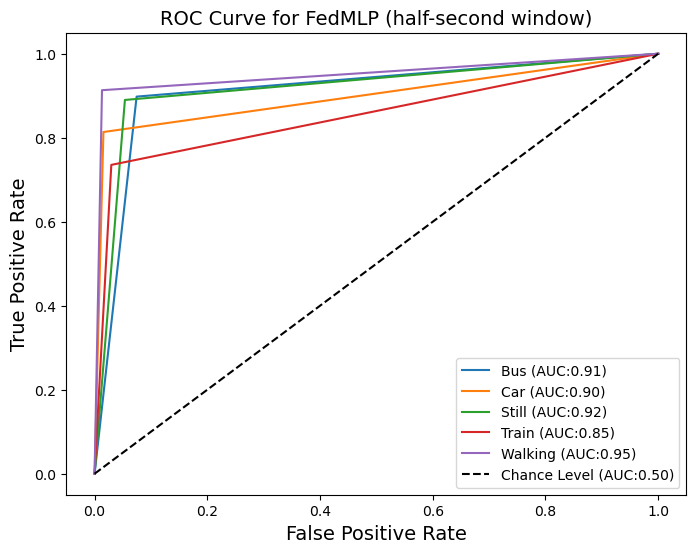

313/313 [==============================] - 1s 4ms/step - loss: 0.5223 - sparse_categorical_accuracy: 0.8096
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 25 | global_acc: 85.060% | global_loss: 1.1075419187545776
              precision    recall  f1-score   support

           0       0.75      0.90      0.82      2487
           1       0.93      0.81      0.86      2516
           2       0.84      0.86      0.85      2498
           3       0.83      0.76      0.79      2471
           4       0.94      0.92      0.93      2545

    accuracy                           0.85     12517
   macro avg       0.86      0.85      0.85     12517
weighted avg       0.86      0.85      0.85     12517

0.906467038108771


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


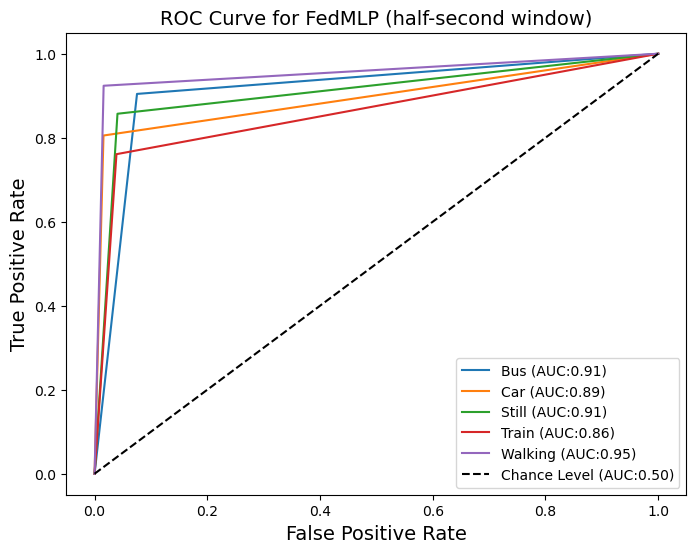

313/313 [==============================] - 2s 4ms/step - loss: 0.5180 - sparse_categorical_accuracy: 0.8098
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 26 | global_acc: 85.372% | global_loss: 1.1041263341903687
              precision    recall  f1-score   support

           0       0.76      0.89      0.82      2487
           1       0.92      0.81      0.86      2516
           2       0.83      0.87      0.85      2498
           3       0.85      0.76      0.80      2471
           4       0.93      0.93      0.93      2545

    accuracy                           0.85     12517
   macro avg       0.86      0.85      0.85     12517
weighted avg       0.86      0.85      0.85     12517

0.9083965560033785


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


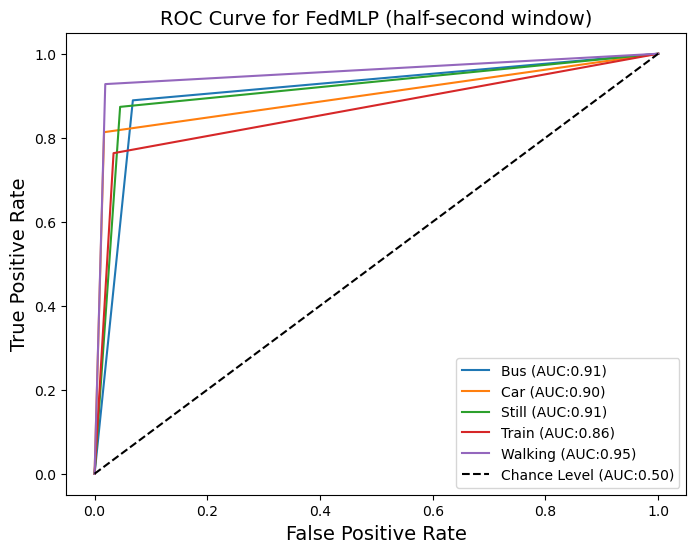

313/313 [==============================] - 2s 4ms/step - loss: 0.5052 - sparse_categorical_accuracy: 0.8229
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 27 | global_acc: 86.051% | global_loss: 1.1015948057174683
              precision    recall  f1-score   support

           0       0.80      0.88      0.84      2487
           1       0.93      0.82      0.87      2516
           2       0.85      0.87      0.86      2498
           3       0.80      0.82      0.81      2471
           4       0.94      0.92      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.86      0.86      0.86     12517
weighted avg       0.86      0.86      0.86     12517

0.9127199598040434


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


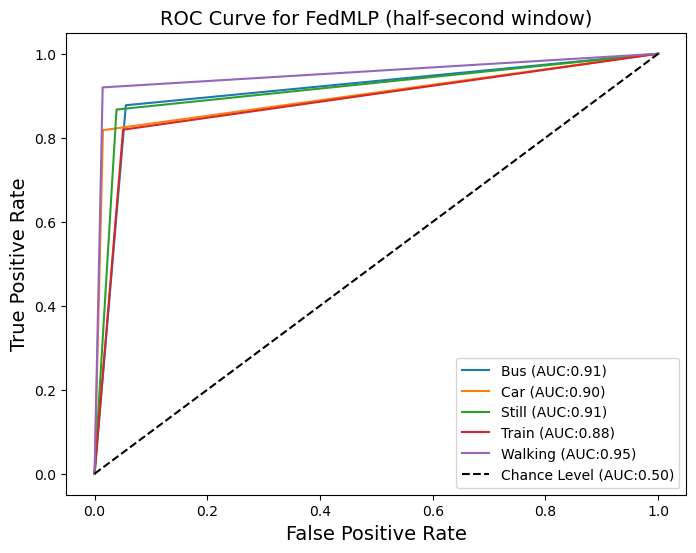

313/313 [==============================] - 1s 4ms/step - loss: 0.5040 - sparse_categorical_accuracy: 0.8205
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 28 | global_acc: 85.628% | global_loss: 1.1009701490402222
              precision    recall  f1-score   support

           0       0.78      0.88      0.82      2487
           1       0.92      0.81      0.86      2516
           2       0.83      0.89      0.86      2498
           3       0.86      0.76      0.81      2471
           4       0.92      0.93      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.86      0.86      0.86     12517
weighted avg       0.86      0.86      0.86     12517

0.9099776535204402


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


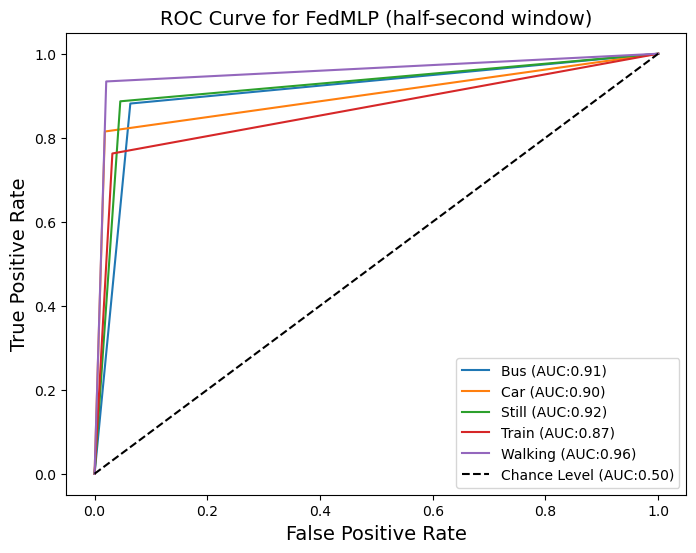

313/313 [==============================] - 1s 4ms/step - loss: 0.5118 - sparse_categorical_accuracy: 0.8123
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 29 | global_acc: 85.524% | global_loss: 1.1004937887191772
              precision    recall  f1-score   support

           0       0.76      0.89      0.82      2487
           1       0.93      0.81      0.87      2516
           2       0.87      0.85      0.86      2498
           3       0.82      0.78      0.80      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.86      0.85      0.86     12517
weighted avg       0.86      0.86      0.86     12517

0.9093565836252621


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


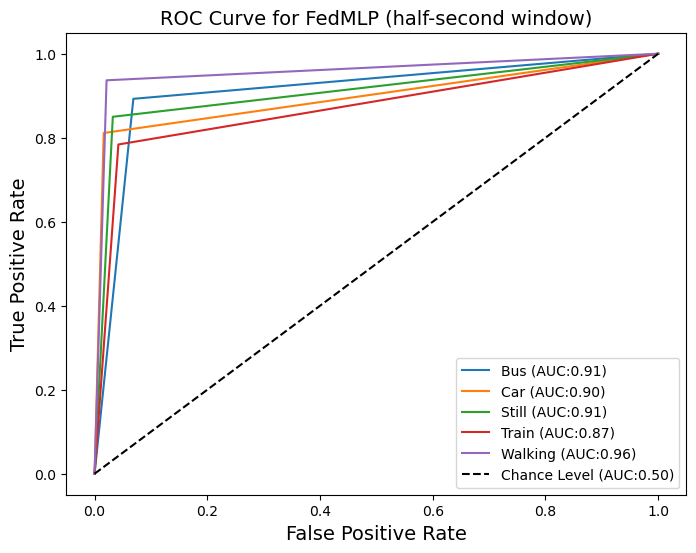

313/313 [==============================] - 1s 4ms/step - loss: 0.4992 - sparse_categorical_accuracy: 0.8211
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 30 | global_acc: 85.979% | global_loss: 1.0972834825515747
              precision    recall  f1-score   support

           0       0.79      0.87      0.83      2487
           1       0.92      0.83      0.87      2516
           2       0.84      0.89      0.86      2498
           3       0.84      0.77      0.80      2471
           4       0.91      0.94      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.86      0.86      0.86     12517
weighted avg       0.86      0.86      0.86     12517

0.9121661961624093


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


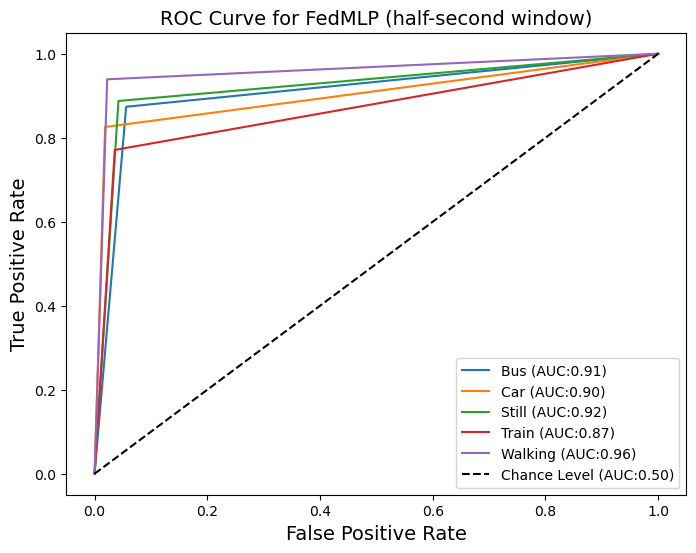

313/313 [==============================] - 1s 4ms/step - loss: 0.4993 - sparse_categorical_accuracy: 0.8207
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 31 | global_acc: 85.907% | global_loss: 1.0977129936218262
              precision    recall  f1-score   support

           0       0.77      0.89      0.83      2487
           1       0.92      0.83      0.87      2516
           2       0.85      0.87      0.86      2498
           3       0.84      0.77      0.81      2471
           4       0.92      0.93      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.86      0.86      0.86     12517
weighted avg       0.86      0.86      0.86     12517

0.9117353505281235


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


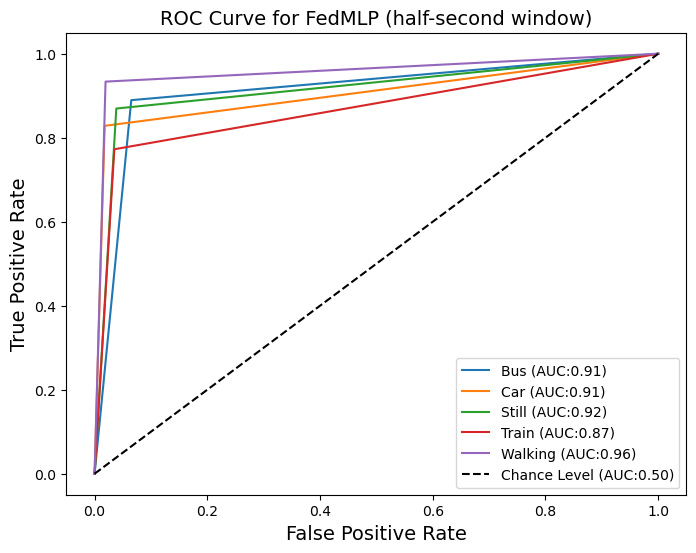

313/313 [==============================] - 1s 4ms/step - loss: 0.4965 - sparse_categorical_accuracy: 0.8233
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 32 | global_acc: 85.955% | global_loss: 1.0958417654037476
              precision    recall  f1-score   support

           0       0.79      0.88      0.83      2487
           1       0.91      0.83      0.87      2516
           2       0.85      0.87      0.86      2498
           3       0.83      0.79      0.81      2471
           4       0.92      0.93      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.86      0.86      0.86     12517
weighted avg       0.86      0.86      0.86     12517

0.9120422297748603


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


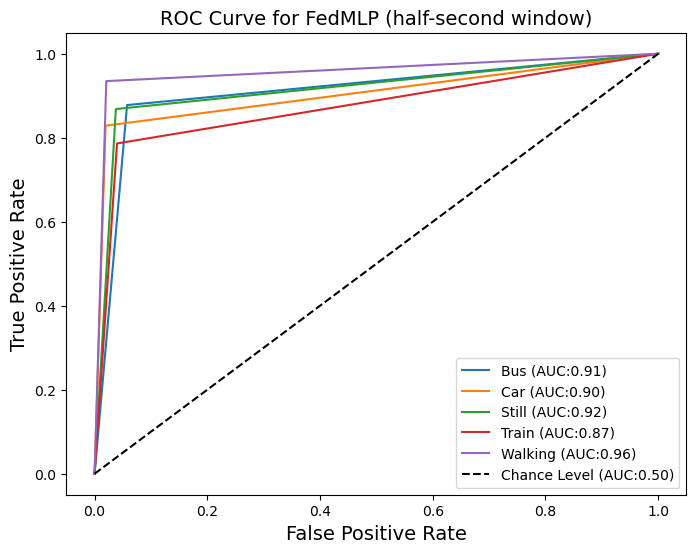

313/313 [==============================] - 1s 4ms/step - loss: 0.4725 - sparse_categorical_accuracy: 0.8292
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 33 | global_acc: 86.379% | global_loss: 1.094085931777954
              precision    recall  f1-score   support

           0       0.81      0.88      0.84      2487
           1       0.93      0.82      0.87      2516
           2       0.85      0.88      0.86      2498
           3       0.81      0.81      0.81      2471
           4       0.93      0.93      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.87      0.86      0.86     12517
weighted avg       0.87      0.86      0.86     12517

0.9147342491186995


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


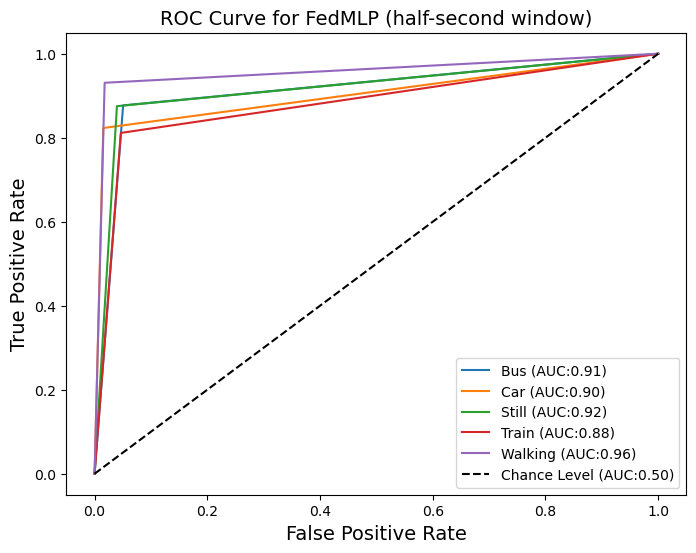

313/313 [==============================] - 1s 4ms/step - loss: 0.4954 - sparse_categorical_accuracy: 0.8195
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 34 | global_acc: 86.003% | global_loss: 1.095202922821045
              precision    recall  f1-score   support

           0       0.77      0.90      0.83      2487
           1       0.92      0.83      0.87      2516
           2       0.86      0.85      0.86      2498
           3       0.84      0.77      0.81      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.86      0.86      0.86     12517
weighted avg       0.86      0.86      0.86     12517

0.9123306042992535


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


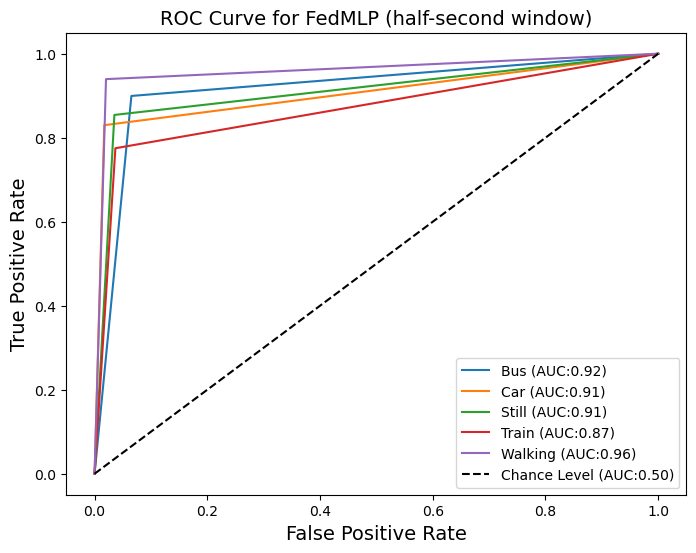

313/313 [==============================] - 1s 4ms/step - loss: 0.4766 - sparse_categorical_accuracy: 0.8268
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 35 | global_acc: 86.506% | global_loss: 1.0944329500198364
              precision    recall  f1-score   support

           0       0.80      0.89      0.84      2487
           1       0.94      0.82      0.88      2516
           2       0.84      0.89      0.86      2498
           3       0.84      0.79      0.82      2471
           4       0.93      0.93      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.86      0.86     12517
weighted avg       0.87      0.87      0.87     12517

0.9155219148376557


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


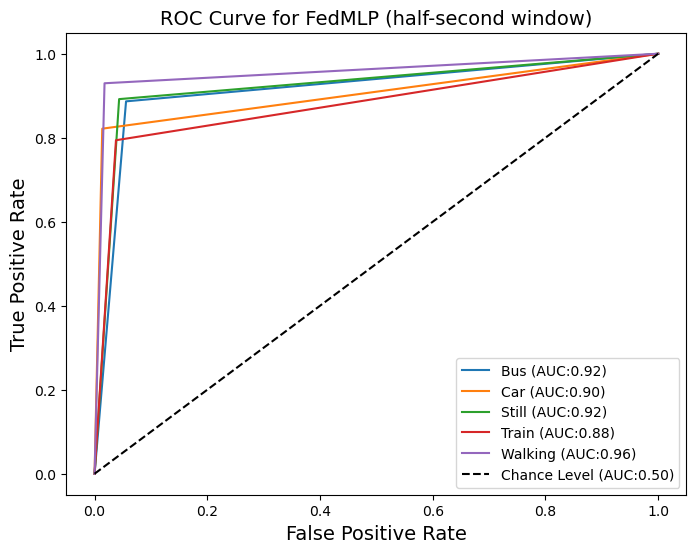

313/313 [==============================] - 1s 4ms/step - loss: 0.4818 - sparse_categorical_accuracy: 0.8227
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 36 | global_acc: 86.379% | global_loss: 1.0925788879394531
              precision    recall  f1-score   support

           0       0.79      0.89      0.84      2487
           1       0.92      0.84      0.88      2516
           2       0.86      0.86      0.86      2498
           3       0.83      0.79      0.81      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.87      0.86      0.86     12517
weighted avg       0.87      0.86      0.86     12517

0.9146965224943369


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


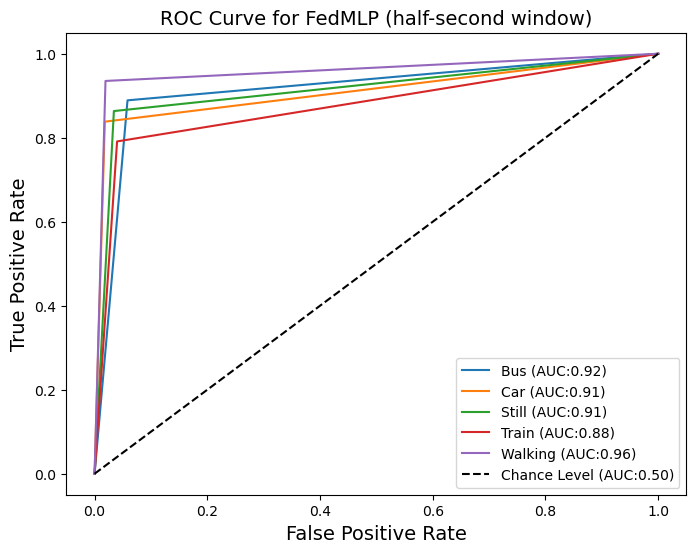

313/313 [==============================] - 1s 4ms/step - loss: 0.4505 - sparse_categorical_accuracy: 0.8375
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 37 | global_acc: 86.450% | global_loss: 1.090842366218567
              precision    recall  f1-score   support

           0       0.80      0.88      0.84      2487
           1       0.93      0.83      0.88      2516
           2       0.85      0.88      0.86      2498
           3       0.82      0.80      0.81      2471
           4       0.93      0.93      0.93      2545

    accuracy                           0.86     12517
   macro avg       0.87      0.86      0.86     12517
weighted avg       0.87      0.86      0.86     12517

0.9151815031910335


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


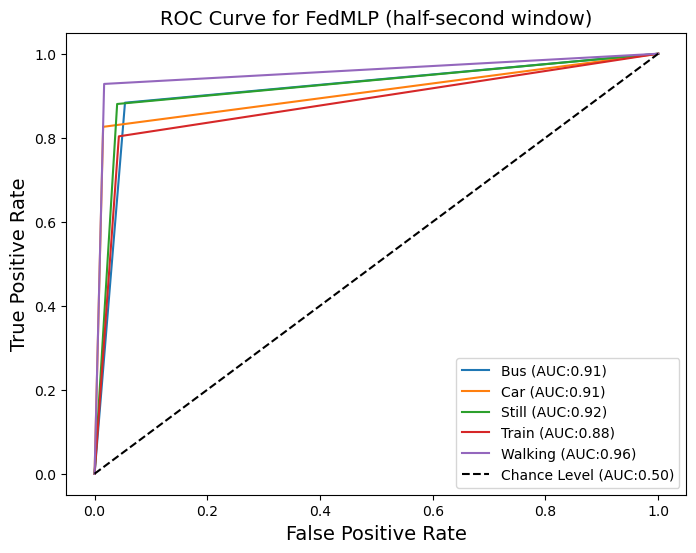

313/313 [==============================] - 1s 4ms/step - loss: 0.4806 - sparse_categorical_accuracy: 0.8248
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 38 | global_acc: 86.562% | global_loss: 1.090598464012146
              precision    recall  f1-score   support

           0       0.80      0.89      0.84      2487
           1       0.93      0.83      0.88      2516
           2       0.86      0.87      0.86      2498
           3       0.83      0.81      0.82      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9158692245324949


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


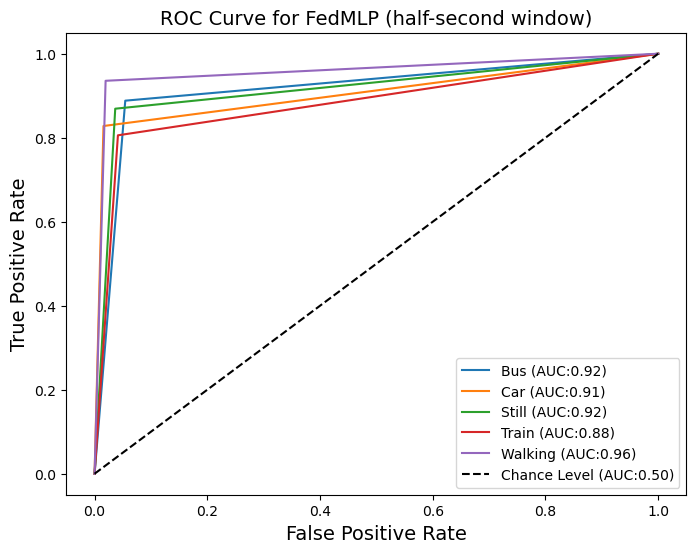

313/313 [==============================] - 1s 4ms/step - loss: 0.4561 - sparse_categorical_accuracy: 0.8360
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 39 | global_acc: 86.642% | global_loss: 1.0871325731277466
              precision    recall  f1-score   support

           0       0.82      0.87      0.84      2487
           1       0.93      0.83      0.88      2516
           2       0.86      0.87      0.86      2498
           3       0.82      0.81      0.82      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9163625863700988


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


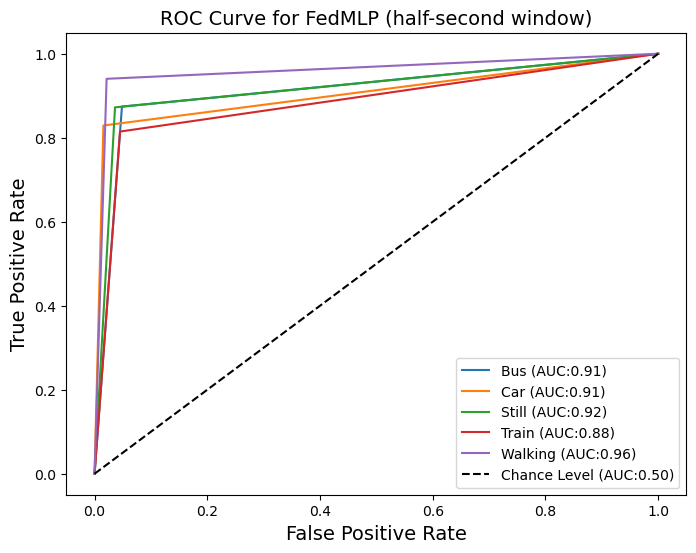

313/313 [==============================] - 2s 4ms/step - loss: 0.4746 - sparse_categorical_accuracy: 0.8310
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 40 | global_acc: 86.970% | global_loss: 1.0874228477478027
              precision    recall  f1-score   support

           0       0.83      0.87      0.85      2487
           1       0.92      0.84      0.88      2516
           2       0.84      0.90      0.87      2498
           3       0.83      0.81      0.82      2471
           4       0.93      0.93      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9184112141051921


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


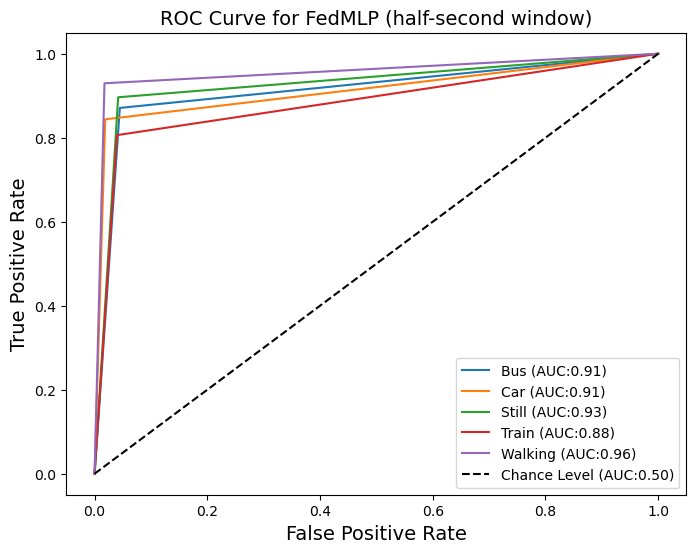

313/313 [==============================] - 1s 4ms/step - loss: 0.4592 - sparse_categorical_accuracy: 0.8357
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 41 | global_acc: 86.706% | global_loss: 1.0861016511917114
              precision    recall  f1-score   support

           0       0.80      0.89      0.84      2487
           1       0.93      0.84      0.88      2516
           2       0.86      0.88      0.87      2498
           3       0.84      0.79      0.81      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9167321961734979


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


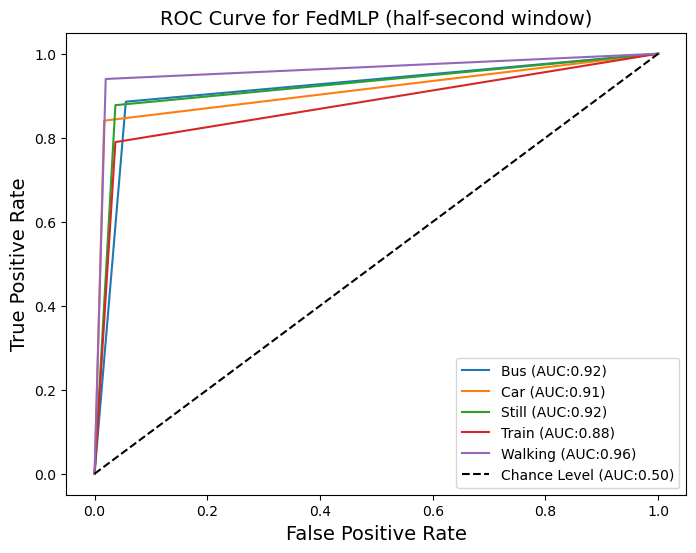

313/313 [==============================] - 2s 4ms/step - loss: 0.4688 - sparse_categorical_accuracy: 0.8311
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 42 | global_acc: 86.594% | global_loss: 1.0853735208511353
              precision    recall  f1-score   support

           0       0.79      0.89      0.84      2487
           1       0.92      0.83      0.88      2516
           2       0.86      0.88      0.87      2498
           3       0.84      0.79      0.81      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9160406824153455


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


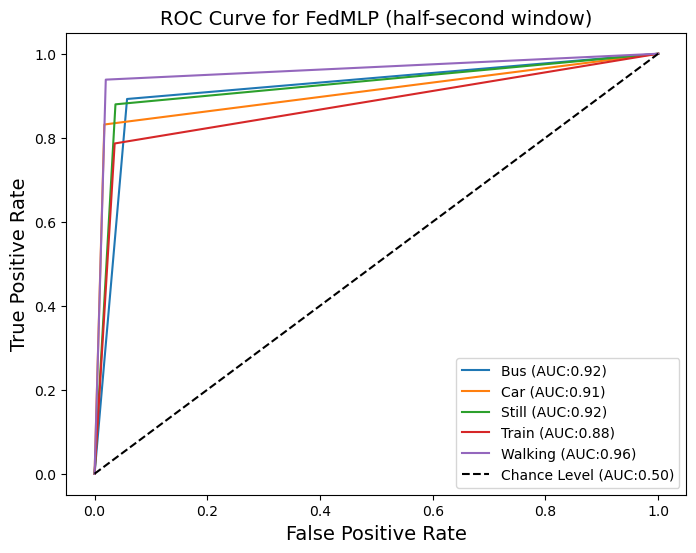

313/313 [==============================] - 1s 4ms/step - loss: 0.4398 - sparse_categorical_accuracy: 0.8401
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 43 | global_acc: 86.746% | global_loss: 1.0843031406402588
              precision    recall  f1-score   support

           0       0.81      0.88      0.85      2487
           1       0.93      0.83      0.88      2516
           2       0.85      0.88      0.87      2498
           3       0.82      0.80      0.81      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9170126604941441


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


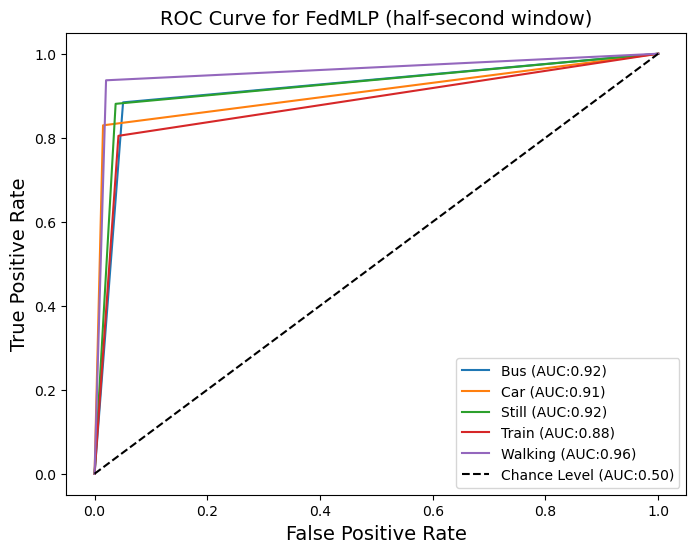

313/313 [==============================] - 2s 4ms/step - loss: 0.4466 - sparse_categorical_accuracy: 0.8382
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 44 | global_acc: 86.954% | global_loss: 1.0843325853347778
              precision    recall  f1-score   support

           0       0.81      0.89      0.84      2487
           1       0.92      0.85      0.88      2516
           2       0.86      0.89      0.87      2498
           3       0.84      0.79      0.82      2471
           4       0.93      0.93      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9182944859775632


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


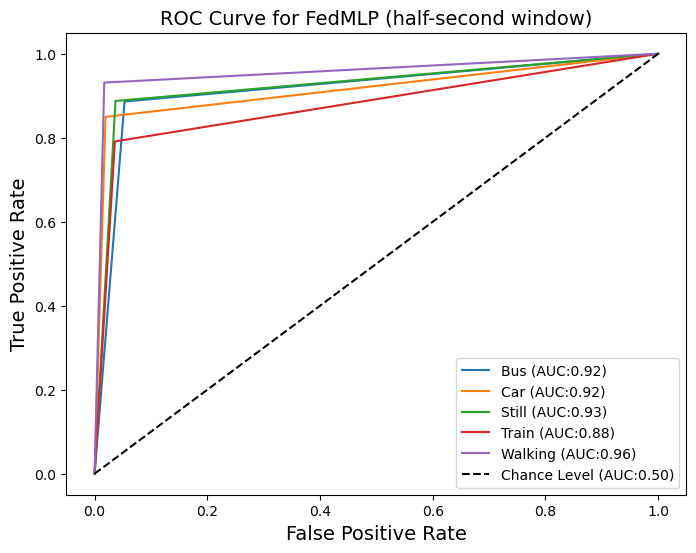

313/313 [==============================] - 2s 4ms/step - loss: 0.4445 - sparse_categorical_accuracy: 0.8380
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 45 | global_acc: 86.722% | global_loss: 1.0850987434387207
              precision    recall  f1-score   support

           0       0.79      0.90      0.84      2487
           1       0.92      0.84      0.88      2516
           2       0.86      0.87      0.87      2498
           3       0.85      0.79      0.82      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9168288935425271


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


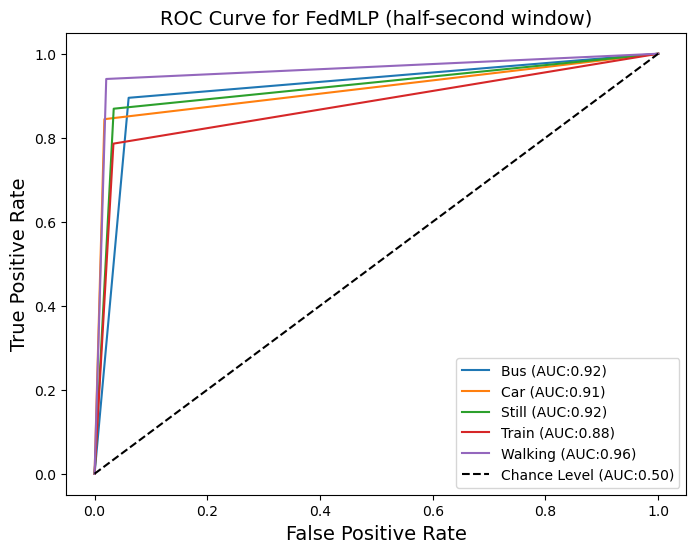

313/313 [==============================] - 1s 4ms/step - loss: 0.4580 - sparse_categorical_accuracy: 0.8329
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 46 | global_acc: 87.042% | global_loss: 1.0841741561889648
              precision    recall  f1-score   support

           0       0.81      0.89      0.85      2487
           1       0.92      0.85      0.89      2516
           2       0.87      0.87      0.87      2498
           3       0.83      0.80      0.82      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9188446520938613


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


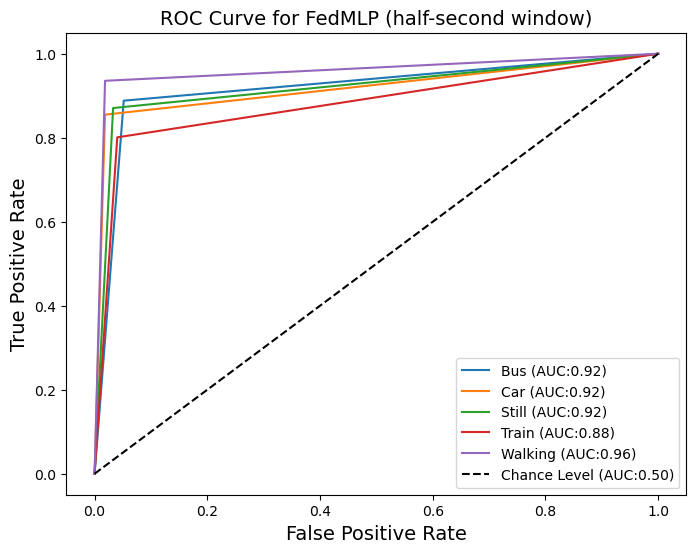

313/313 [==============================] - 2s 4ms/step - loss: 0.4525 - sparse_categorical_accuracy: 0.8377
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 47 | global_acc: 86.930% | global_loss: 1.0840463638305664
              precision    recall  f1-score   support

           0       0.79      0.90      0.84      2487
           1       0.93      0.83      0.88      2516
           2       0.87      0.87      0.87      2498
           3       0.83      0.81      0.82      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9181772967697139


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


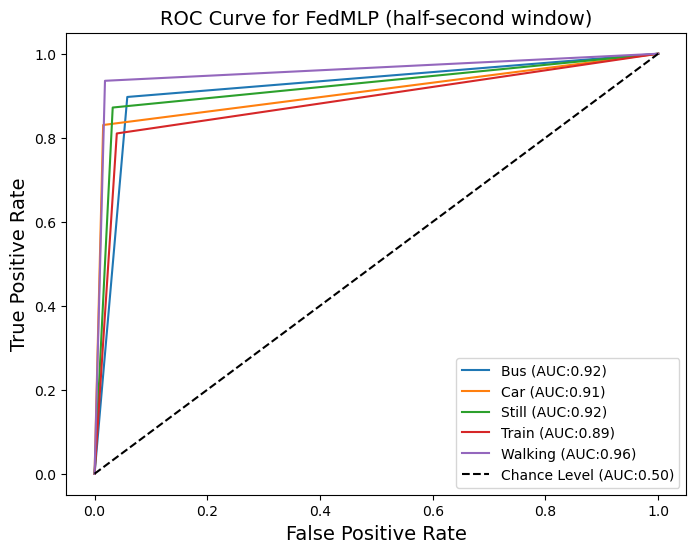

313/313 [==============================] - 1s 4ms/step - loss: 0.4567 - sparse_categorical_accuracy: 0.8368
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 48 | global_acc: 87.122% | global_loss: 1.0841197967529297
              precision    recall  f1-score   support

           0       0.81      0.90      0.85      2487
           1       0.92      0.85      0.89      2516
           2       0.87      0.88      0.87      2498
           3       0.85      0.79      0.81      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9193254071053033


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


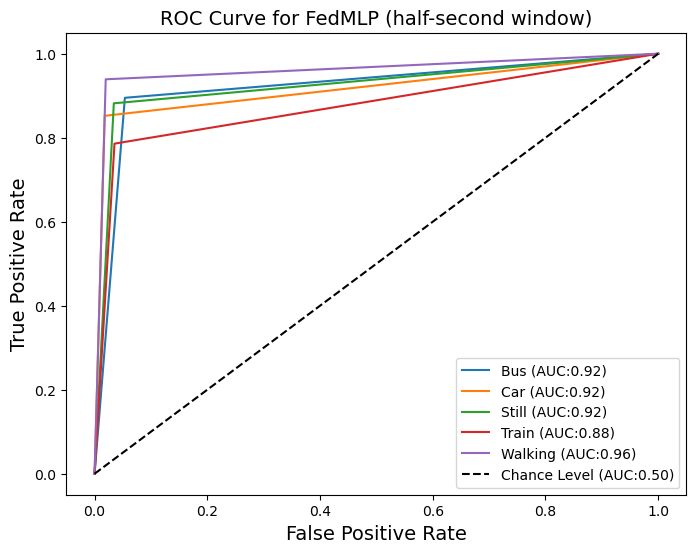

313/313 [==============================] - 1s 4ms/step - loss: 0.4348 - sparse_categorical_accuracy: 0.8417
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 49 | global_acc: 87.321% | global_loss: 1.081225872039795
              precision    recall  f1-score   support

           0       0.82      0.89      0.85      2487
           1       0.93      0.85      0.89      2516
           2       0.88      0.87      0.88      2498
           3       0.82      0.82      0.82      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9206100165098906


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


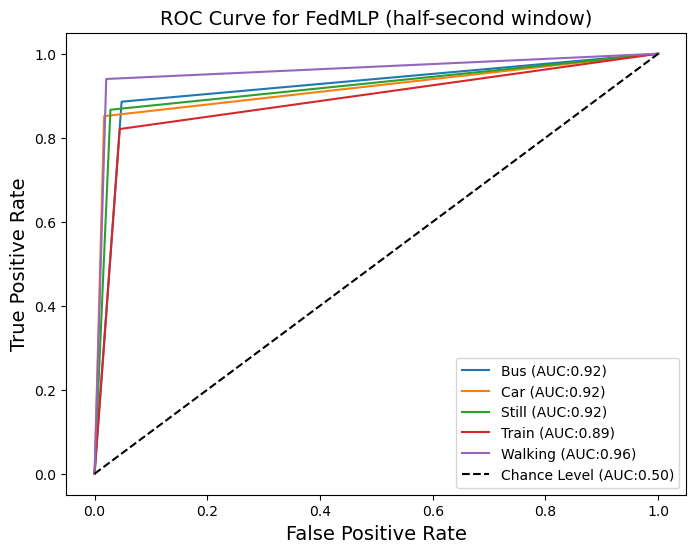

313/313 [==============================] - 1s 4ms/step - loss: 0.4540 - sparse_categorical_accuracy: 0.8388
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 50 | global_acc: 87.529% | global_loss: 1.080552577972412
              precision    recall  f1-score   support

           0       0.82      0.89      0.85      2487
           1       0.92      0.86      0.89      2516
           2       0.86      0.89      0.88      2498
           3       0.85      0.79      0.82      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.87      0.87     12517
weighted avg       0.88      0.88      0.88     12517

0.9218741720372385


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


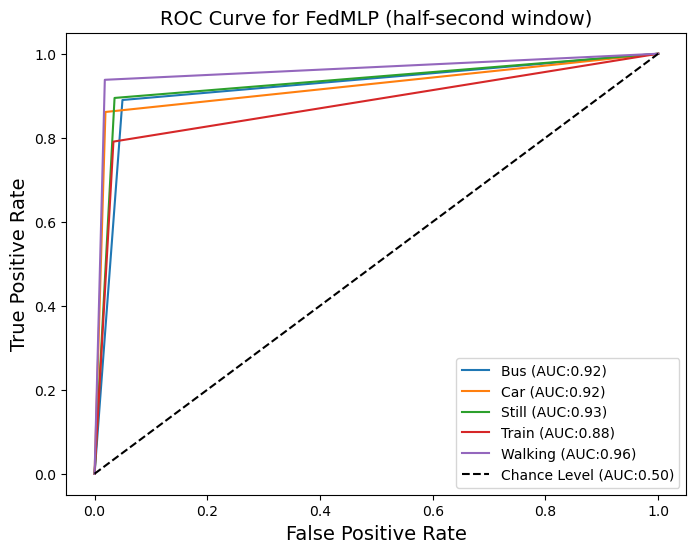

313/313 [==============================] - 1s 4ms/step - loss: 0.4485 - sparse_categorical_accuracy: 0.8372
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 51 | global_acc: 87.489% | global_loss: 1.0772340297698975
              precision    recall  f1-score   support

           0       0.84      0.88      0.86      2487
           1       0.92      0.85      0.89      2516
           2       0.87      0.88      0.87      2498
           3       0.82      0.83      0.82      2471
           4       0.93      0.93      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.88      0.87      0.87     12517
weighted avg       0.88      0.87      0.88     12517

0.9216750201309308


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


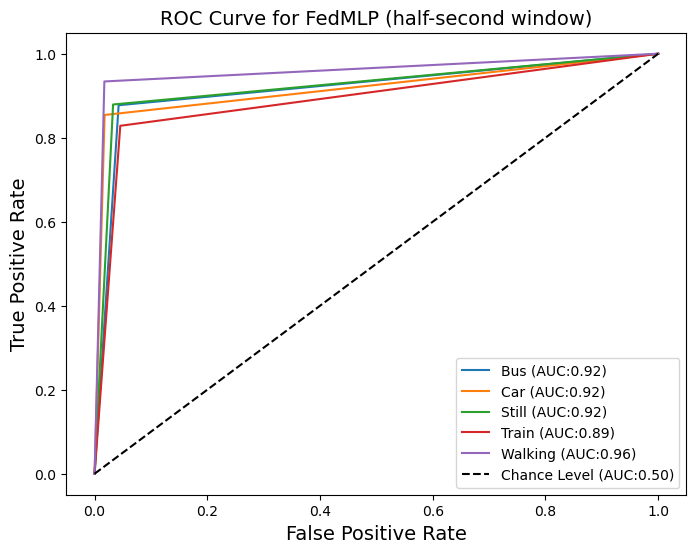

313/313 [==============================] - 1s 4ms/step - loss: 0.4341 - sparse_categorical_accuracy: 0.8432
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 52 | global_acc: 87.337% | global_loss: 1.0778955221176147
              precision    recall  f1-score   support

           0       0.82      0.88      0.85      2487
           1       0.93      0.85      0.89      2516
           2       0.87      0.88      0.87      2498
           3       0.83      0.82      0.82      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.87      0.87      0.87     12517
weighted avg       0.87      0.87      0.87     12517

0.9207111076390007


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


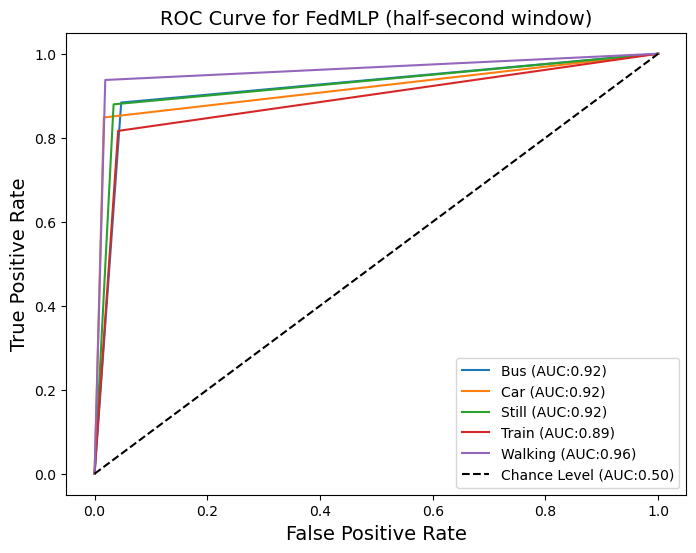

313/313 [==============================] - 1s 4ms/step - loss: 0.4503 - sparse_categorical_accuracy: 0.8386
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 53 | global_acc: 87.545% | global_loss: 1.0775948762893677
              precision    recall  f1-score   support

           0       0.83      0.88      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.87      0.88      0.87      2498
           3       0.83      0.81      0.82      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9219981737716383


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


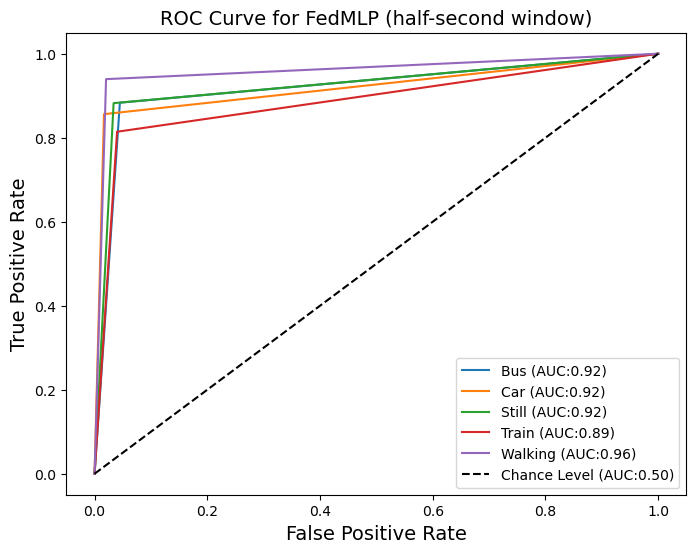

313/313 [==============================] - 1s 4ms/step - loss: 0.4454 - sparse_categorical_accuracy: 0.8453
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 54 | global_acc: 87.481% | global_loss: 1.0779287815093994
              precision    recall  f1-score   support

           0       0.81      0.89      0.85      2487
           1       0.94      0.84      0.88      2516
           2       0.86      0.89      0.88      2498
           3       0.84      0.81      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.87     12517
   macro avg       0.88      0.87      0.87     12517
weighted avg       0.88      0.87      0.87     12517

0.9216246331373114


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


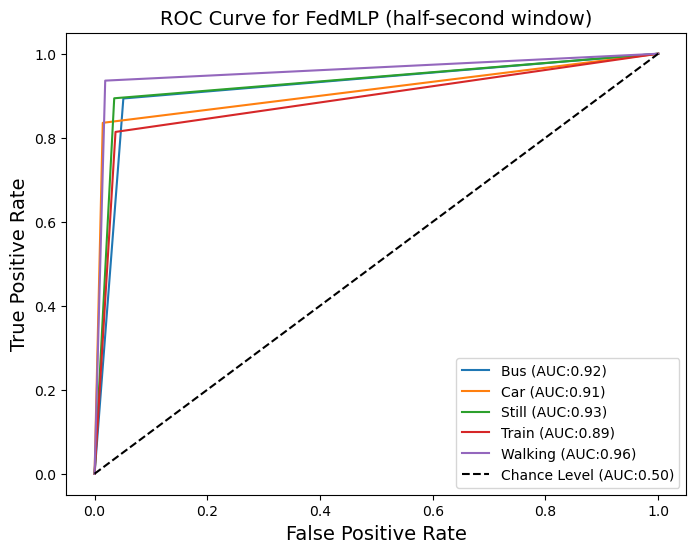

313/313 [==============================] - 1s 4ms/step - loss: 0.4396 - sparse_categorical_accuracy: 0.8427
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 55 | global_acc: 87.665% | global_loss: 1.0763304233551025
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      2487
           1       0.93      0.85      0.89      2516
           2       0.87      0.89      0.88      2498
           3       0.84      0.82      0.83      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.922753095063376


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


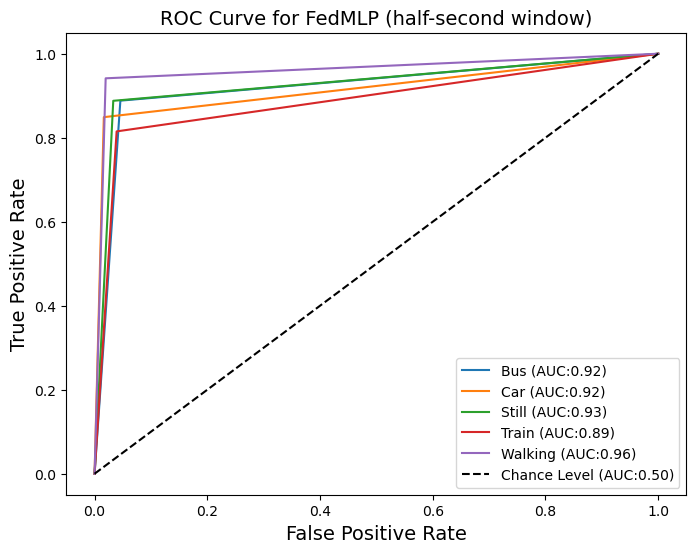

313/313 [==============================] - 1s 4ms/step - loss: 0.4465 - sparse_categorical_accuracy: 0.8365
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 56 | global_acc: 87.649% | global_loss: 1.076785922050476
              precision    recall  f1-score   support

           0       0.83      0.88      0.86      2487
           1       0.93      0.85      0.89      2516
           2       0.89      0.87      0.88      2498
           3       0.82      0.84      0.83      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9226693674426929


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


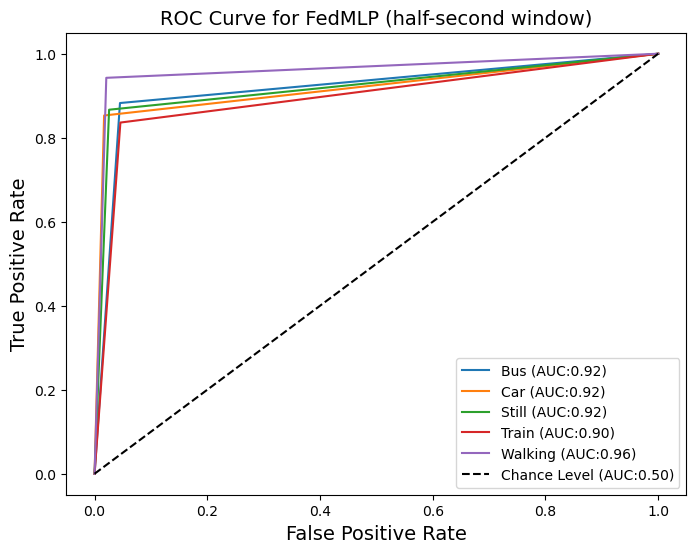

313/313 [==============================] - 1s 4ms/step - loss: 0.4439 - sparse_categorical_accuracy: 0.8367
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 57 | global_acc: 87.569% | global_loss: 1.0758137702941895
              precision    recall  f1-score   support

           0       0.82      0.89      0.85      2487
           1       0.93      0.86      0.89      2516
           2       0.87      0.89      0.88      2498
           3       0.84      0.80      0.82      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.922132998191335


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


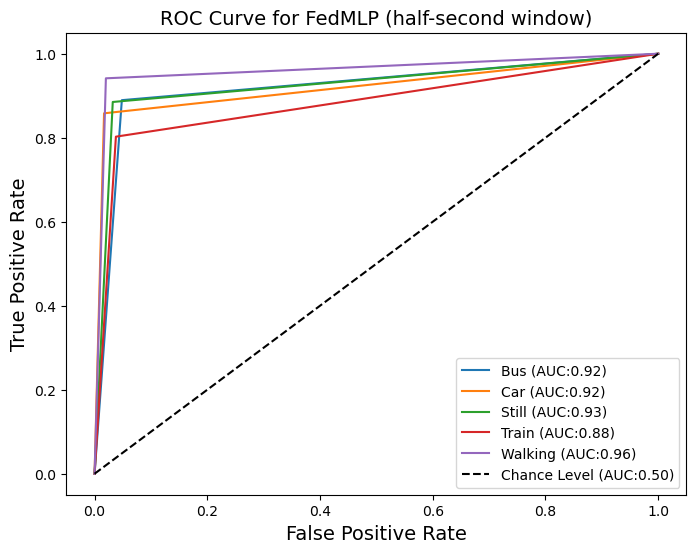

313/313 [==============================] - 1s 4ms/step - loss: 0.4382 - sparse_categorical_accuracy: 0.8423
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 58 | global_acc: 87.817% | global_loss: 1.0739355087280273
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      2487
           1       0.93      0.85      0.89      2516
           2       0.85      0.90      0.88      2498
           3       0.84      0.82      0.83      2471
           4       0.94      0.93      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9237173599019487


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


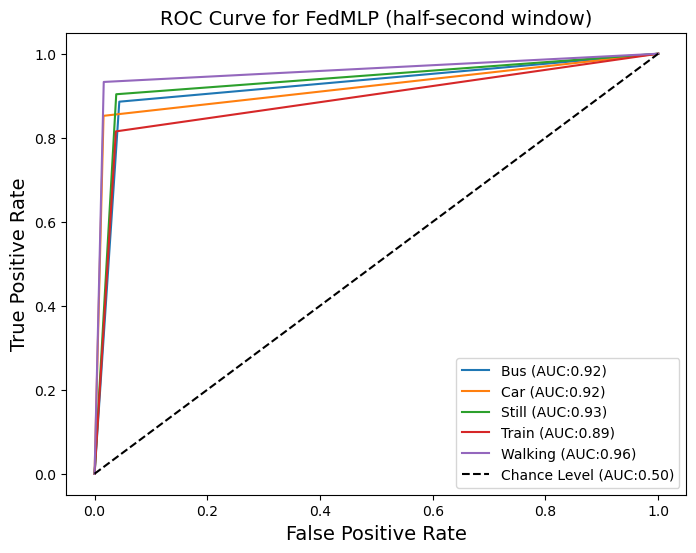

313/313 [==============================] - 1s 4ms/step - loss: 0.4102 - sparse_categorical_accuracy: 0.8504
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 59 | global_acc: 87.737% | global_loss: 1.0734418630599976
              precision    recall  f1-score   support

           0       0.83      0.88      0.86      2487
           1       0.93      0.85      0.89      2516
           2       0.86      0.90      0.88      2498
           3       0.84      0.82      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9232114695038047


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


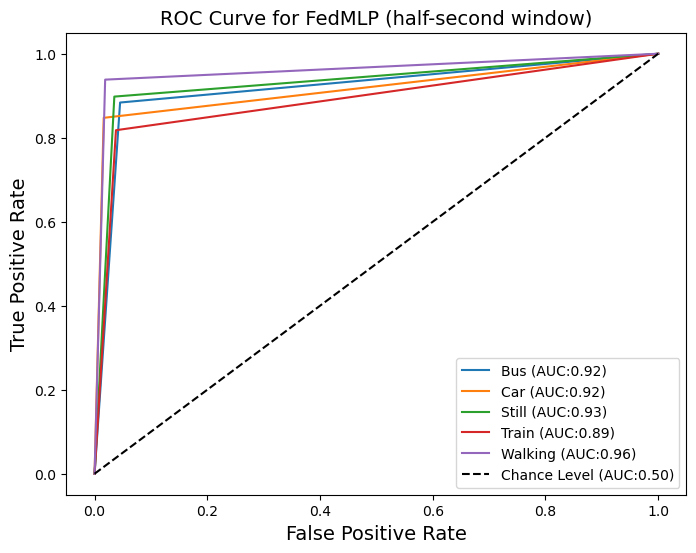

313/313 [==============================] - 1s 4ms/step - loss: 0.4119 - sparse_categorical_accuracy: 0.8515
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 60 | global_acc: 87.825% | global_loss: 1.0749446153640747
              precision    recall  f1-score   support

           0       0.84      0.87      0.86      2487
           1       0.93      0.85      0.89      2516
           2       0.85      0.91      0.88      2498
           3       0.85      0.82      0.83      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9237442632913144


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


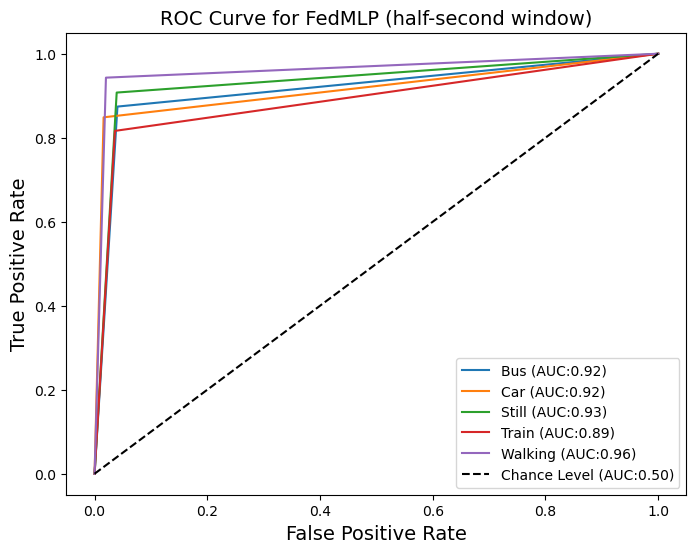

313/313 [==============================] - 1s 4ms/step - loss: 0.4378 - sparse_categorical_accuracy: 0.8407
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 61 | global_acc: 87.609% | global_loss: 1.0745970010757446
              precision    recall  f1-score   support

           0       0.80      0.90      0.85      2487
           1       0.92      0.86      0.89      2516
           2       0.87      0.88      0.88      2498
           3       0.85      0.80      0.82      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.922396984444128


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


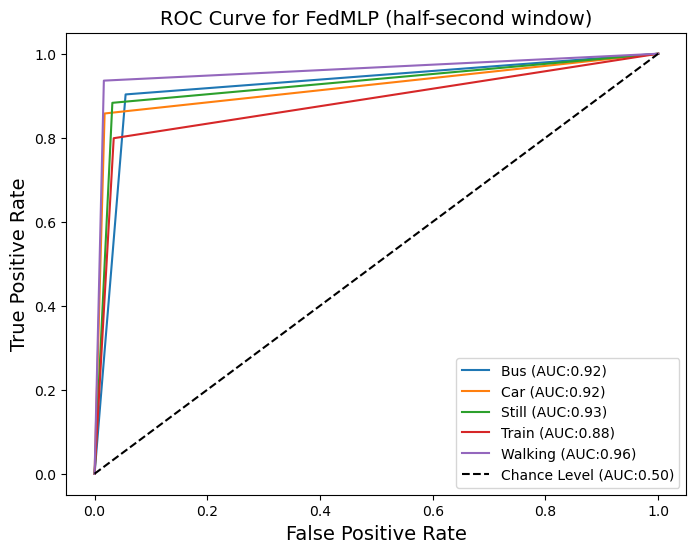

313/313 [==============================] - 1s 4ms/step - loss: 0.4359 - sparse_categorical_accuracy: 0.8465
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 62 | global_acc: 87.801% | global_loss: 1.0732011795043945
              precision    recall  f1-score   support

           0       0.82      0.89      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.87      0.89      0.88      2498
           3       0.84      0.81      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9236065958609064


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


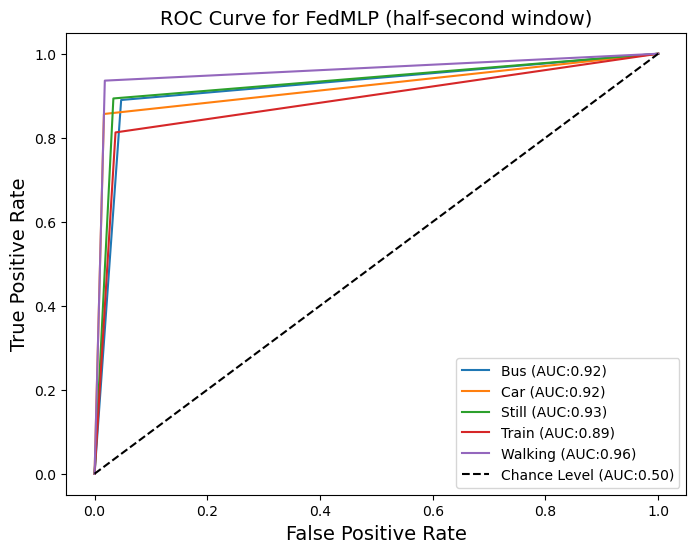

313/313 [==============================] - 1s 4ms/step - loss: 0.4302 - sparse_categorical_accuracy: 0.8492
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 63 | global_acc: 88.200% | global_loss: 1.0718566179275513
              precision    recall  f1-score   support

           0       0.84      0.89      0.86      2487
           1       0.93      0.85      0.89      2516
           2       0.88      0.89      0.89      2498
           3       0.83      0.84      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9261330428701597


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


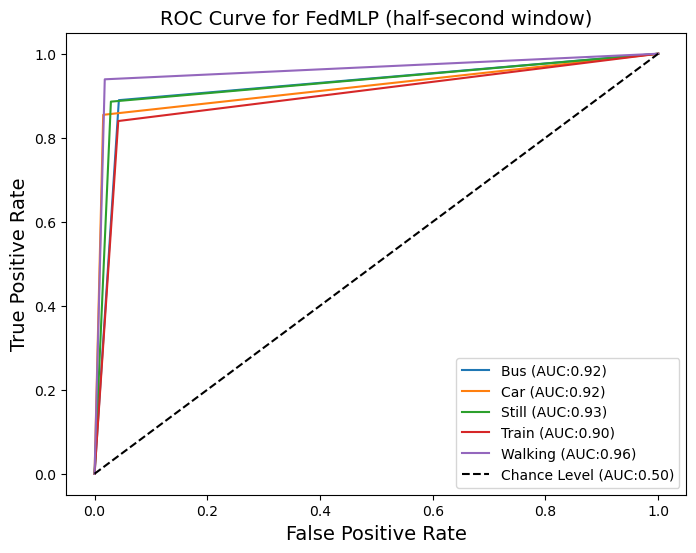

313/313 [==============================] - 1s 4ms/step - loss: 0.4302 - sparse_categorical_accuracy: 0.8433
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 64 | global_acc: 88.104% | global_loss: 1.0715548992156982
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.88      0.89      0.88      2498
           3       0.85      0.82      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9255013277538732


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


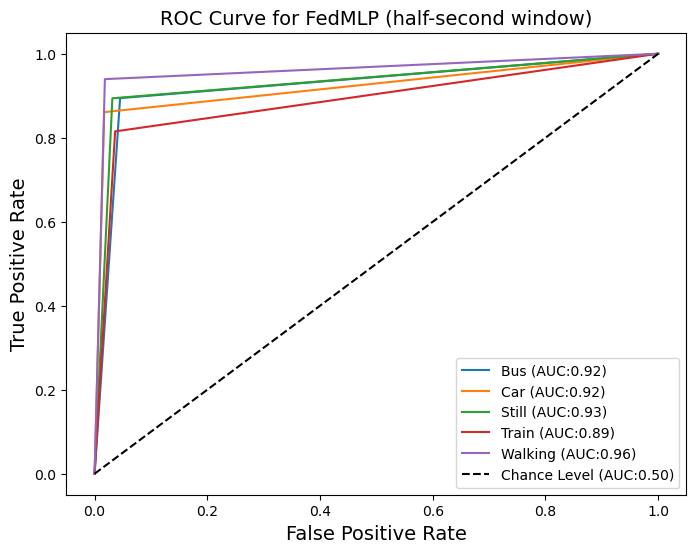

313/313 [==============================] - 1s 4ms/step - loss: 0.4325 - sparse_categorical_accuracy: 0.8467
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 65 | global_acc: 88.064% | global_loss: 1.0714846849441528
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.88      0.89      0.88      2498
           3       0.84      0.82      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9252631751929854


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


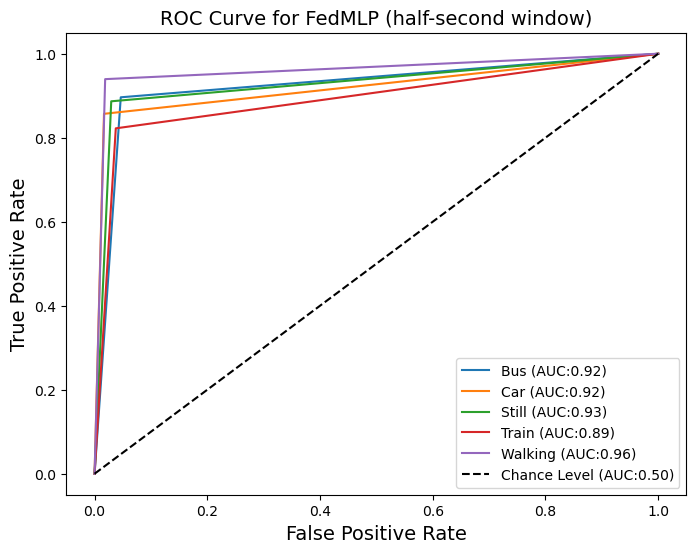

313/313 [==============================] - 1s 4ms/step - loss: 0.4039 - sparse_categorical_accuracy: 0.8541
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 66 | global_acc: 88.080% | global_loss: 1.0713800191879272
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.89      0.88      2498
           3       0.85      0.81      0.83      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9253348527931031


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


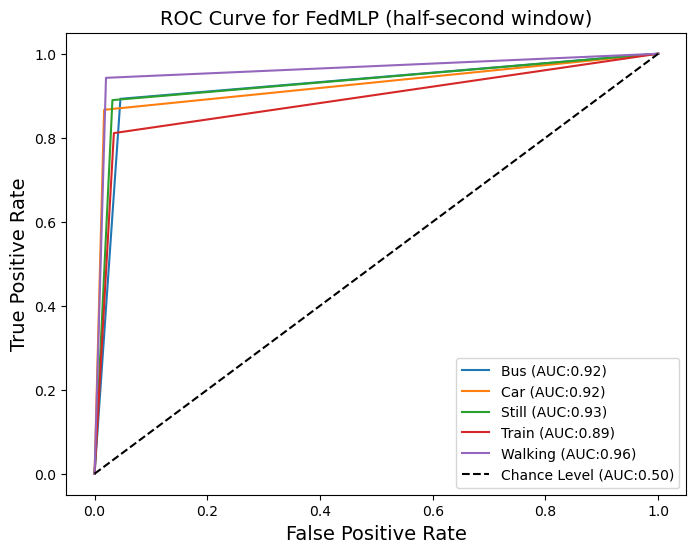

313/313 [==============================] - 1s 4ms/step - loss: 0.4129 - sparse_categorical_accuracy: 0.8497
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 67 | global_acc: 88.168% | global_loss: 1.0702000856399536
              precision    recall  f1-score   support

           0       0.84      0.89      0.86      2487
           1       0.93      0.85      0.89      2516
           2       0.86      0.91      0.88      2498
           3       0.85      0.83      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9259290188082637


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


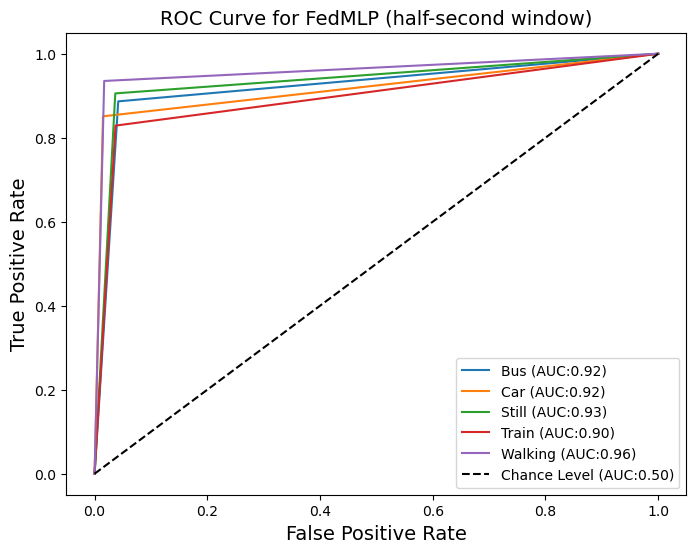

313/313 [==============================] - 1s 4ms/step - loss: 0.4039 - sparse_categorical_accuracy: 0.8540
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 68 | global_acc: 88.080% | global_loss: 1.0706902742385864
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      2487
           1       0.93      0.85      0.89      2516
           2       0.87      0.90      0.89      2498
           3       0.84      0.83      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9253713724190449


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


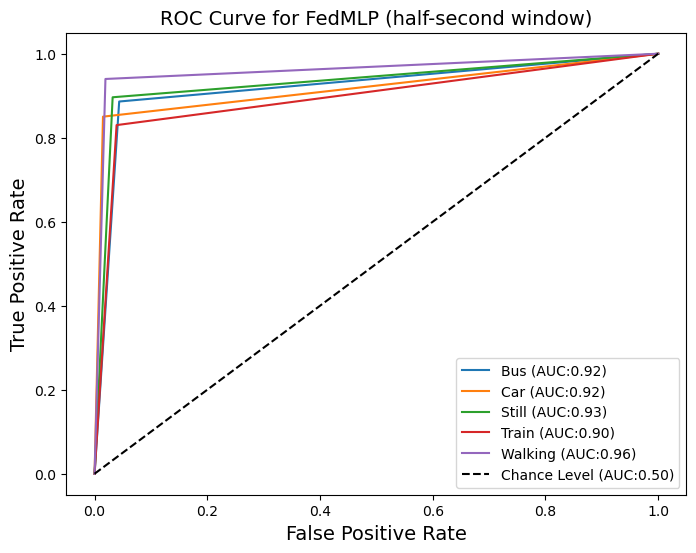

313/313 [==============================] - 1s 4ms/step - loss: 0.4008 - sparse_categorical_accuracy: 0.8549
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 69 | global_acc: 88.048% | global_loss: 1.0689582824707031
              precision    recall  f1-score   support

           0       0.84      0.88      0.86      2487
           1       0.93      0.86      0.90      2516
           2       0.87      0.90      0.88      2498
           3       0.84      0.81      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9251433241206015


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


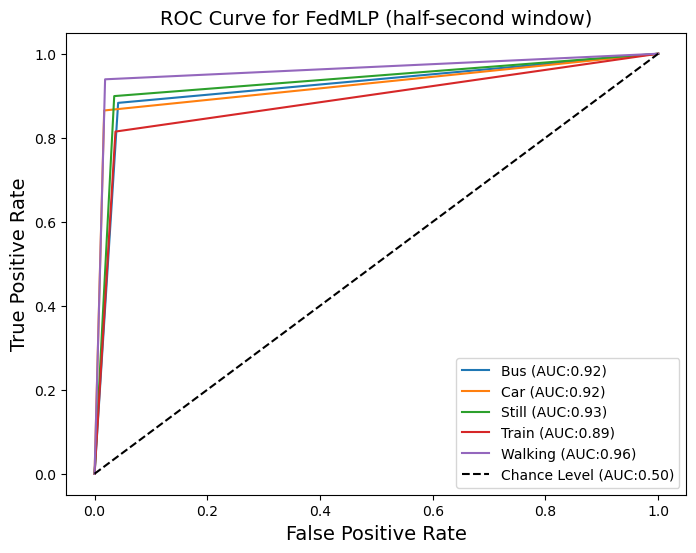

313/313 [==============================] - 1s 4ms/step - loss: 0.4102 - sparse_categorical_accuracy: 0.8557
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 70 | global_acc: 88.136% | global_loss: 1.0689969062805176
              precision    recall  f1-score   support

           0       0.82      0.90      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.88      0.89      0.89      2498
           3       0.85      0.82      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9257173541699876


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


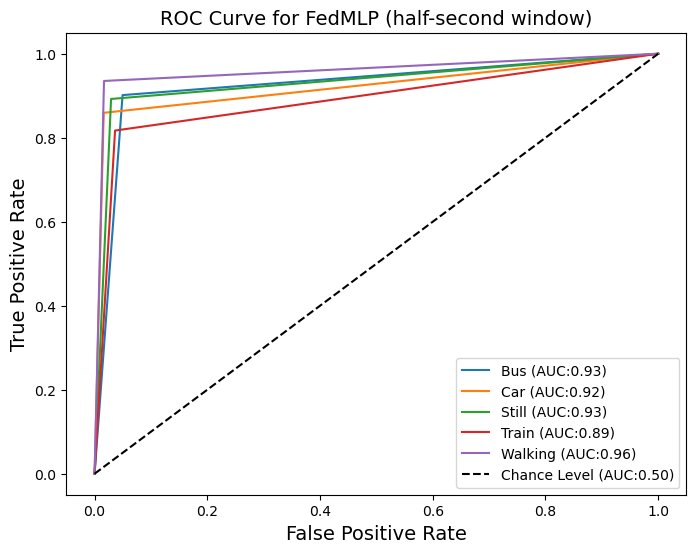

313/313 [==============================] - 1s 4ms/step - loss: 0.4230 - sparse_categorical_accuracy: 0.8493
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 71 | global_acc: 88.144% | global_loss: 1.0684103965759277
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.88      0.89      0.88      2498
           3       0.84      0.83      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9257732764903214


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


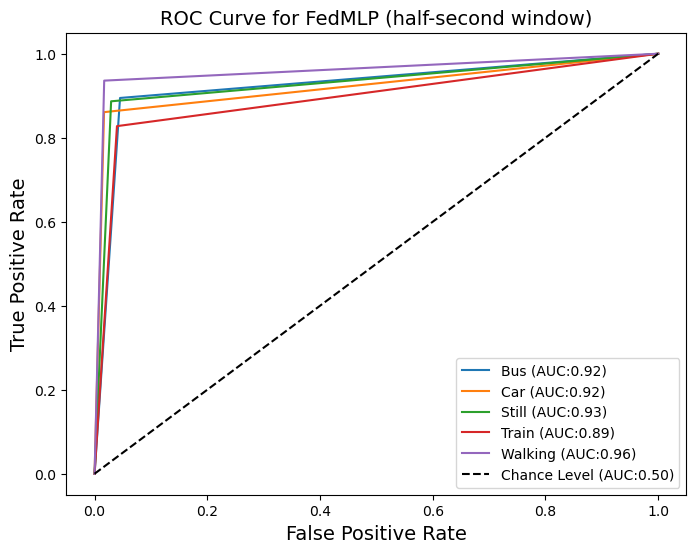

313/313 [==============================] - 2s 4ms/step - loss: 0.4170 - sparse_categorical_accuracy: 0.8513
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 72 | global_acc: 88.312% | global_loss: 1.0672359466552734
              precision    recall  f1-score   support

           0       0.84      0.89      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.88      0.89      0.89      2498
           3       0.84      0.83      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9268128924034815


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


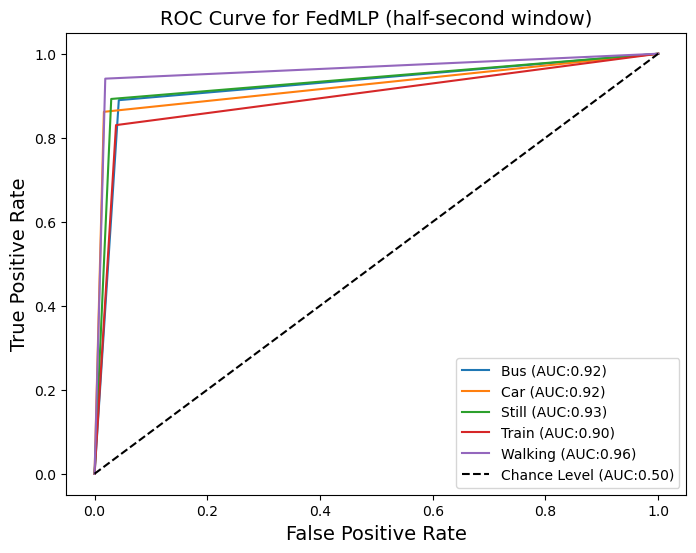

313/313 [==============================] - 1s 4ms/step - loss: 0.4218 - sparse_categorical_accuracy: 0.8526
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 73 | global_acc: 88.224% | global_loss: 1.0674951076507568
              precision    recall  f1-score   support

           0       0.83      0.89      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.88      0.90      0.89      2498
           3       0.85      0.82      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9262593148393728


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


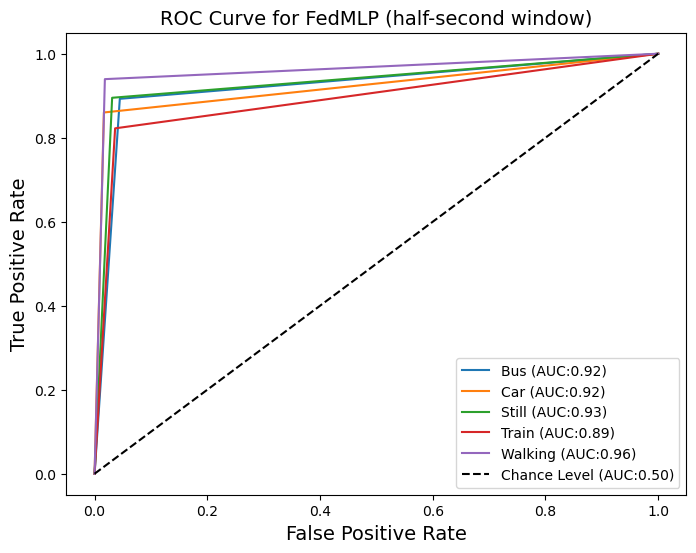

313/313 [==============================] - 1s 4ms/step - loss: 0.4154 - sparse_categorical_accuracy: 0.8527
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 74 | global_acc: 88.328% | global_loss: 1.066986322402954
              precision    recall  f1-score   support

           0       0.85      0.88      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.87      0.91      0.89      2498
           3       0.84      0.83      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9269116998785616


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


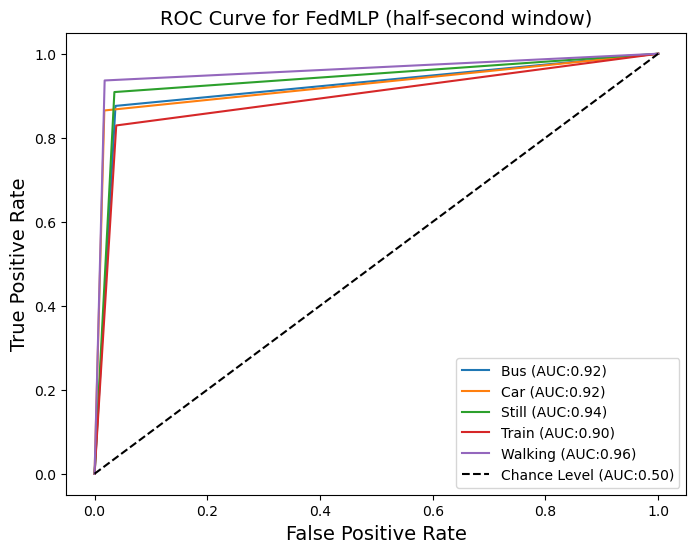

313/313 [==============================] - 2s 4ms/step - loss: 0.3957 - sparse_categorical_accuracy: 0.8560
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 75 | global_acc: 88.352% | global_loss: 1.066444993019104
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.88      0.90      0.89      2498
           3       0.85      0.82      0.83      2471
           4       0.94      0.93      0.94      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9270734909967068


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


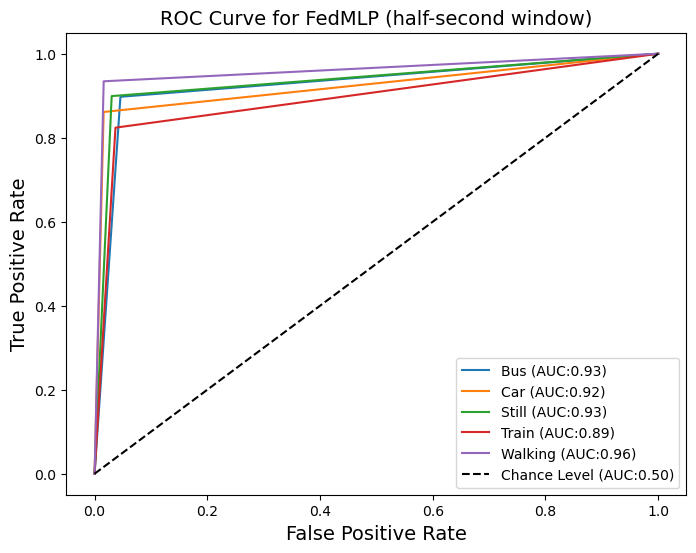

313/313 [==============================] - 2s 4ms/step - loss: 0.4140 - sparse_categorical_accuracy: 0.8490
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 76 | global_acc: 88.472% | global_loss: 1.066339135169983
              precision    recall  f1-score   support

           0       0.84      0.89      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.90      0.89      0.89      2498
           3       0.83      0.84      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.89      0.88      0.88     12517
weighted avg       0.89      0.88      0.88     12517

0.9278328480516154


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


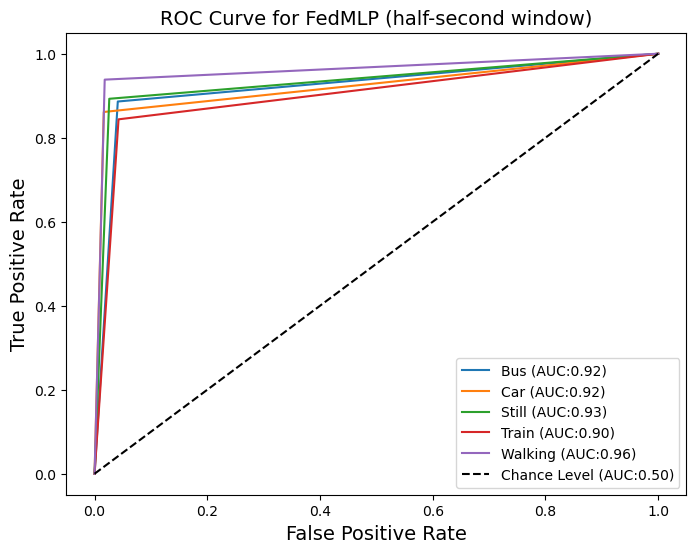

313/313 [==============================] - 1s 4ms/step - loss: 0.4157 - sparse_categorical_accuracy: 0.8501
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 77 | global_acc: 88.184% | global_loss: 1.066980242729187
              precision    recall  f1-score   support

           0       0.81      0.91      0.86      2487
           1       0.93      0.86      0.89      2516
           2       0.90      0.88      0.89      2498
           3       0.85      0.82      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9260230545285781


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


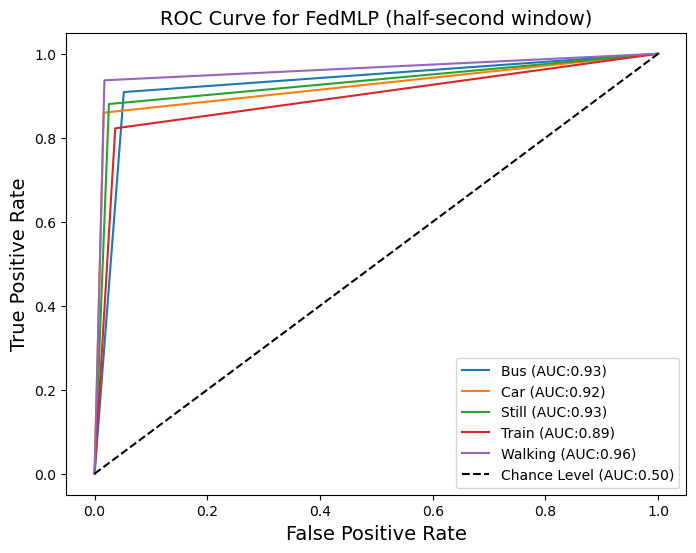

313/313 [==============================] - 1s 4ms/step - loss: 0.3942 - sparse_categorical_accuracy: 0.8577
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 78 | global_acc: 88.360% | global_loss: 1.0655364990234375
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      2487
           1       0.93      0.87      0.90      2516
           2       0.90      0.88      0.89      2498
           3       0.83      0.83      0.83      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.89      0.88      0.88     12517

0.9271287683250646


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


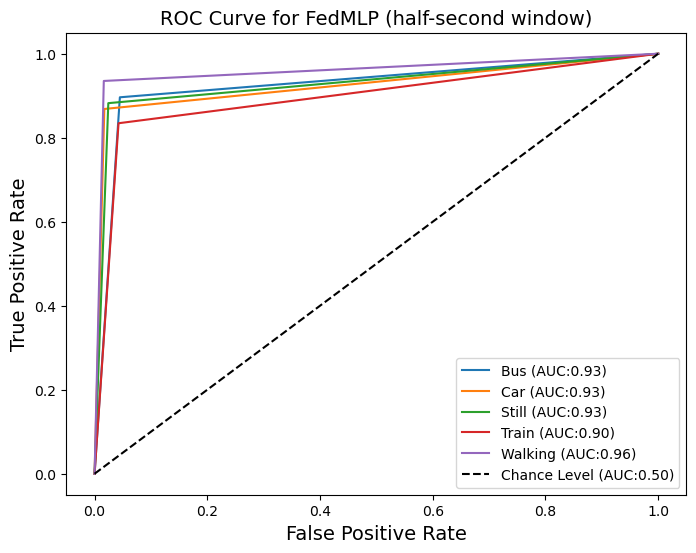

313/313 [==============================] - 2s 4ms/step - loss: 0.4086 - sparse_categorical_accuracy: 0.8572
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 79 | global_acc: 88.631% | global_loss: 1.0652601718902588
              precision    recall  f1-score   support

           0       0.84      0.89      0.86      2487
           1       0.93      0.86      0.90      2516
           2       0.89      0.89      0.89      2498
           3       0.84      0.85      0.84      2471
           4       0.94      0.93      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9288471859163089


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


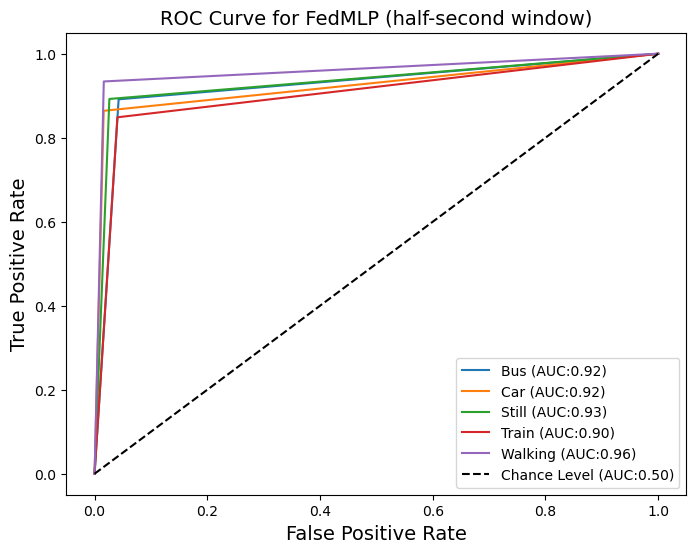

313/313 [==============================] - 1s 4ms/step - loss: 0.3970 - sparse_categorical_accuracy: 0.8568
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 80 | global_acc: 88.592% | global_loss: 1.0644900798797607
              precision    recall  f1-score   support

           0       0.85      0.88      0.86      2487
           1       0.94      0.86      0.89      2516
           2       0.86      0.92      0.89      2498
           3       0.85      0.83      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9285710520431193


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


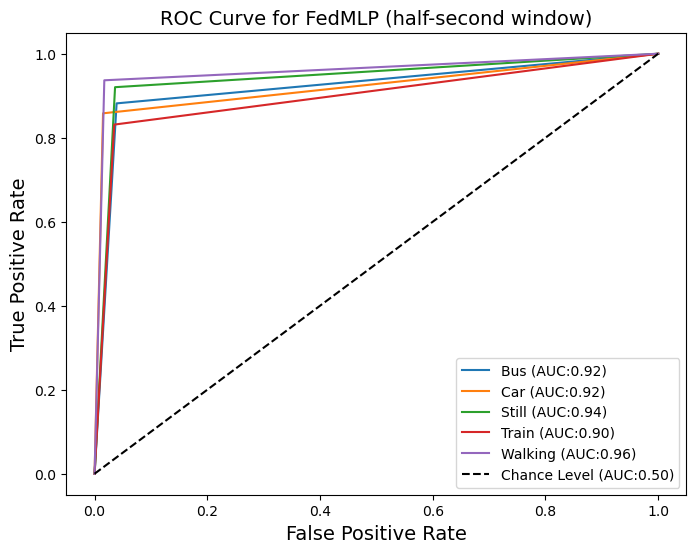

313/313 [==============================] - 2s 4ms/step - loss: 0.4114 - sparse_categorical_accuracy: 0.8533
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 81 | global_acc: 88.464% | global_loss: 1.0632864236831665
              precision    recall  f1-score   support

           0       0.84      0.89      0.86      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.89      0.89      2498
           3       0.84      0.84      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.89      0.88      0.88     12517
weighted avg       0.89      0.88      0.88     12517

0.9277767250137371


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


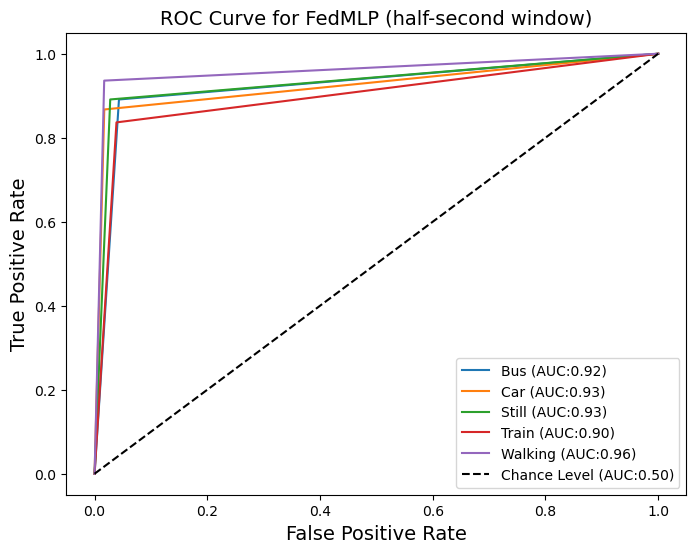

313/313 [==============================] - 2s 4ms/step - loss: 0.3979 - sparse_categorical_accuracy: 0.8576
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 82 | global_acc: 88.735% | global_loss: 1.0634469985961914
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.86      0.90      2516
           2       0.89      0.90      0.89      2498
           3       0.84      0.84      0.84      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9294786140224293


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


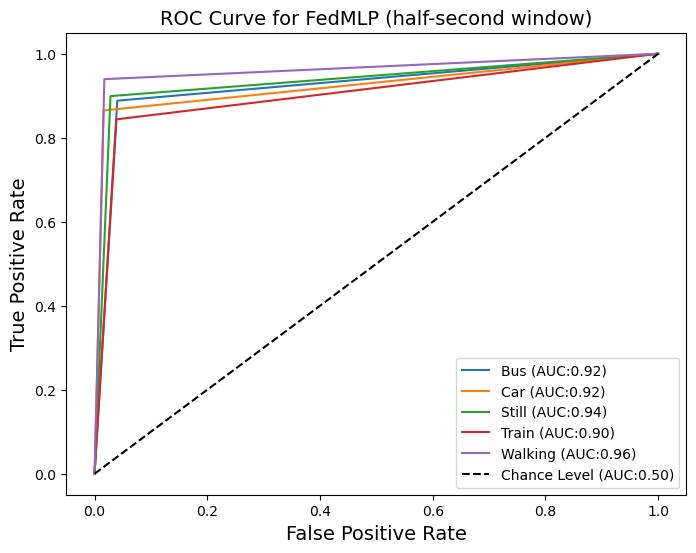

313/313 [==============================] - 2s 4ms/step - loss: 0.4074 - sparse_categorical_accuracy: 0.8515
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 83 | global_acc: 88.663% | global_loss: 1.0631115436553955
              precision    recall  f1-score   support

           0       0.85      0.88      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.89      0.89      2498
           3       0.84      0.85      0.84      2471
           4       0.92      0.95      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9290101619588282


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


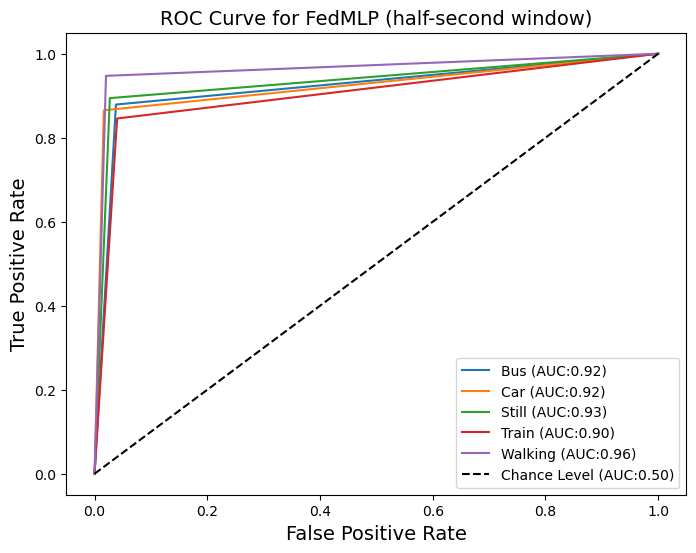

313/313 [==============================] - 1s 4ms/step - loss: 0.4102 - sparse_categorical_accuracy: 0.8542
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 84 | global_acc: 88.783% | global_loss: 1.0624029636383057
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.87      0.91      0.89      2498
           3       0.86      0.83      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9297529233559638


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


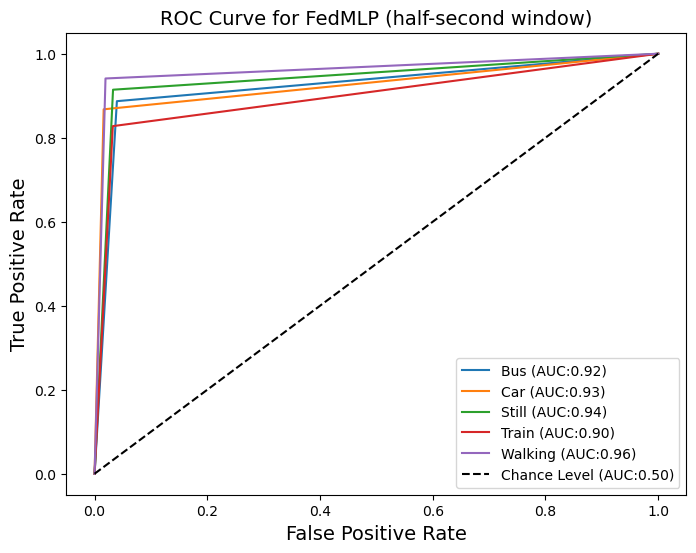

313/313 [==============================] - 1s 4ms/step - loss: 0.4178 - sparse_categorical_accuracy: 0.8530
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 85 | global_acc: 88.759% | global_loss: 1.062393069267273
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.91      0.89      2498
           3       0.86      0.83      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9296044929384898


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


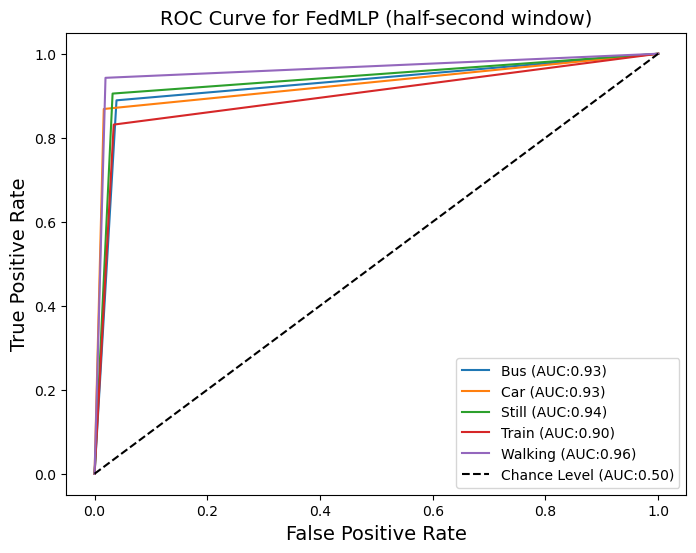

313/313 [==============================] - 1s 4ms/step - loss: 0.4028 - sparse_categorical_accuracy: 0.8565
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 86 | global_acc: 88.631% | global_loss: 1.061556339263916
              precision    recall  f1-score   support

           0       0.84      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.91      0.89      2498
           3       0.85      0.83      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9288133625494437


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


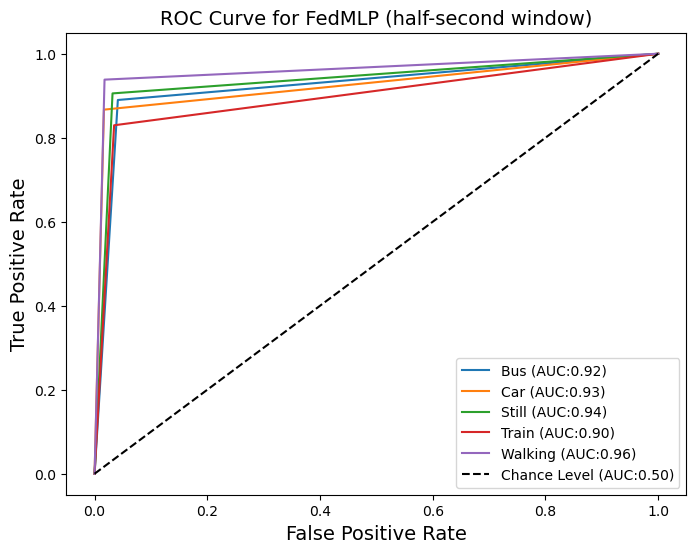

313/313 [==============================] - 1s 4ms/step - loss: 0.3825 - sparse_categorical_accuracy: 0.8622
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 87 | global_acc: 88.384% | global_loss: 1.0619159936904907
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.90      0.89      2498
           3       0.86      0.81      0.83      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.88     12517
   macro avg       0.88      0.88      0.88     12517
weighted avg       0.88      0.88      0.88     12517

0.9272357292005615


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


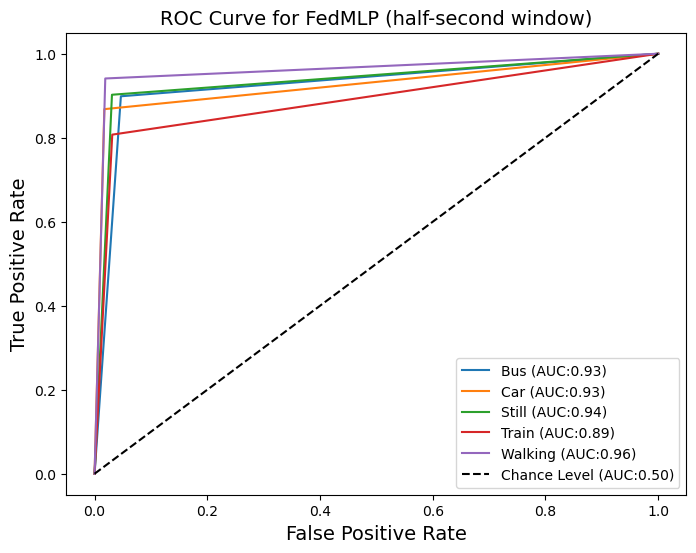

313/313 [==============================] - 2s 4ms/step - loss: 0.4053 - sparse_categorical_accuracy: 0.8553
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 88 | global_acc: 88.783% | global_loss: 1.0616652965545654
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.91      0.90      2498
           3       0.85      0.83      0.84      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9297670042593366


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


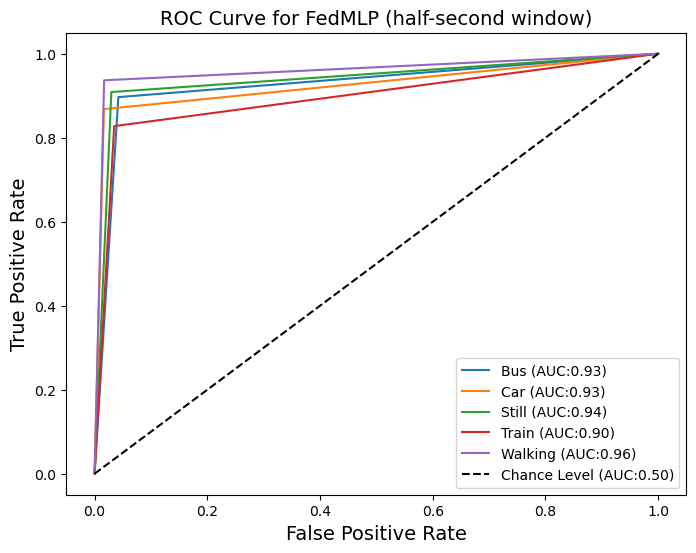

313/313 [==============================] - 2s 4ms/step - loss: 0.4078 - sparse_categorical_accuracy: 0.8541
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 89 | global_acc: 88.719% | global_loss: 1.0620001554489136
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.90      0.89      0.89      2498
           3       0.85      0.84      0.84      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9293644297999325


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


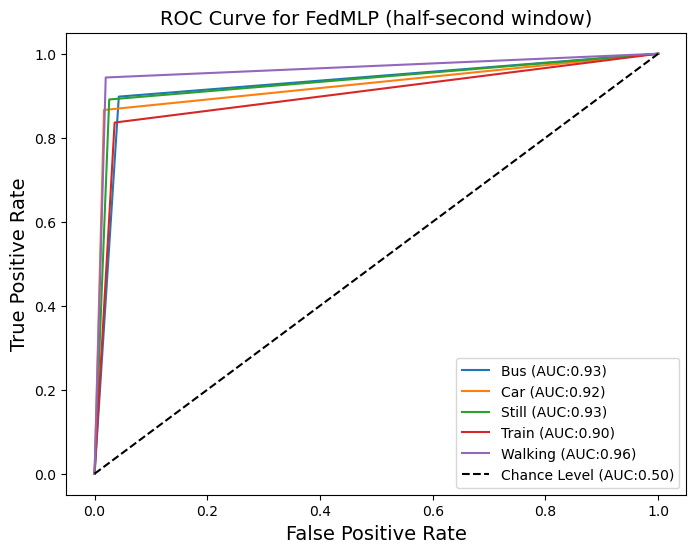

313/313 [==============================] - 1s 4ms/step - loss: 0.4023 - sparse_categorical_accuracy: 0.8521
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 90 | global_acc: 88.719% | global_loss: 1.061400294303894
              precision    recall  f1-score   support

           0       0.84      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.90      0.89      0.90      2498
           3       0.84      0.85      0.84      2471
           4       0.93      0.93      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9293942117268882


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


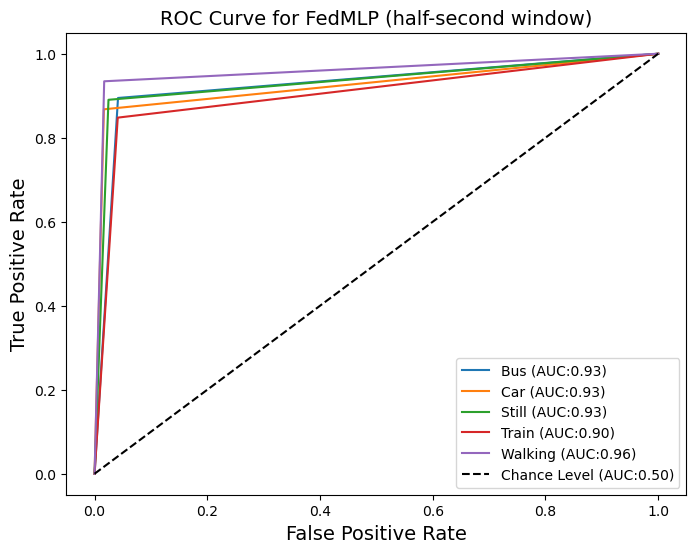

313/313 [==============================] - 1s 4ms/step - loss: 0.4034 - sparse_categorical_accuracy: 0.8556
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 91 | global_acc: 88.831% | global_loss: 1.0593732595443726
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.87      0.92      0.90      2498
           3       0.87      0.83      0.85      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9300507821951252


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


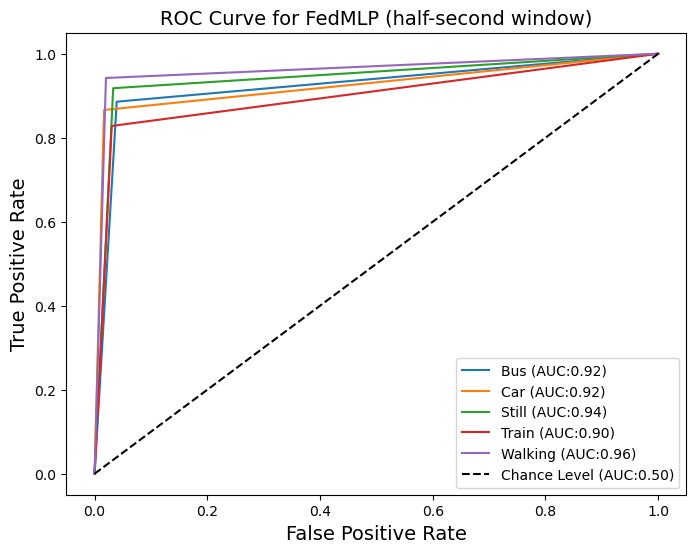

313/313 [==============================] - 1s 4ms/step - loss: 0.4006 - sparse_categorical_accuracy: 0.8618
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 92 | global_acc: 88.831% | global_loss: 1.059918761253357
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.90      0.89      0.90      2498
           3       0.83      0.86      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9300970057578322


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


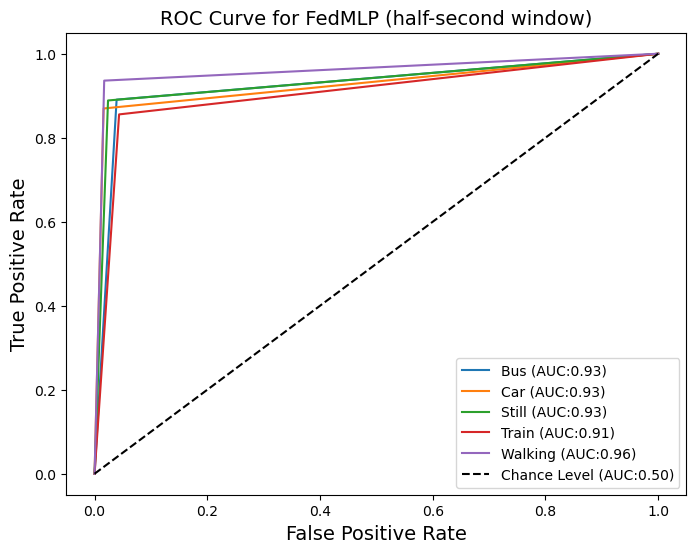

313/313 [==============================] - 2s 4ms/step - loss: 0.4057 - sparse_categorical_accuracy: 0.8514
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 93 | global_acc: 88.887% | global_loss: 1.0598095655441284
              precision    recall  f1-score   support

           0       0.84      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.90      0.90      2498
           3       0.86      0.84      0.85      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9304217290319109


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


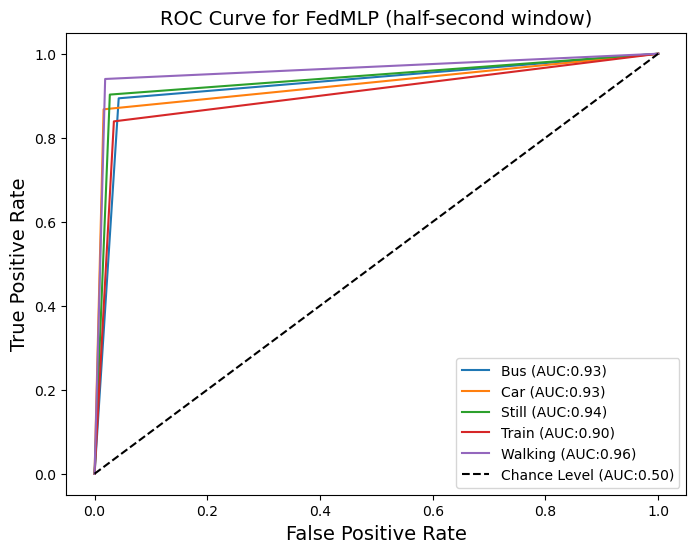

313/313 [==============================] - 1s 4ms/step - loss: 0.3751 - sparse_categorical_accuracy: 0.8666
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 94 | global_acc: 88.727% | global_loss: 1.0590983629226685
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.90      0.89      0.90      2498
           3       0.83      0.85      0.84      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9294439244603477


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


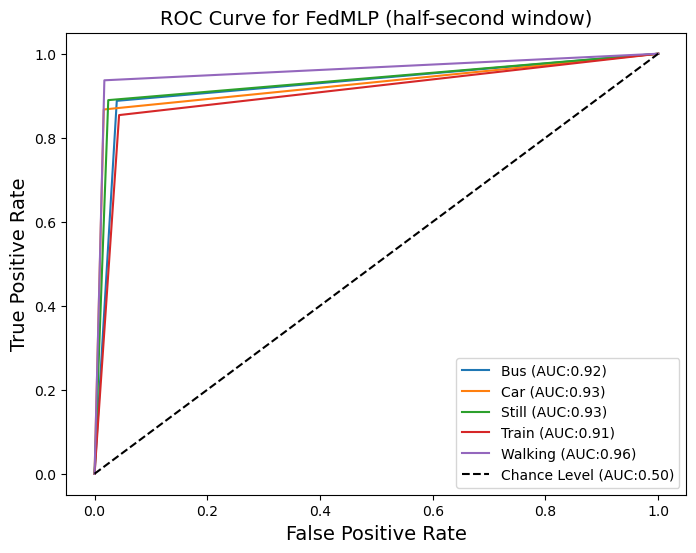

313/313 [==============================] - 2s 4ms/step - loss: 0.3743 - sparse_categorical_accuracy: 0.8664
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 95 | global_acc: 88.791% | global_loss: 1.0591285228729248
              precision    recall  f1-score   support

           0       0.84      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.87      0.92      0.89      2498
           3       0.87      0.82      0.84      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9297927061720875


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


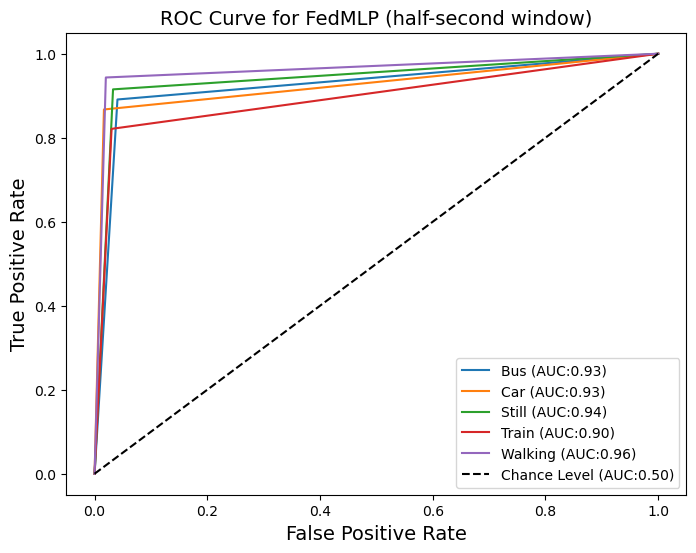

313/313 [==============================] - 1s 4ms/step - loss: 0.3817 - sparse_categorical_accuracy: 0.8625
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 96 | global_acc: 89.039% | global_loss: 1.0592163801193237
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.90      0.90      2498
           3       0.86      0.84      0.85      2471
           4       0.94      0.93      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9313809619800228


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


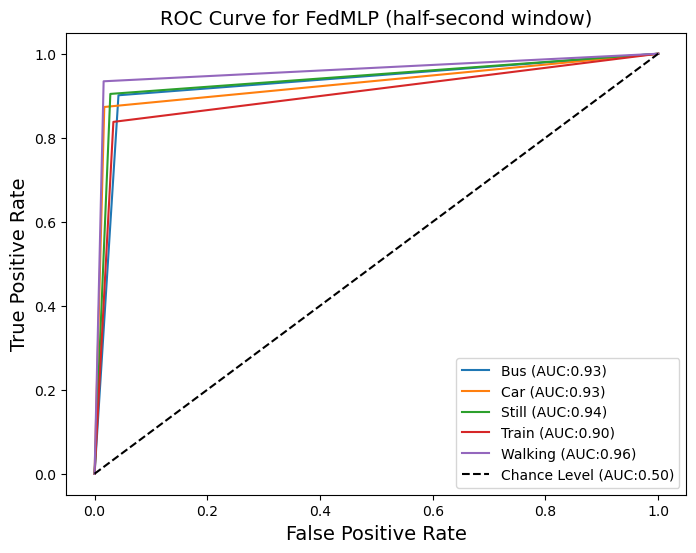

313/313 [==============================] - 1s 4ms/step - loss: 0.3983 - sparse_categorical_accuracy: 0.8591
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 97 | global_acc: 88.967% | global_loss: 1.0584301948547363
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.86      0.90      2516
           2       0.88      0.92      0.90      2498
           3       0.87      0.83      0.85      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9309271017327421


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


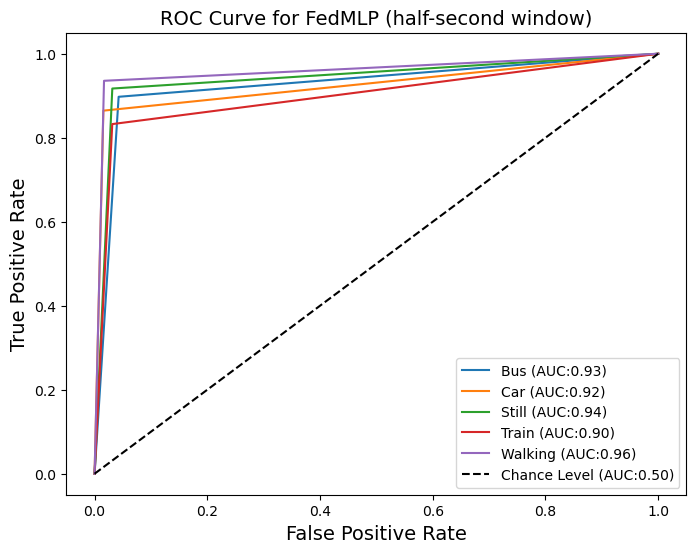

313/313 [==============================] - 1s 4ms/step - loss: 0.3974 - sparse_categorical_accuracy: 0.8621
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 98 | global_acc: 88.991% | global_loss: 1.058336853981018
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.90      0.90      2498
           3       0.85      0.84      0.85      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9310660504593116


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


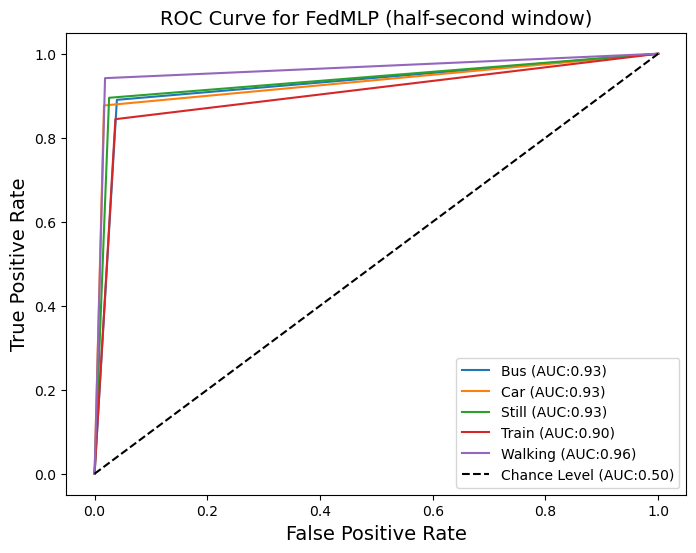

313/313 [==============================] - 1s 4ms/step - loss: 0.3781 - sparse_categorical_accuracy: 0.8668
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 99 | global_acc: 89.175% | global_loss: 1.0579947233200073
              precision    recall  f1-score   support

           0       0.86      0.88      0.87      2487
           1       0.93      0.86      0.90      2516
           2       0.87      0.94      0.90      2498
           3       0.87      0.83      0.85      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9322032117195633


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


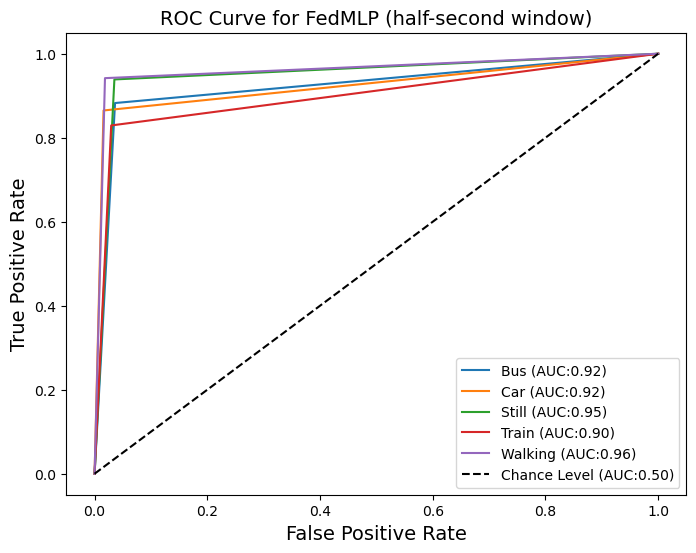

313/313 [==============================] - 1s 4ms/step - loss: 0.3779 - sparse_categorical_accuracy: 0.8654
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 100 | global_acc: 89.095% | global_loss: 1.0576435327529907
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.91      0.90      2498
           3       0.86      0.85      0.85      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9317235981743821


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


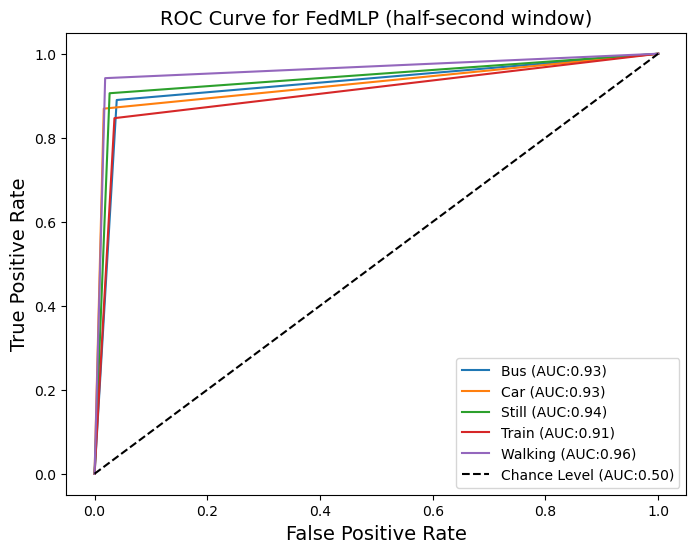

313/313 [==============================] - 1s 4ms/step - loss: 0.3907 - sparse_categorical_accuracy: 0.8587
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 101 | global_acc: 89.223% | global_loss: 1.0574290752410889
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.93      0.90      2498
           3       0.88      0.83      0.85      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9325055340430006


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


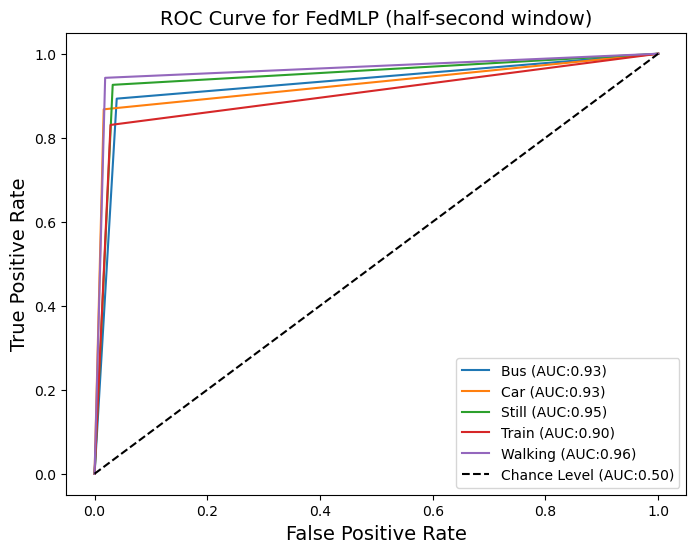

313/313 [==============================] - 2s 4ms/step - loss: 0.3989 - sparse_categorical_accuracy: 0.8620
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 102 | global_acc: 89.007% | global_loss: 1.0559955835342407
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.91      0.90      2498
           3       0.86      0.84      0.85      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9311710024424091


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


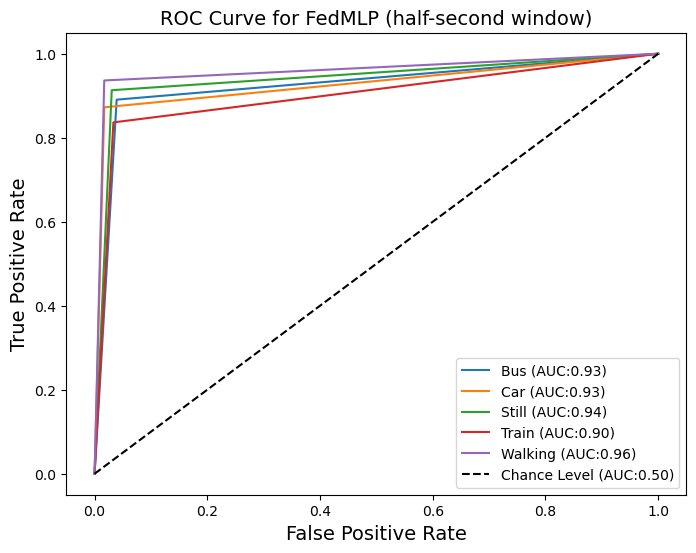

313/313 [==============================] - 1s 4ms/step - loss: 0.3831 - sparse_categorical_accuracy: 0.8591
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 103 | global_acc: 89.239% | global_loss: 1.0572443008422852
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.92      0.90      2498
           3       0.88      0.83      0.85      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9326092808542429


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


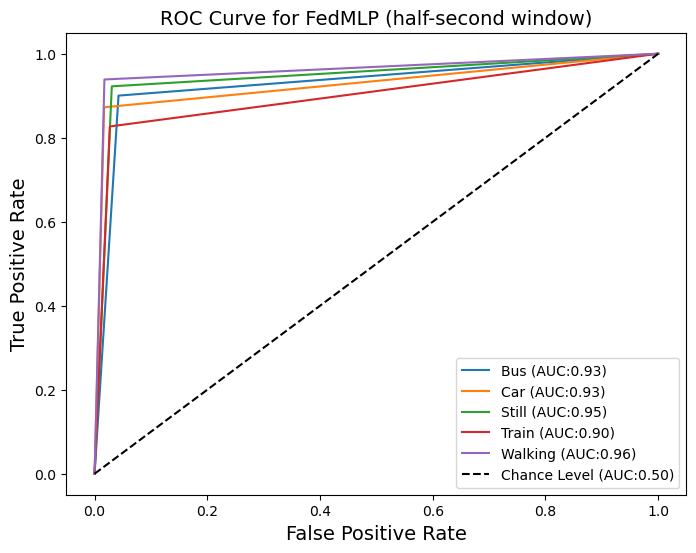

313/313 [==============================] - 1s 4ms/step - loss: 0.3843 - sparse_categorical_accuracy: 0.8630
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 104 | global_acc: 89.135% | global_loss: 1.0566930770874023
              precision    recall  f1-score   support

           0       0.86      0.88      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.90      0.91      0.90      2498
           3       0.84      0.86      0.85      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9319972881859888


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


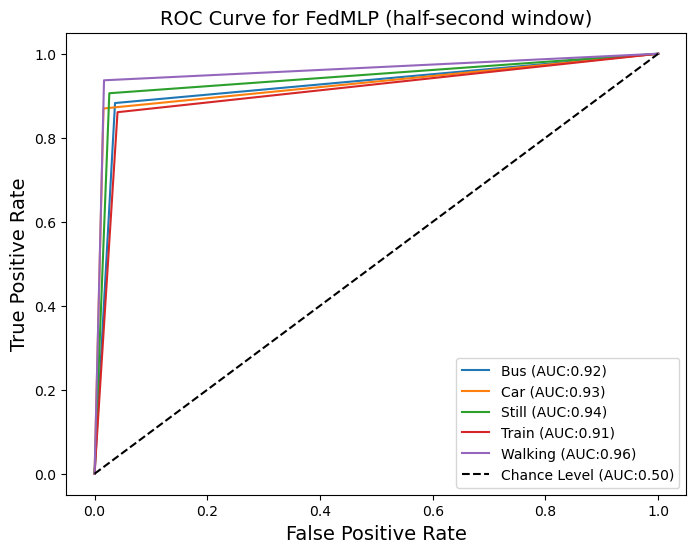

313/313 [==============================] - 1s 4ms/step - loss: 0.3818 - sparse_categorical_accuracy: 0.8657
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 105 | global_acc: 89.015% | global_loss: 1.0575214624404907
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.91      0.89      0.90      2498
           3       0.85      0.84      0.84      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9312095837948385


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


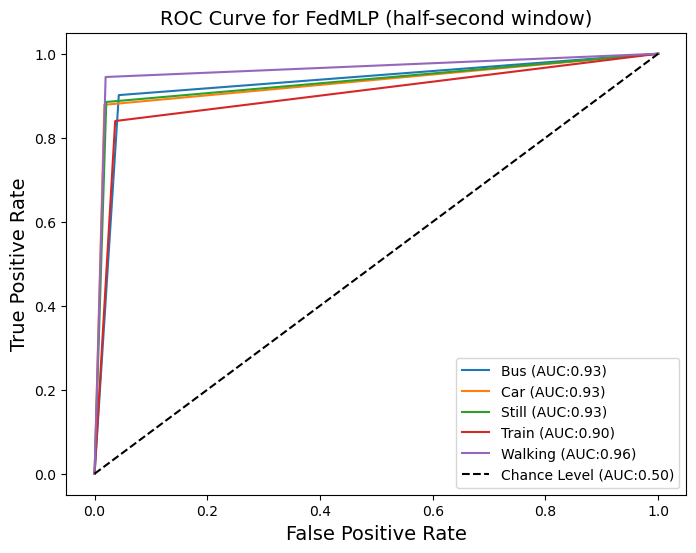

313/313 [==============================] - 1s 4ms/step - loss: 0.4001 - sparse_categorical_accuracy: 0.8606
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 106 | global_acc: 89.199% | global_loss: 1.0561596155166626
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.91      0.90      2498
           3       0.87      0.85      0.86      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9323742007018636


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


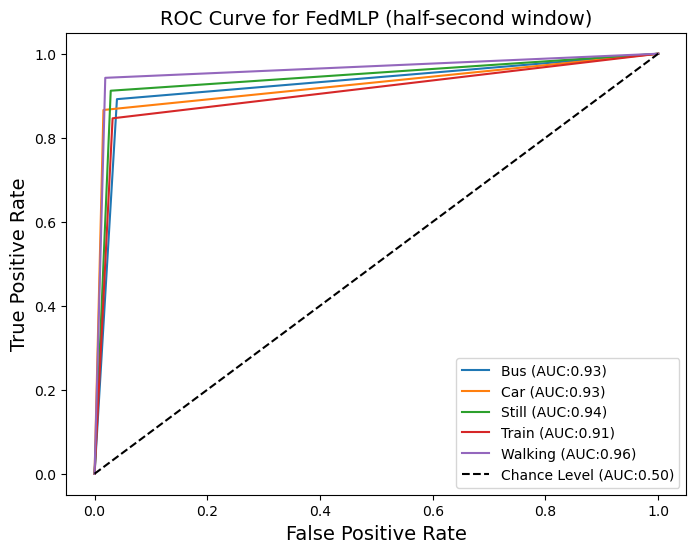

313/313 [==============================] - 1s 4ms/step - loss: 0.3897 - sparse_categorical_accuracy: 0.8631
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 107 | global_acc: 89.327% | global_loss: 1.0550309419631958
              precision    recall  f1-score   support

           0       0.85      0.90      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.89      0.91      0.90      2498
           3       0.87      0.84      0.85      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9331643132298625


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


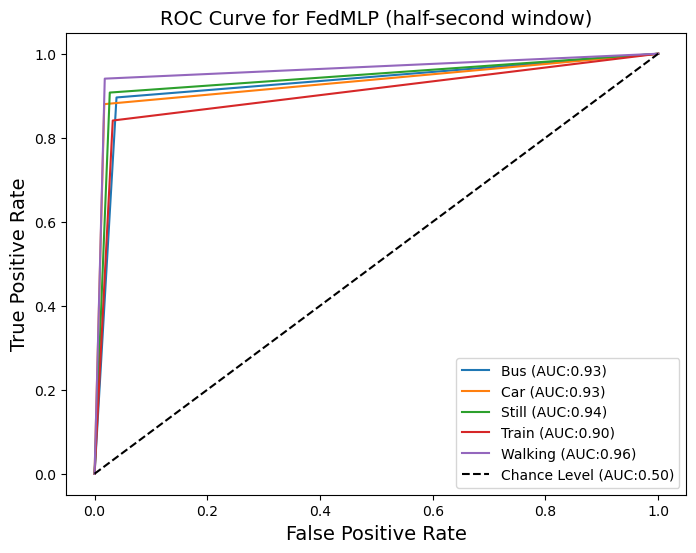

313/313 [==============================] - 1s 4ms/step - loss: 0.3884 - sparse_categorical_accuracy: 0.8649
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 108 | global_acc: 89.223% | global_loss: 1.0556775331497192
              precision    recall  f1-score   support

           0       0.85      0.88      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.88      0.93      0.90      2498
           3       0.87      0.84      0.85      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9325166212143265


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


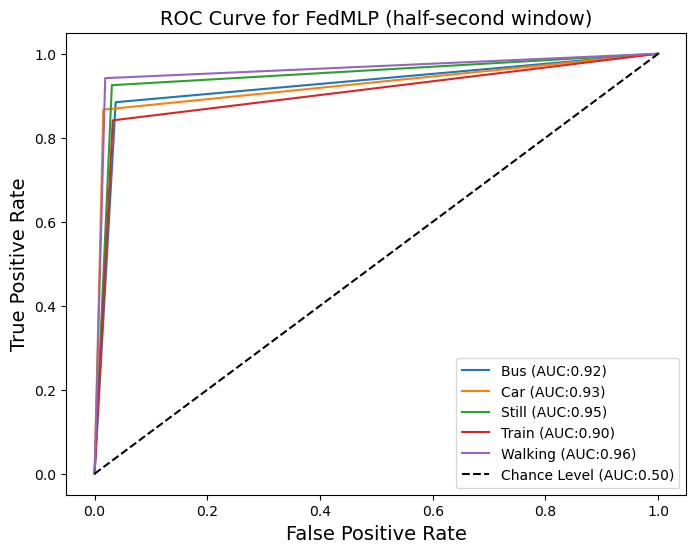

313/313 [==============================] - 1s 4ms/step - loss: 0.3872 - sparse_categorical_accuracy: 0.8638
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 109 | global_acc: 89.239% | global_loss: 1.0558629035949707
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.91      0.90      2498
           3       0.86      0.84      0.85      2471
           4       0.92      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9326144435244215


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


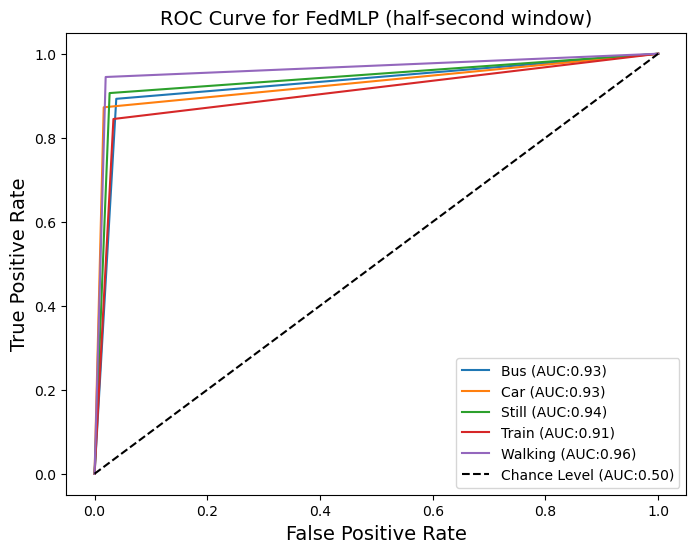

313/313 [==============================] - 1s 4ms/step - loss: 0.3759 - sparse_categorical_accuracy: 0.8693
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 110 | global_acc: 89.438% | global_loss: 1.0542443990707397
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.92      0.90      2498
           3       0.88      0.84      0.86      2471
           4       0.94      0.93      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.90      0.89      0.89     12517
weighted avg       0.90      0.89      0.89     12517

0.9338842349750962


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


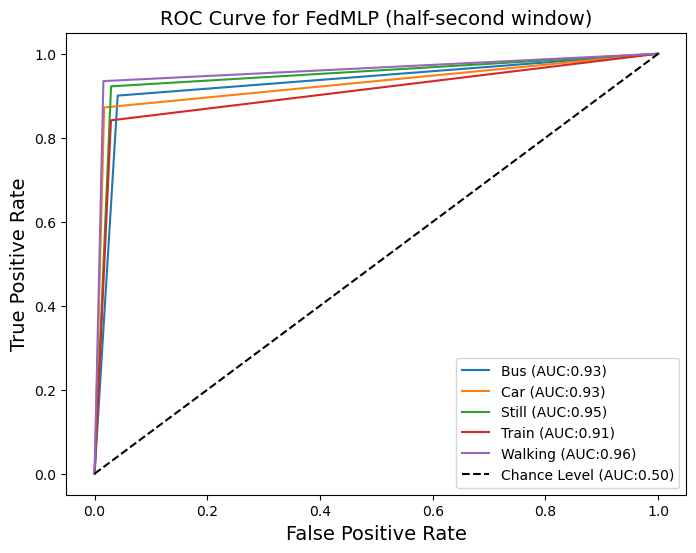

313/313 [==============================] - 1s 4ms/step - loss: 0.3658 - sparse_categorical_accuracy: 0.8678
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 111 | global_acc: 89.311% | global_loss: 1.0542967319488525
              precision    recall  f1-score   support

           0       0.86      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.91      0.90      2498
           3       0.85      0.86      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9330950333104688


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


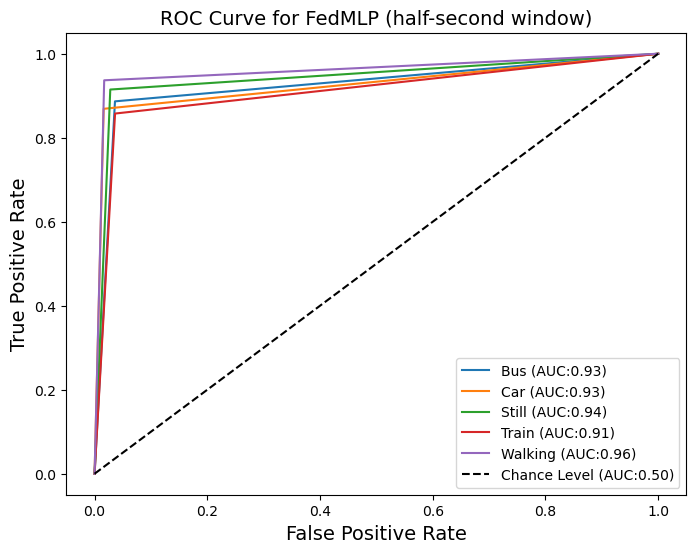

313/313 [==============================] - 1s 4ms/step - loss: 0.3766 - sparse_categorical_accuracy: 0.8625
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 112 | global_acc: 89.454% | global_loss: 1.0535632371902466
              precision    recall  f1-score   support

           0       0.85      0.90      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.89      0.91      0.90      2498
           3       0.87      0.85      0.86      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.89     12517
   macro avg       0.90      0.89      0.89     12517
weighted avg       0.90      0.89      0.89     12517

0.9339830081996746


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


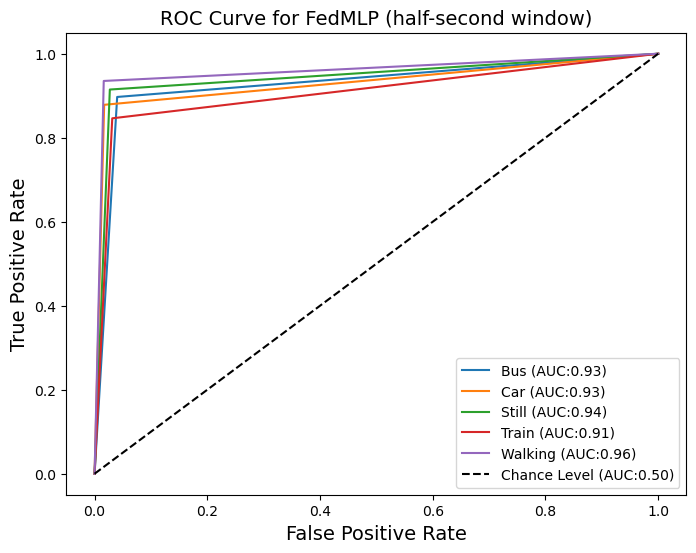

313/313 [==============================] - 1s 4ms/step - loss: 0.3788 - sparse_categorical_accuracy: 0.8638
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 113 | global_acc: 89.454% | global_loss: 1.0534003973007202
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.88      0.92      0.90      2498
           3       0.88      0.83      0.86      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.90      0.89      0.89     12517

0.9339476413382914


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


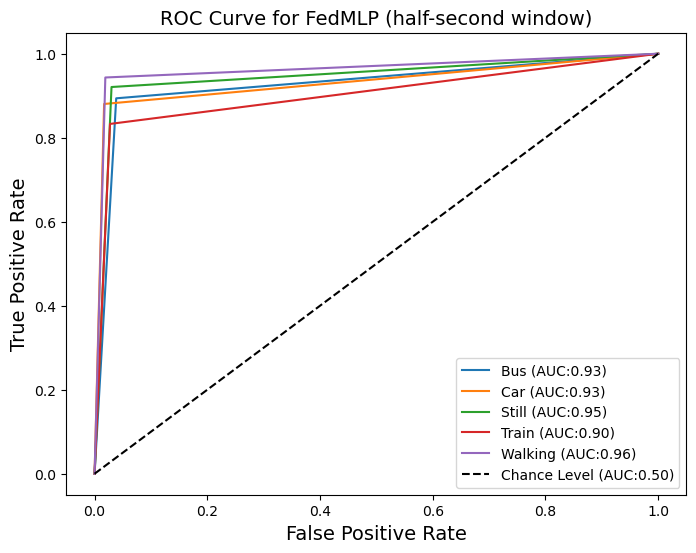

313/313 [==============================] - 2s 4ms/step - loss: 0.3759 - sparse_categorical_accuracy: 0.8722
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 114 | global_acc: 89.558% | global_loss: 1.05305016040802
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.93      0.91      2498
           3       0.88      0.85      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9346270495769208


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


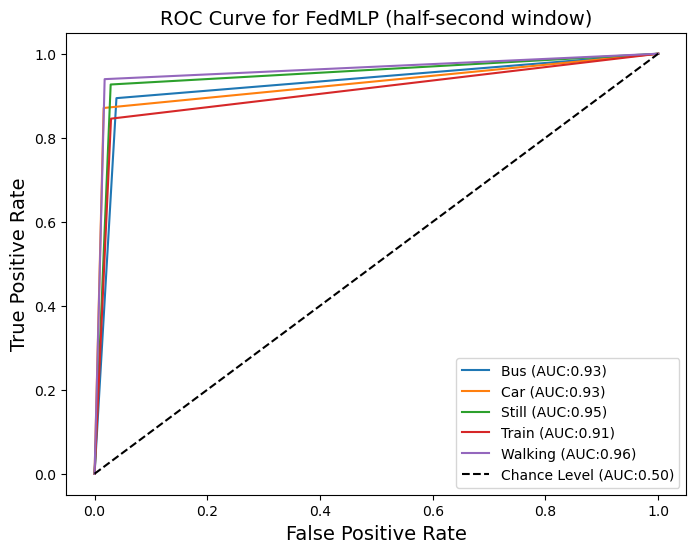

313/313 [==============================] - 2s 4ms/step - loss: 0.3767 - sparse_categorical_accuracy: 0.8706
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 115 | global_acc: 89.382% | global_loss: 1.0552040338516235
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.92      0.89      0.90      2498
           3       0.84      0.87      0.85      2471
           4       0.92      0.95      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.89      0.89      0.89     12517

0.9335319686388417


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


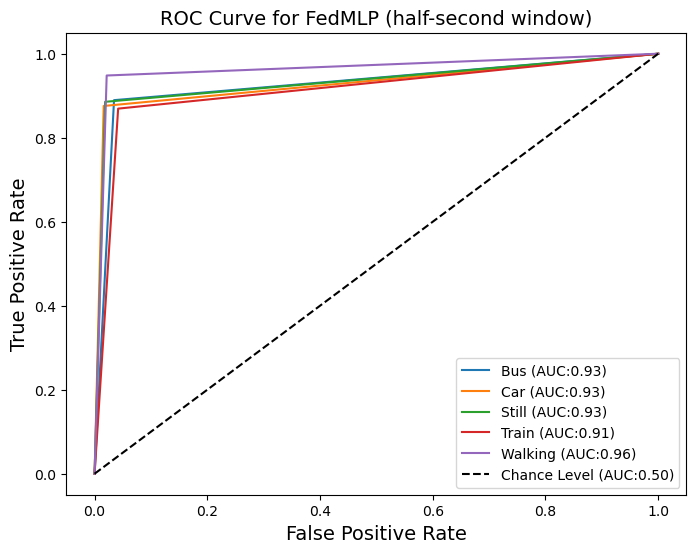

313/313 [==============================] - 2s 4ms/step - loss: 0.3887 - sparse_categorical_accuracy: 0.8620
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 116 | global_acc: 89.534% | global_loss: 1.0524847507476807
              precision    recall  f1-score   support

           0       0.86      0.89      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.91      0.91      0.91      2498
           3       0.85      0.86      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9344824544596639


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


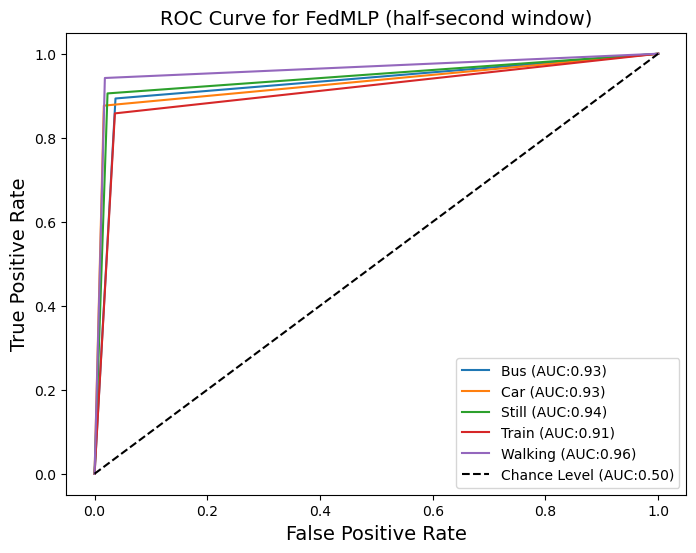

313/313 [==============================] - 1s 4ms/step - loss: 0.3896 - sparse_categorical_accuracy: 0.8607
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 117 | global_acc: 89.422% | global_loss: 1.053405523300171
              precision    recall  f1-score   support

           0       0.85      0.90      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.92      0.90      2498
           3       0.87      0.84      0.86      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.90      0.89      0.89     12517

0.9337719693214546


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


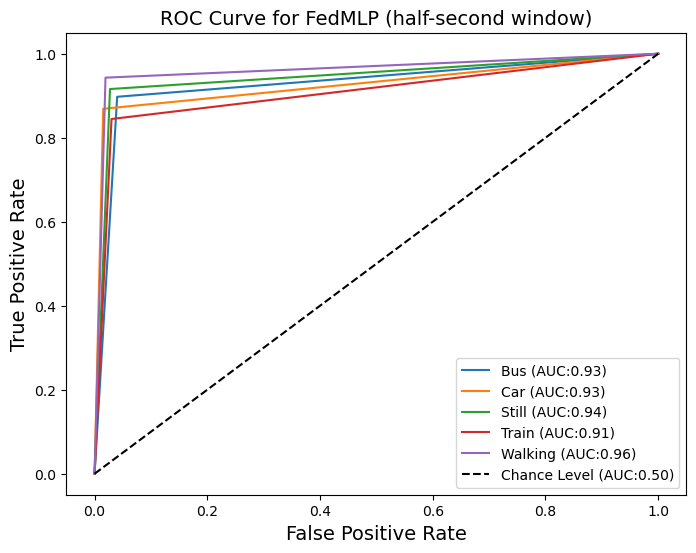

313/313 [==============================] - 1s 4ms/step - loss: 0.3735 - sparse_categorical_accuracy: 0.8696
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 118 | global_acc: 89.718% | global_loss: 1.0522879362106323
              precision    recall  f1-score   support

           0       0.85      0.90      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.88      0.94      0.91      2498
           3       0.89      0.83      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9356138233540399


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


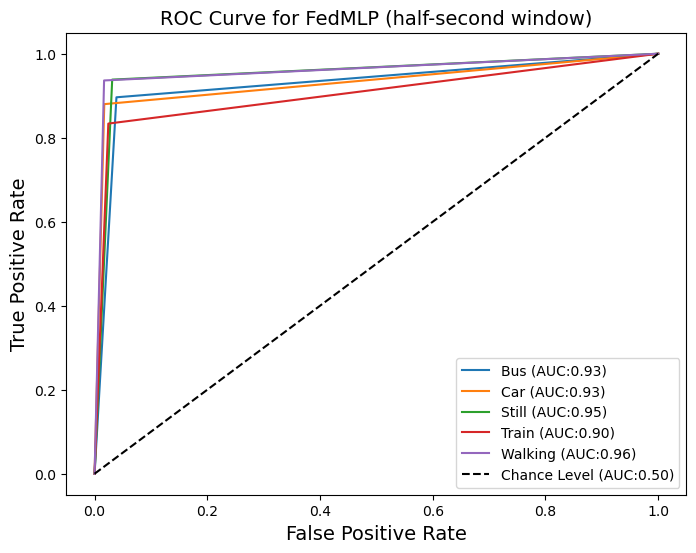

313/313 [==============================] - 1s 4ms/step - loss: 0.3912 - sparse_categorical_accuracy: 0.8595
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 119 | global_acc: 89.518% | global_loss: 1.0522390604019165
              precision    recall  f1-score   support

           0       0.85      0.90      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.91      0.91      2498
           3       0.86      0.85      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.89      0.89     12517
weighted avg       0.90      0.90      0.90     12517

0.9343771552209981


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


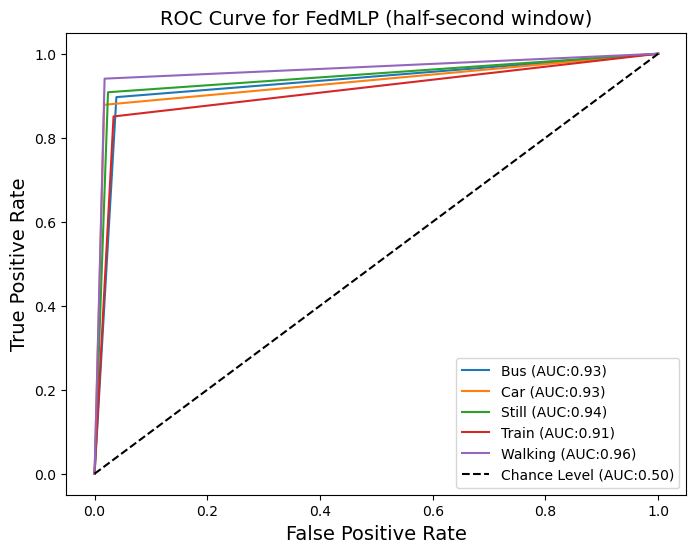

313/313 [==============================] - 1s 4ms/step - loss: 0.3872 - sparse_categorical_accuracy: 0.8648
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 120 | global_acc: 89.398% | global_loss: 1.054093360900879
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.91      0.90      0.91      2498
           3       0.87      0.85      0.86      2471
           4       0.92      0.95      0.93      2545

    accuracy                           0.89     12517
   macro avg       0.89      0.89      0.89     12517
weighted avg       0.90      0.89      0.89     12517

0.933613803623558


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


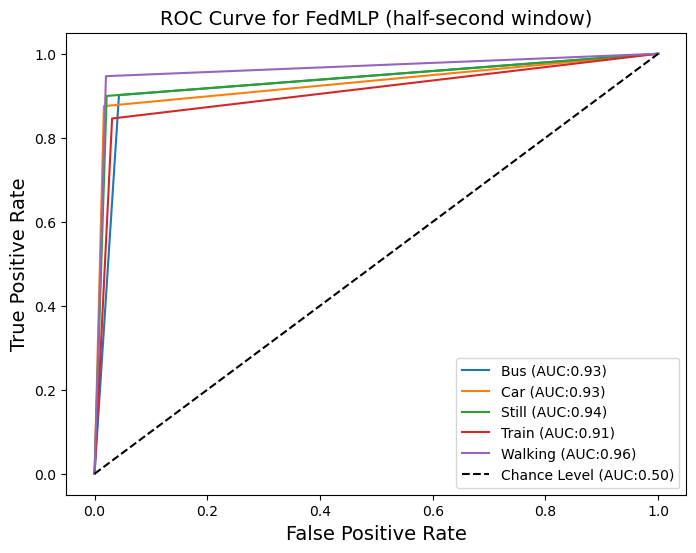

313/313 [==============================] - 1s 4ms/step - loss: 0.3598 - sparse_categorical_accuracy: 0.8711
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 121 | global_acc: 89.654% | global_loss: 1.051604986190796
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.91      0.91      0.91      2498
           3       0.86      0.86      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9352336392893171


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


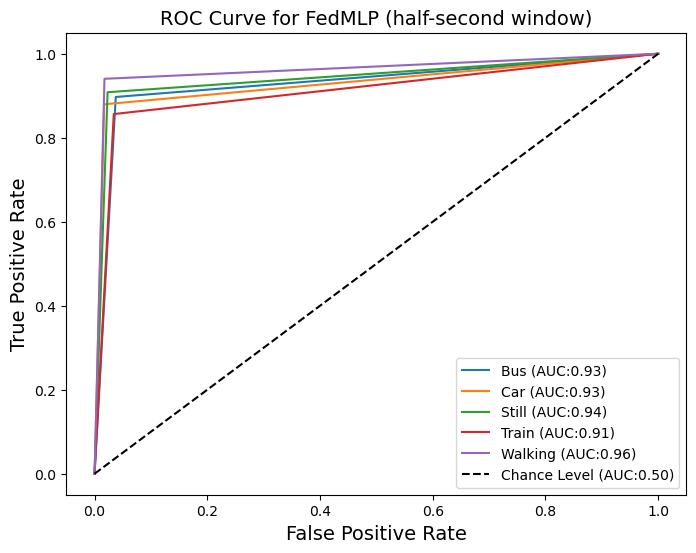

313/313 [==============================] - 1s 4ms/step - loss: 0.3861 - sparse_categorical_accuracy: 0.8667
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 122 | global_acc: 89.598% | global_loss: 1.0515297651290894
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.92      0.91      2498
           3       0.87      0.85      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9348768968378376


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


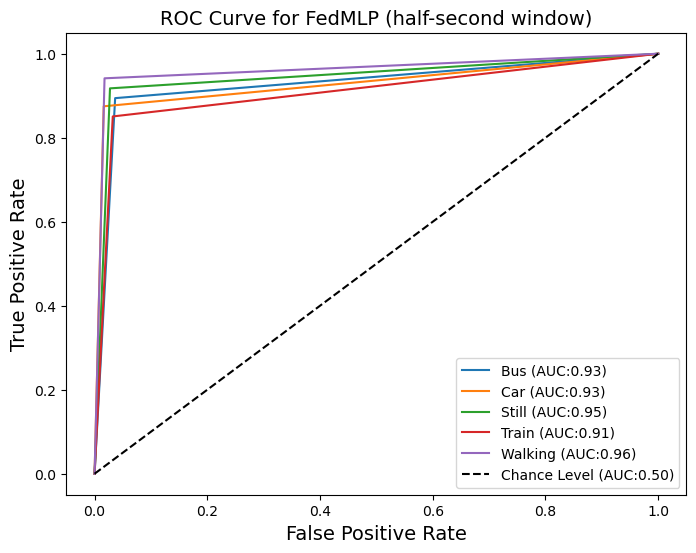

313/313 [==============================] - 1s 4ms/step - loss: 0.3670 - sparse_categorical_accuracy: 0.8733
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 123 | global_acc: 89.822% | global_loss: 1.0511223077774048
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.89      0.93      0.91      2498
           3       0.88      0.85      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.936261668667731


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


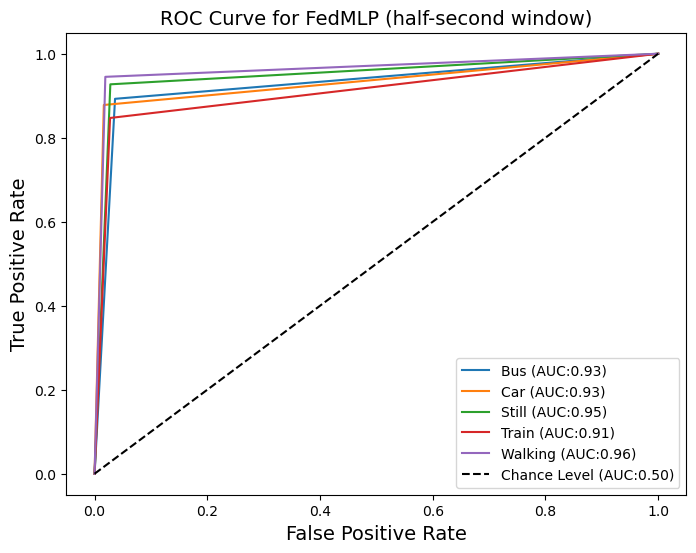

313/313 [==============================] - 1s 4ms/step - loss: 0.3685 - sparse_categorical_accuracy: 0.8683
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 124 | global_acc: 89.534% | global_loss: 1.0512701272964478
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.91      0.90      0.91      2498
           3       0.87      0.85      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9344769059013707


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


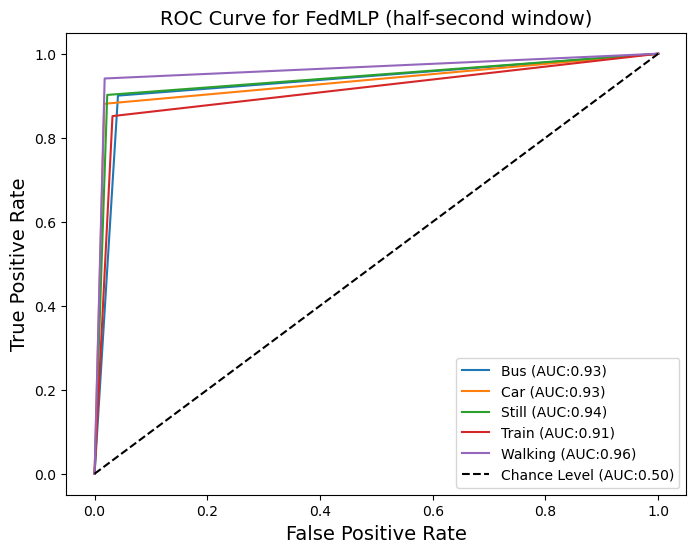

313/313 [==============================] - 1s 4ms/step - loss: 0.3725 - sparse_categorical_accuracy: 0.8714
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 125 | global_acc: 89.502% | global_loss: 1.0501104593276978
              precision    recall  f1-score   support

           0       0.86      0.89      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.89      0.92      0.91      2498
           3       0.86      0.86      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.89      0.89     12517
weighted avg       0.90      0.90      0.90     12517

0.9342855435935213


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


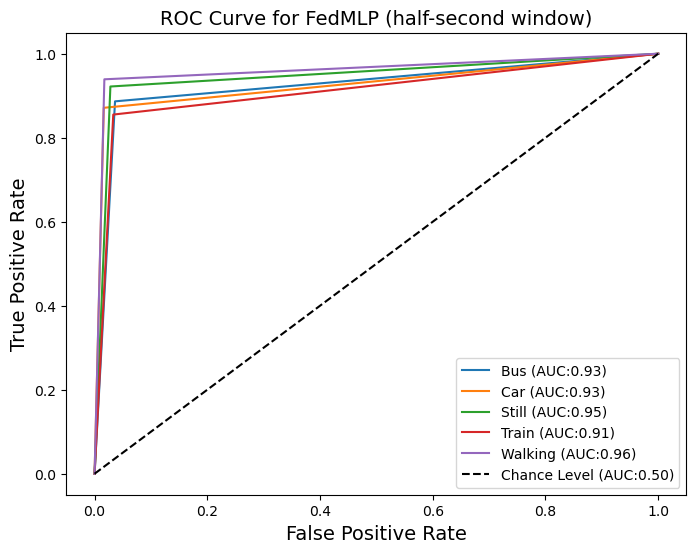

313/313 [==============================] - 1s 4ms/step - loss: 0.3606 - sparse_categorical_accuracy: 0.8700
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 126 | global_acc: 89.990% | global_loss: 1.0509852170944214
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.89      0.93      0.91      2498
           3       0.89      0.85      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9373153968453855


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


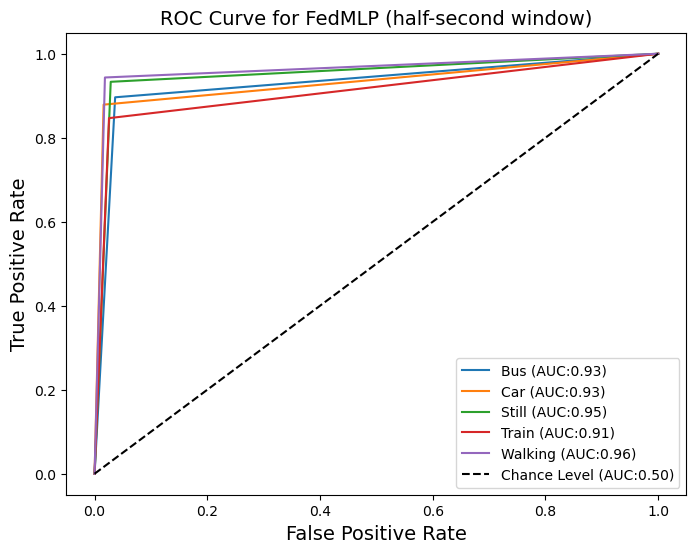

313/313 [==============================] - 1s 4ms/step - loss: 0.3677 - sparse_categorical_accuracy: 0.8733
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 127 | global_acc: 89.718% | global_loss: 1.0502662658691406
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.91      0.91      2498
           3       0.86      0.87      0.86      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9356494470603318


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


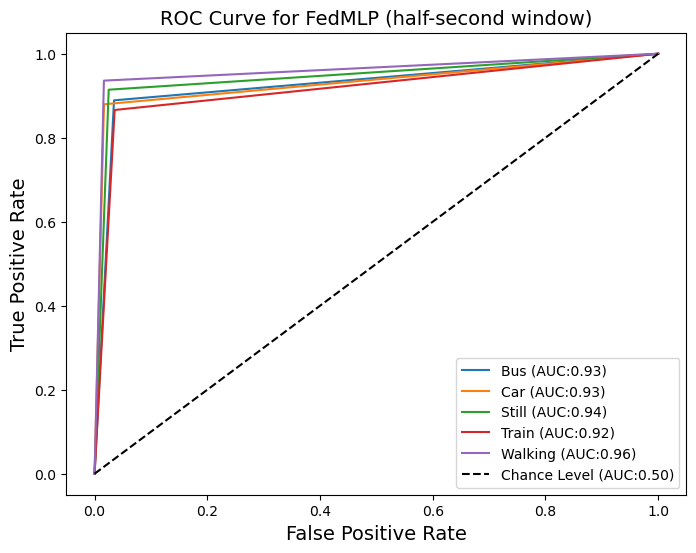

313/313 [==============================] - 1s 4ms/step - loss: 0.3844 - sparse_categorical_accuracy: 0.8654
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 128 | global_acc: 89.806% | global_loss: 1.0505359172821045
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.91      0.91      2498
           3       0.87      0.86      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9361835466279992


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


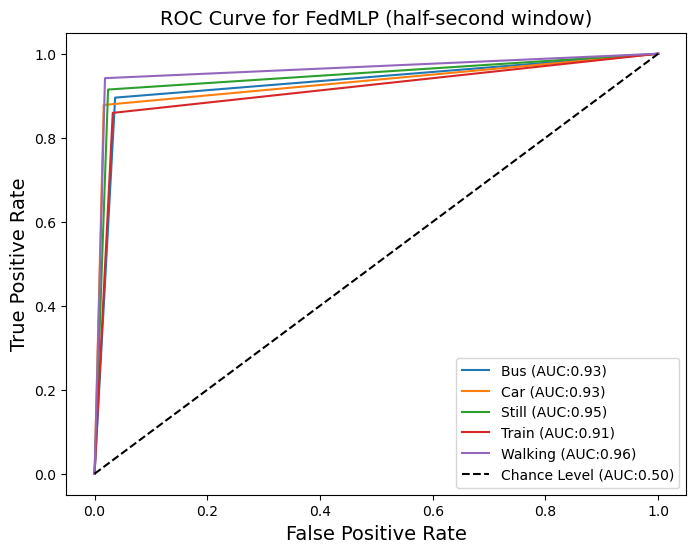

313/313 [==============================] - 2s 4ms/step - loss: 0.3577 - sparse_categorical_accuracy: 0.8727
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 129 | global_acc: 89.814% | global_loss: 1.049372673034668
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.89      0.92      0.91      2498
           3       0.88      0.85      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9362276693728429


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


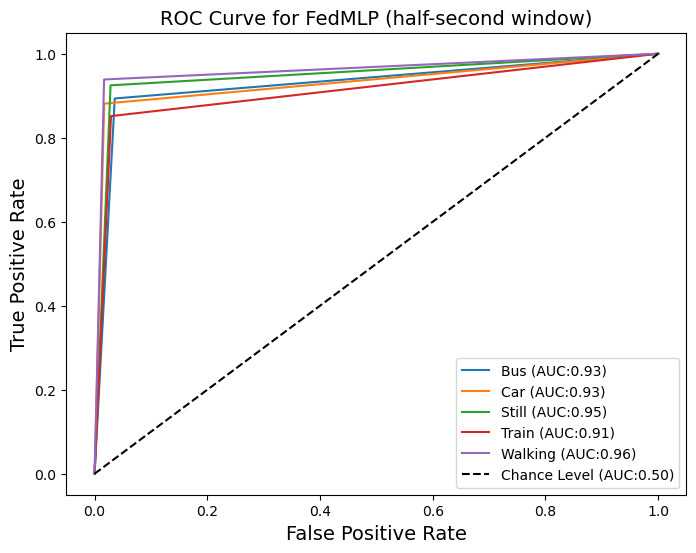

313/313 [==============================] - 2s 4ms/step - loss: 0.3530 - sparse_categorical_accuracy: 0.8750
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 130 | global_acc: 89.814% | global_loss: 1.049575686454773
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.89      0.93      0.91      2498
           3       0.87      0.86      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9362309310727666


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


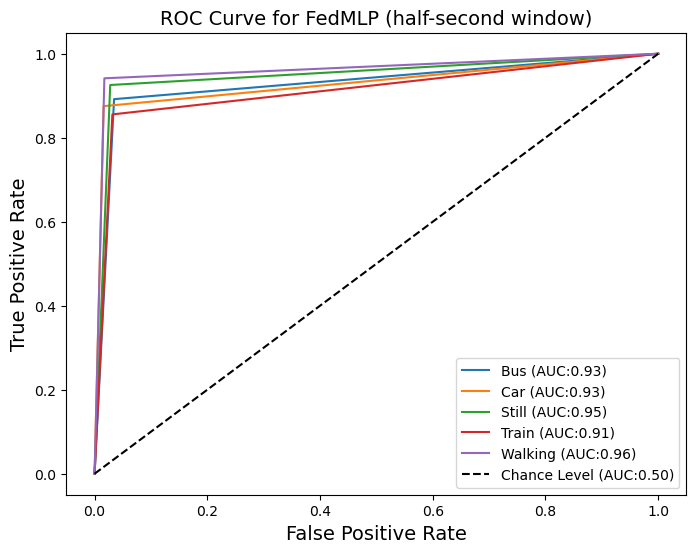

313/313 [==============================] - 1s 4ms/step - loss: 0.3836 - sparse_categorical_accuracy: 0.8652
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 131 | global_acc: 89.702% | global_loss: 1.0493724346160889
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      2487
           1       0.93      0.88      0.90      2516
           2       0.89      0.92      0.91      2498
           3       0.88      0.85      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9355290981567158


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


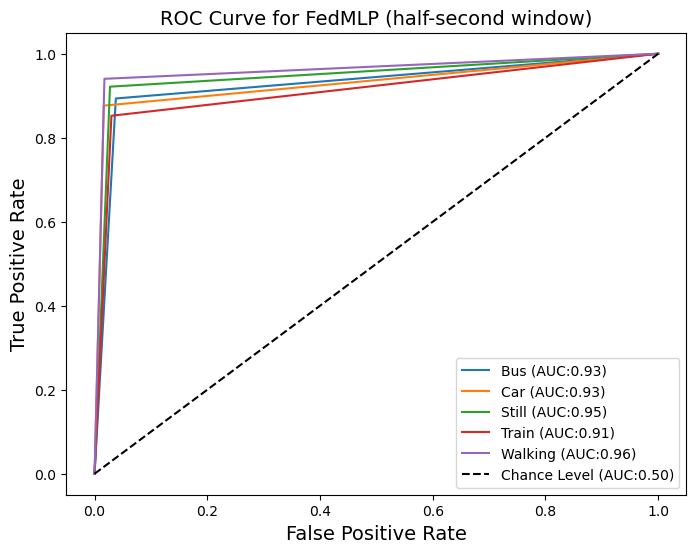

313/313 [==============================] - 1s 4ms/step - loss: 0.3626 - sparse_categorical_accuracy: 0.8745
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 132 | global_acc: 89.806% | global_loss: 1.0480488538742065
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.91      0.91      2498
           3       0.87      0.86      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9361892865698488


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


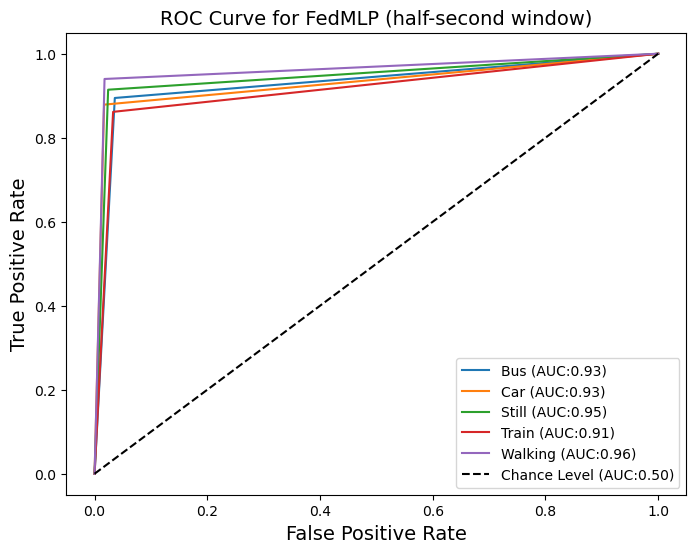

313/313 [==============================] - 2s 4ms/step - loss: 0.3572 - sparse_categorical_accuracy: 0.8723
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 133 | global_acc: 89.798% | global_loss: 1.0489044189453125
              precision    recall  f1-score   support

           0       0.85      0.90      0.87      2487
           1       0.93      0.87      0.90      2516
           2       0.90      0.92      0.91      2498
           3       0.87      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9361416665291603


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


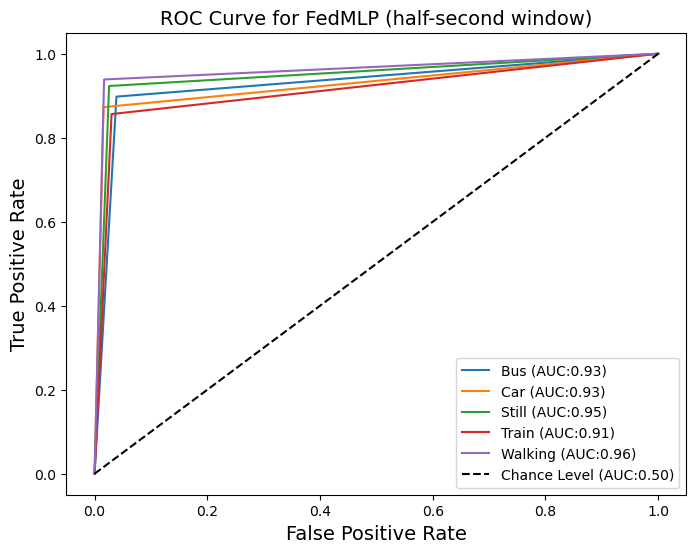

313/313 [==============================] - 2s 5ms/step - loss: 0.3525 - sparse_categorical_accuracy: 0.8754
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 134 | global_acc: 89.886% | global_loss: 1.0486598014831543
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.90      0.92      0.91      2498
           3       0.87      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9366746057047626


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


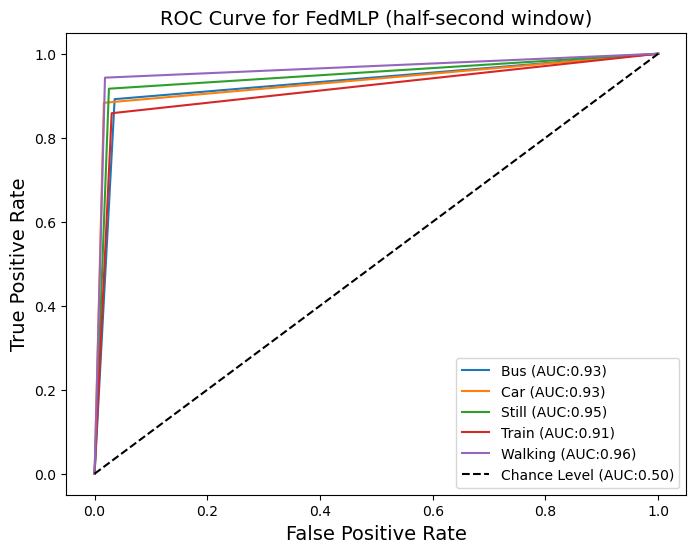

313/313 [==============================] - 1s 4ms/step - loss: 0.3708 - sparse_categorical_accuracy: 0.8676
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 135 | global_acc: 89.990% | global_loss: 1.0483052730560303
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.90      0.92      0.91      2498
           3       0.88      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9373332458067709


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


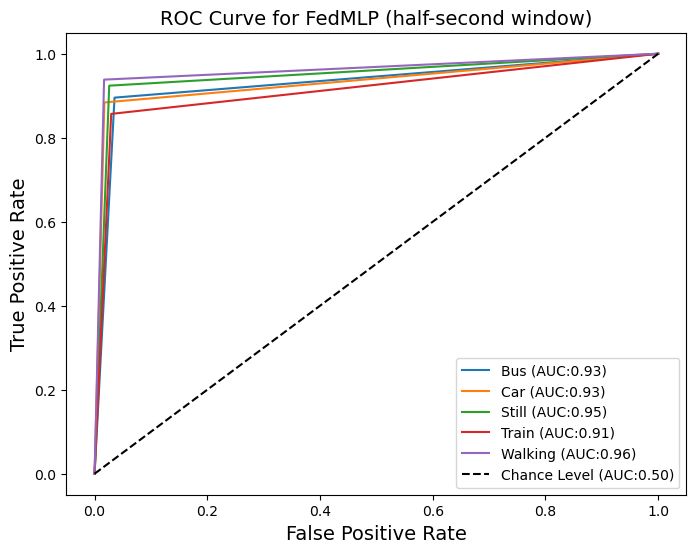

313/313 [==============================] - 1s 4ms/step - loss: 0.3619 - sparse_categorical_accuracy: 0.8723
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 136 | global_acc: 90.006% | global_loss: 1.0477577447891235
              precision    recall  f1-score   support

           0       0.85      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.89      0.93      0.91      2498
           3       0.89      0.84      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9374116961211987


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


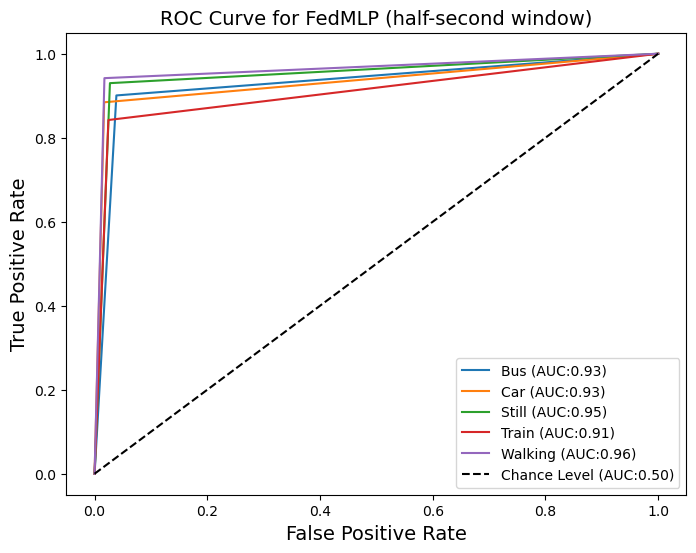

313/313 [==============================] - 2s 4ms/step - loss: 0.3792 - sparse_categorical_accuracy: 0.8685
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 137 | global_acc: 90.022% | global_loss: 1.0481352806091309
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.93      0.91      2498
           3       0.87      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9375266507252211


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


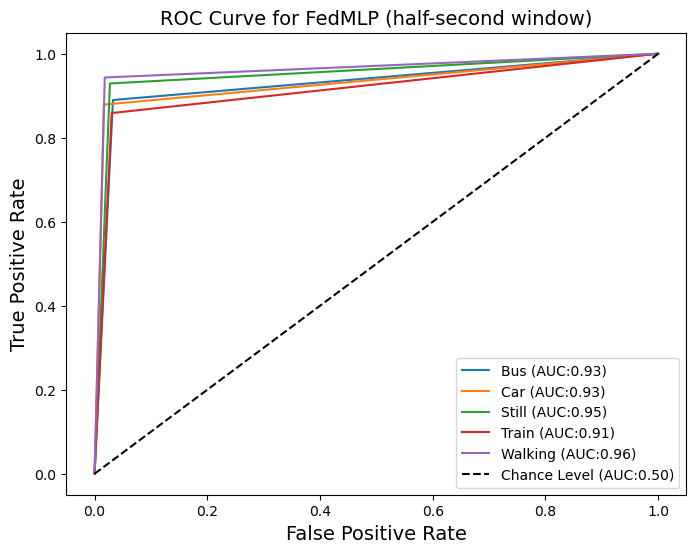

313/313 [==============================] - 1s 4ms/step - loss: 0.3800 - sparse_categorical_accuracy: 0.8653
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 138 | global_acc: 90.014% | global_loss: 1.0484830141067505
              precision    recall  f1-score   support

           0       0.85      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.91      0.92      0.91      2498
           3       0.88      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9374738551252235


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


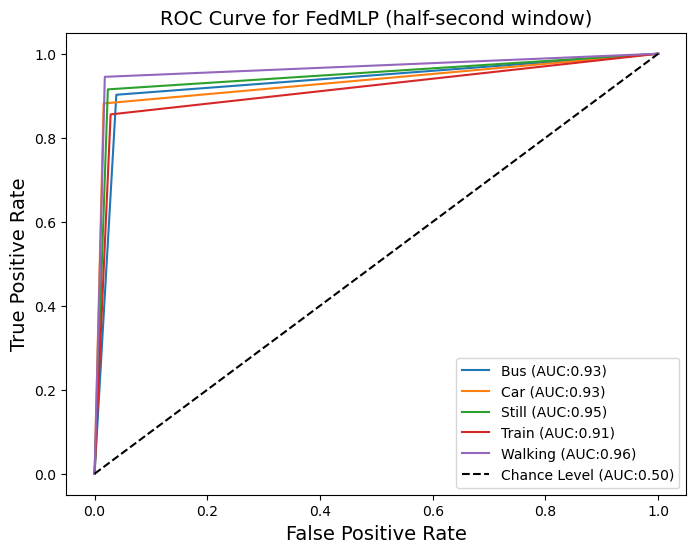

313/313 [==============================] - 1s 4ms/step - loss: 0.3780 - sparse_categorical_accuracy: 0.8665
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 139 | global_acc: 90.077% | global_loss: 1.047743558883667
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.91      0.92      0.91      2498
           3       0.87      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.937884349288211


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


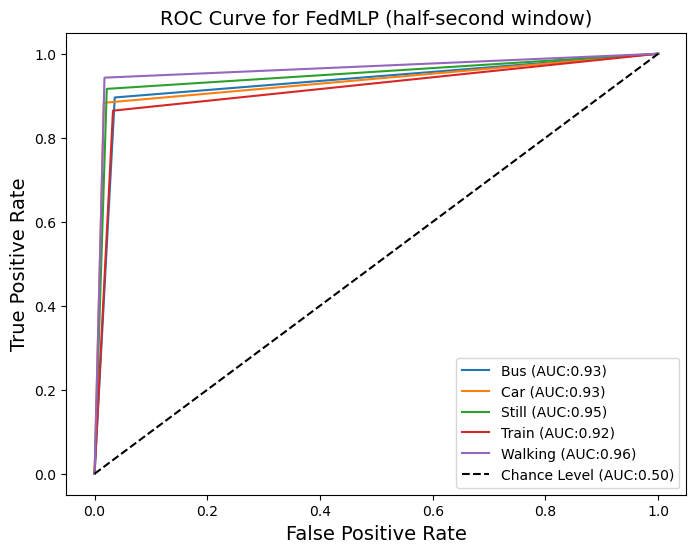

313/313 [==============================] - 1s 4ms/step - loss: 0.3537 - sparse_categorical_accuracy: 0.8757
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 140 | global_acc: 90.373% | global_loss: 1.0468710660934448
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.90      0.95      0.92      2498
           3       0.89      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9397217237931439


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


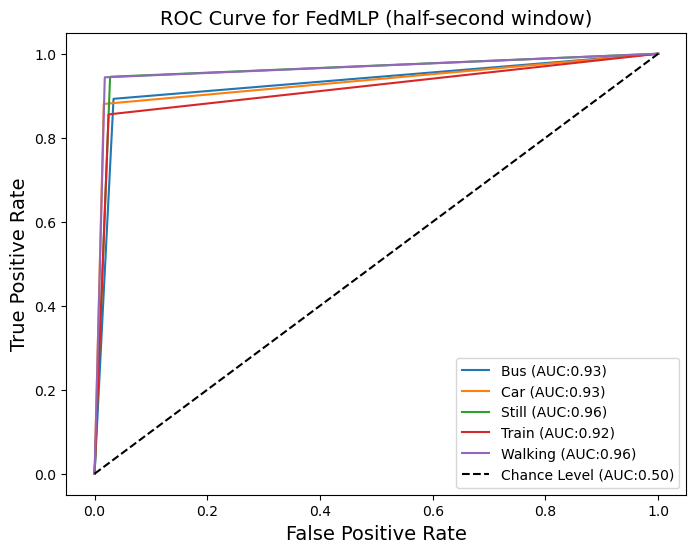

313/313 [==============================] - 1s 4ms/step - loss: 0.3655 - sparse_categorical_accuracy: 0.8710
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 141 | global_acc: 89.958% | global_loss: 1.0470203161239624
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.90      0.92      0.91      2498
           3       0.87      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9371319754134187


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


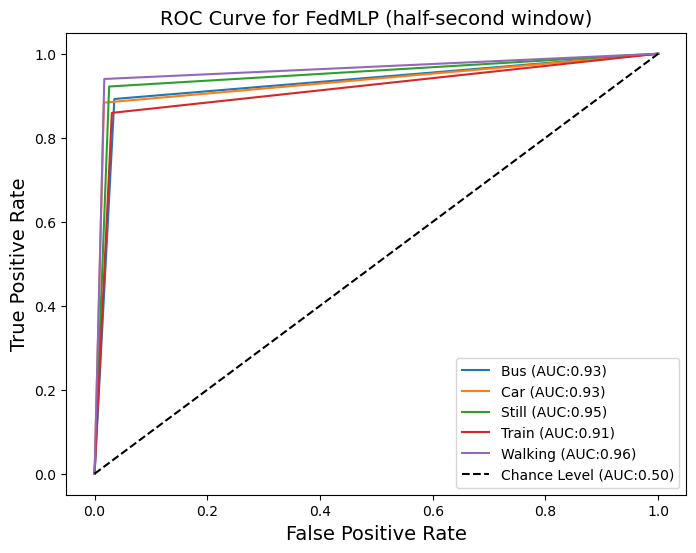

313/313 [==============================] - 1s 4ms/step - loss: 0.3735 - sparse_categorical_accuracy: 0.8689
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 142 | global_acc: 90.085% | global_loss: 1.0479602813720703
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.91      0.92      2498
           3       0.87      0.86      0.86      2471
           4       0.93      0.95      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9379213073492181


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


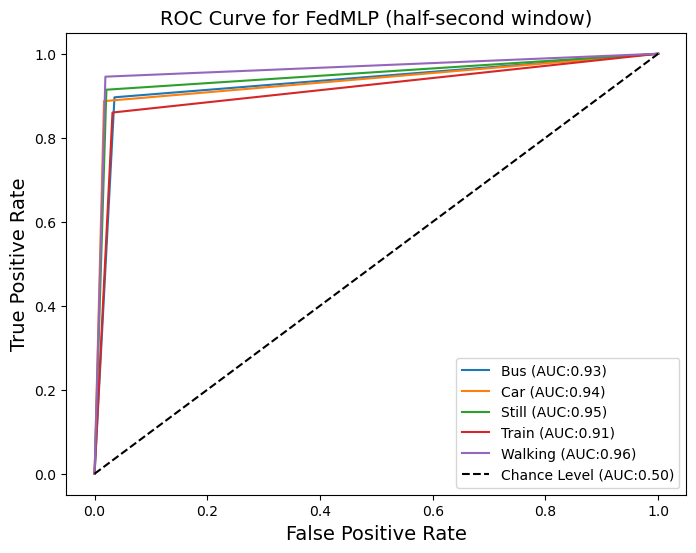

313/313 [==============================] - 2s 4ms/step - loss: 0.3754 - sparse_categorical_accuracy: 0.8661
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 143 | global_acc: 89.950% | global_loss: 1.046323537826538
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.92      0.91      2498
           3       0.87      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9370913770422324


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


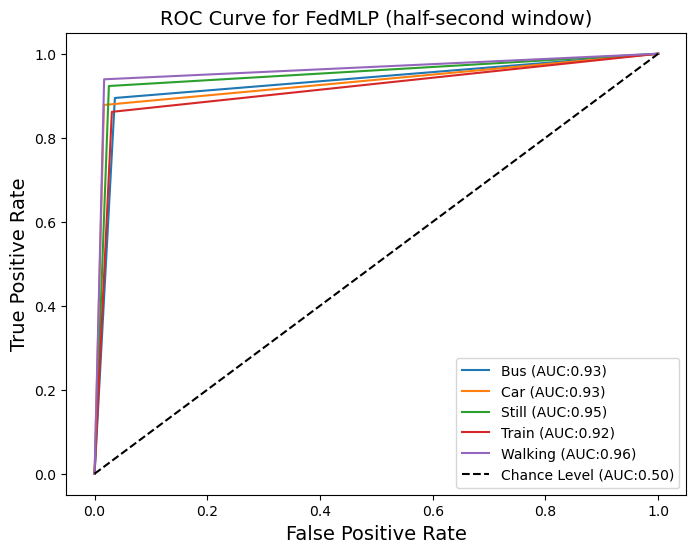

313/313 [==============================] - 1s 4ms/step - loss: 0.3769 - sparse_categorical_accuracy: 0.8665
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 144 | global_acc: 90.030% | global_loss: 1.0462183952331543
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.89      0.93      0.91      2498
           3       0.89      0.85      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9375805474056508


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


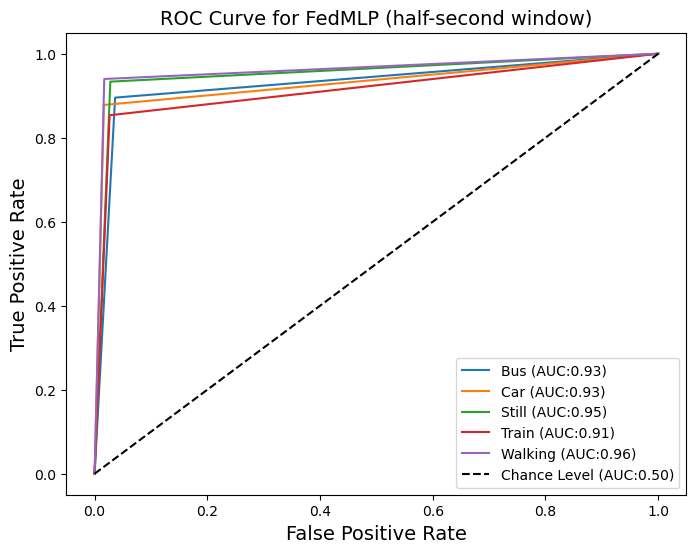

313/313 [==============================] - 1s 4ms/step - loss: 0.3688 - sparse_categorical_accuracy: 0.8699
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 145 | global_acc: 90.149% | global_loss: 1.0461677312850952
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.93      0.91      2498
           3       0.87      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9383411868318096


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


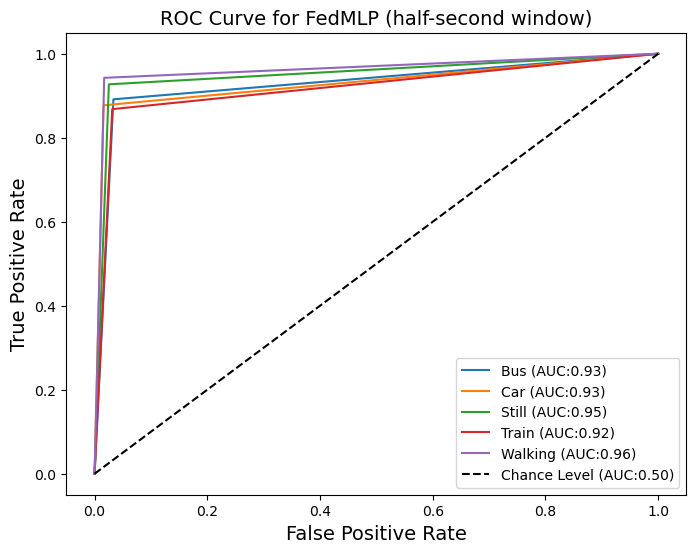

313/313 [==============================] - 1s 4ms/step - loss: 0.3667 - sparse_categorical_accuracy: 0.8746
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 146 | global_acc: 89.974% | global_loss: 1.0463876724243164
              precision    recall  f1-score   support

           0       0.87      0.88      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.93      0.91      2498
           3       0.86      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9372373963336574


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


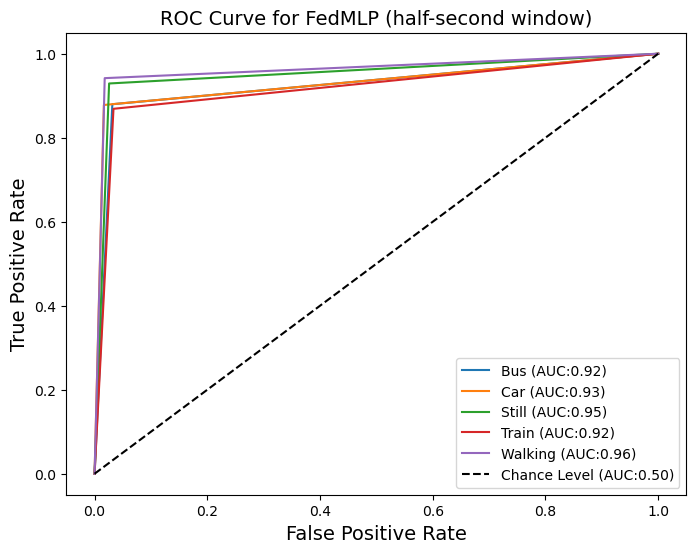

313/313 [==============================] - 1s 4ms/step - loss: 0.3587 - sparse_categorical_accuracy: 0.8753
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 147 | global_acc: 90.046% | global_loss: 1.0466614961624146
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.91      0.91      2498
           3       0.86      0.87      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9376848139804037


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


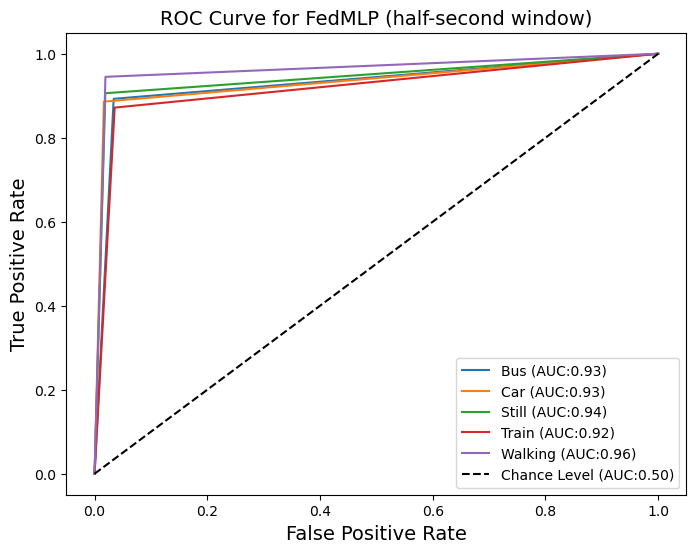

313/313 [==============================] - 1s 4ms/step - loss: 0.3695 - sparse_categorical_accuracy: 0.8733
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 148 | global_acc: 89.990% | global_loss: 1.046140193939209
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.87      0.90      2516
           2       0.91      0.92      0.91      2498
           3       0.87      0.87      0.87      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9373410647828914


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


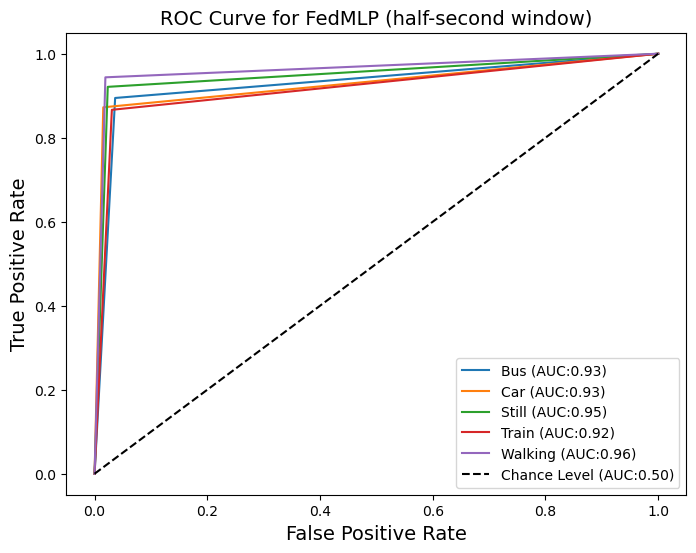

313/313 [==============================] - 1s 4ms/step - loss: 0.3723 - sparse_categorical_accuracy: 0.8721
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 149 | global_acc: 90.141% | global_loss: 1.0469738245010376
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.90      0.92      0.91      2498
           3       0.88      0.85      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9382690299604176


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


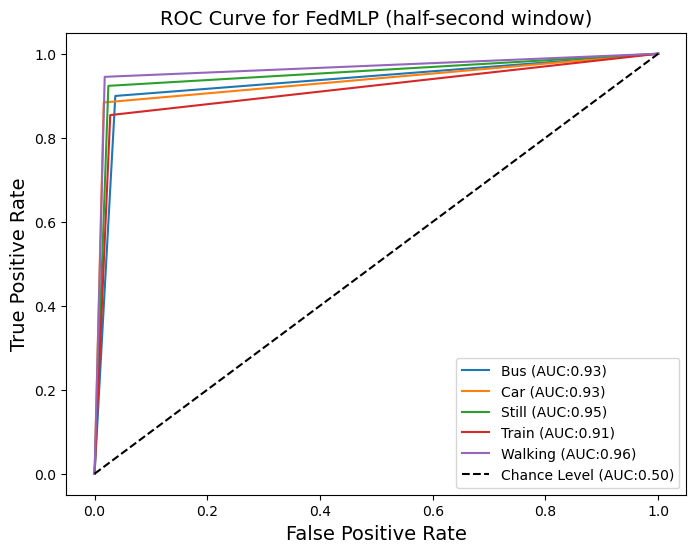

313/313 [==============================] - 1s 4ms/step - loss: 0.3510 - sparse_categorical_accuracy: 0.8765
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 150 | global_acc: 90.109% | global_loss: 1.045964241027832
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.93      0.91      2498
           3       0.88      0.86      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9380828056466454


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


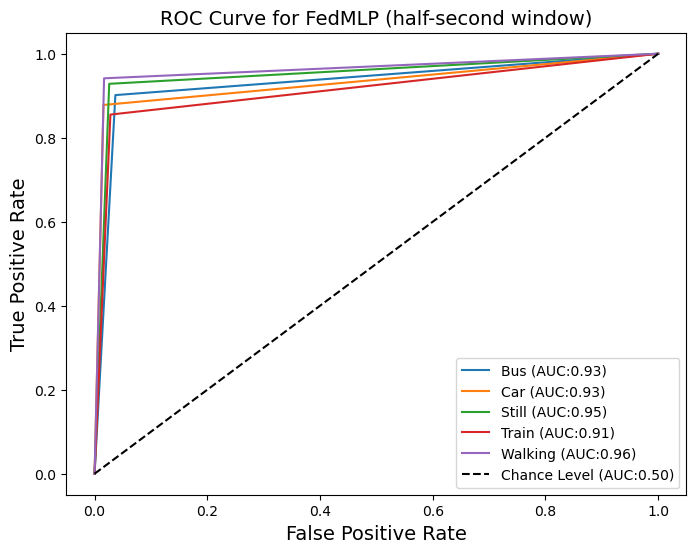

313/313 [==============================] - 2s 4ms/step - loss: 0.3626 - sparse_categorical_accuracy: 0.8789
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 151 | global_acc: 90.101% | global_loss: 1.0461657047271729
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.92      0.92      0.92      2498
           3       0.87      0.87      0.87      2471
           4       0.93      0.95      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9380287742275476


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


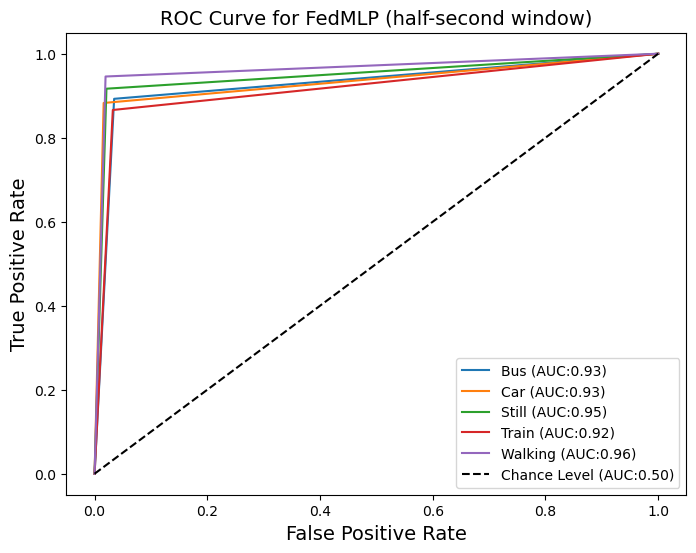

313/313 [==============================] - 1s 4ms/step - loss: 0.3689 - sparse_categorical_accuracy: 0.8712
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 152 | global_acc: 90.014% | global_loss: 1.0456867218017578
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.90      2516
           2       0.90      0.92      0.91      2498
           3       0.89      0.85      0.87      2471
           4       0.93      0.95      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9374700698002538


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


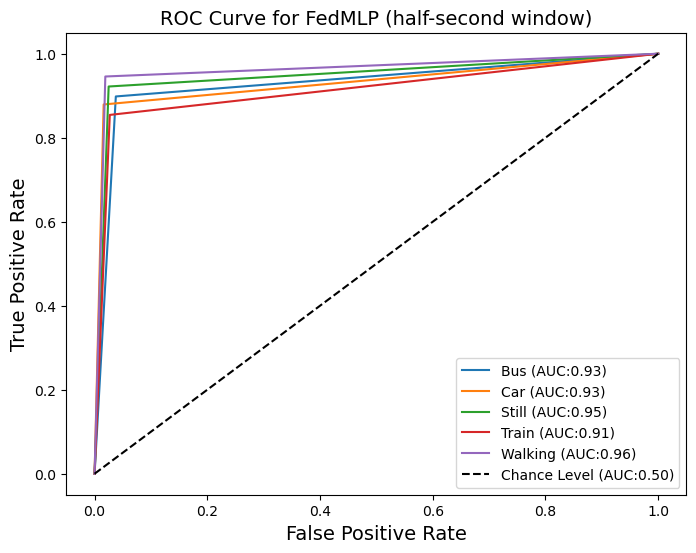

313/313 [==============================] - 1s 4ms/step - loss: 0.3535 - sparse_categorical_accuracy: 0.8749
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 153 | global_acc: 90.181% | global_loss: 1.0450407266616821
              precision    recall  f1-score   support

           0       0.86      0.89      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.91      0.92      0.91      2498
           3       0.88      0.87      0.87      2471
           4       0.93      0.94      0.93      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9385337616609404


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


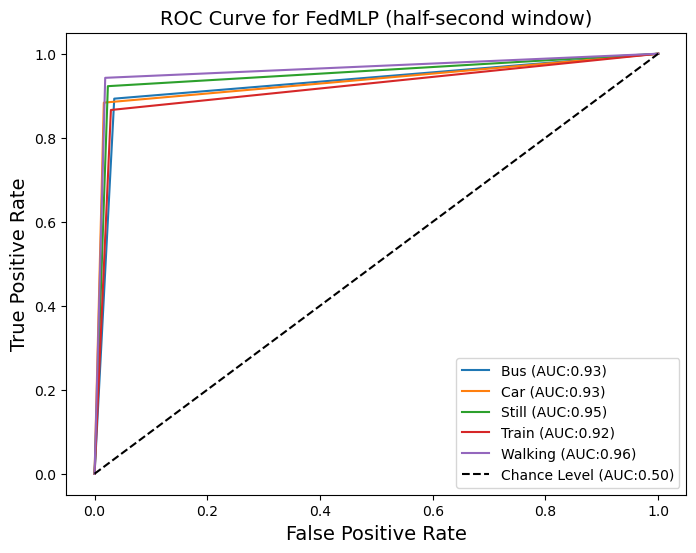

313/313 [==============================] - 2s 4ms/step - loss: 0.3590 - sparse_categorical_accuracy: 0.8741
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 154 | global_acc: 90.141% | global_loss: 1.0446820259094238
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.94      0.88      0.91      2516
           2       0.90      0.93      0.91      2498
           3       0.87      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9382900190724431


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


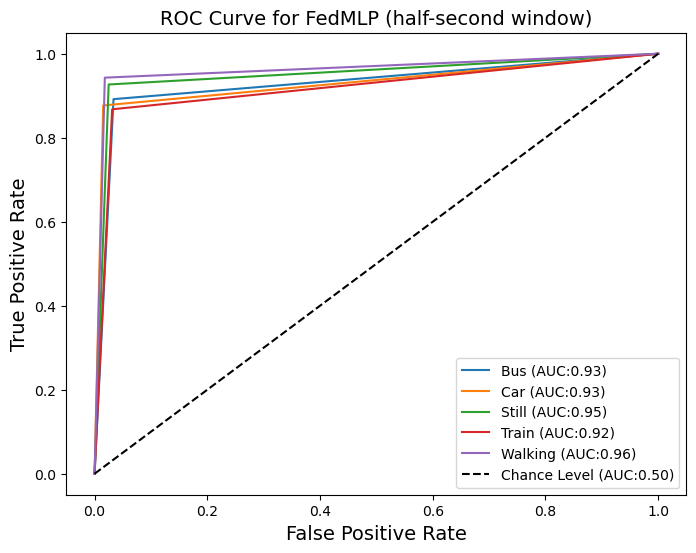

313/313 [==============================] - 1s 4ms/step - loss: 0.3579 - sparse_categorical_accuracy: 0.8791
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 155 | global_acc: 90.381% | global_loss: 1.044935941696167
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.92      0.92      2498
           3       0.87      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9397859192905165


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


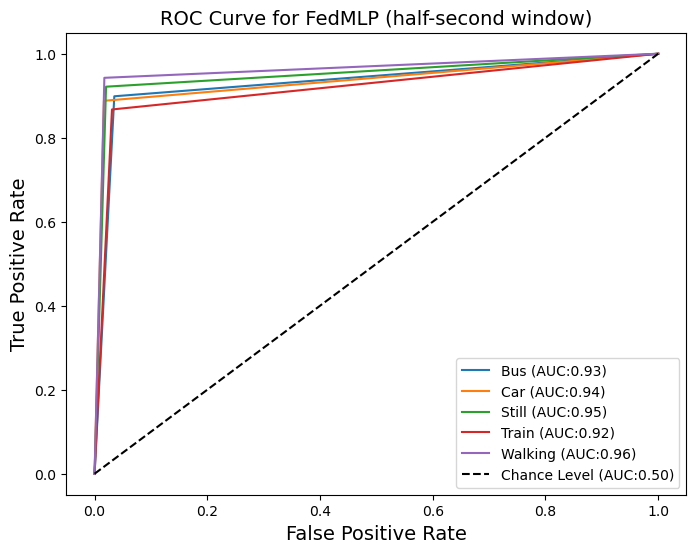

313/313 [==============================] - 2s 4ms/step - loss: 0.3492 - sparse_categorical_accuracy: 0.8800
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 156 | global_acc: 90.365% | global_loss: 1.0440213680267334
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.92      0.92      2498
           3       0.88      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9396813897213656


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


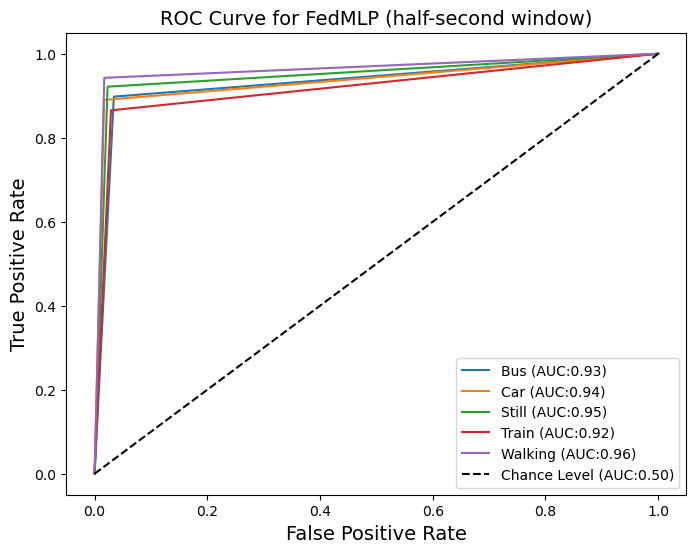

313/313 [==============================] - 1s 4ms/step - loss: 0.3686 - sparse_categorical_accuracy: 0.8735
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 157 | global_acc: 90.277% | global_loss: 1.044579029083252
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.91      0.92      2498
           3       0.86      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9391448592548277


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


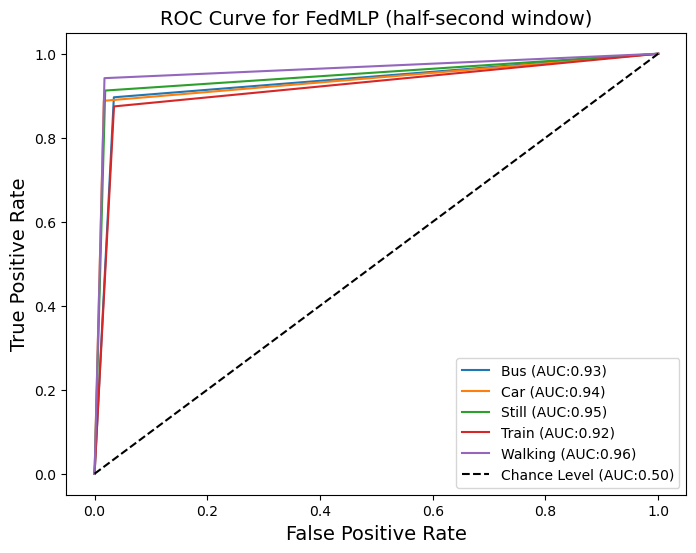

313/313 [==============================] - 1s 4ms/step - loss: 0.3561 - sparse_categorical_accuracy: 0.8795
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 158 | global_acc: 90.573% | global_loss: 1.0452306270599365
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.90      0.94      0.92      2498
           3       0.91      0.85      0.88      2471
           4       0.92      0.95      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9409500388339517


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


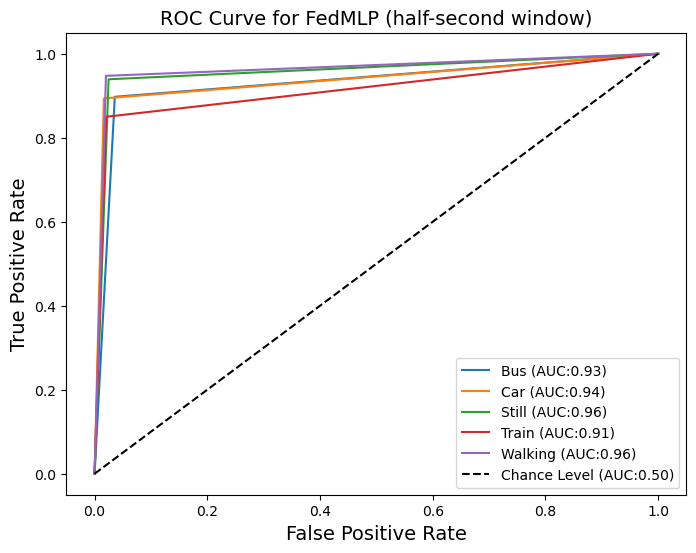

313/313 [==============================] - 1s 4ms/step - loss: 0.3700 - sparse_categorical_accuracy: 0.8737
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 159 | global_acc: 90.165% | global_loss: 1.0428128242492676
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.92      0.91      2498
           3       0.88      0.87      0.87      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9384445863904641


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


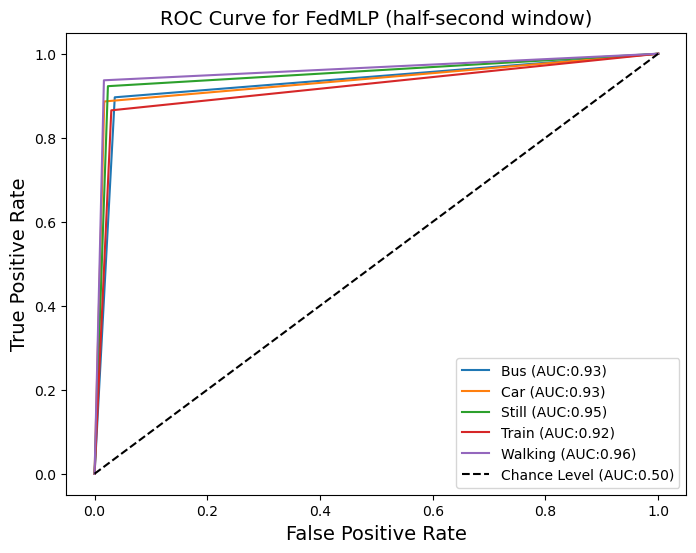

313/313 [==============================] - 2s 4ms/step - loss: 0.3371 - sparse_categorical_accuracy: 0.8782
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 160 | global_acc: 90.070% | global_loss: 1.0435891151428223
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.92      0.91      0.92      2498
           3       0.85      0.88      0.86      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9378457700566282


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


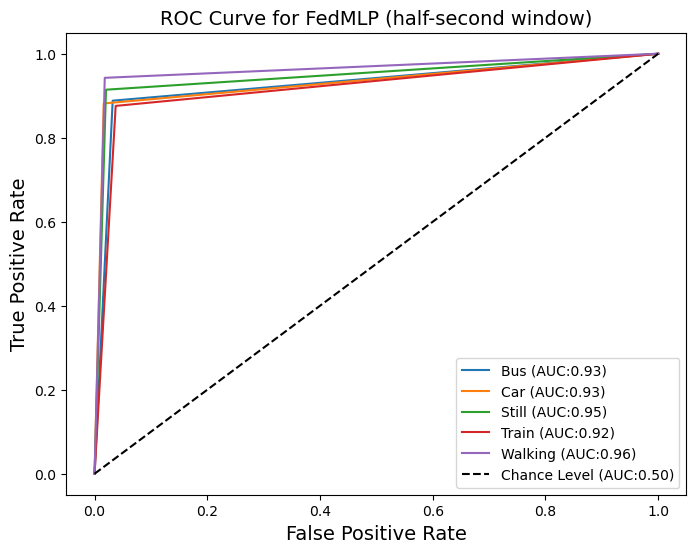

313/313 [==============================] - 1s 4ms/step - loss: 0.3431 - sparse_categorical_accuracy: 0.8829
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 161 | global_acc: 90.317% | global_loss: 1.0442651510238647
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.92      0.92      0.92      2498
           3       0.87      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9394006678035037


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


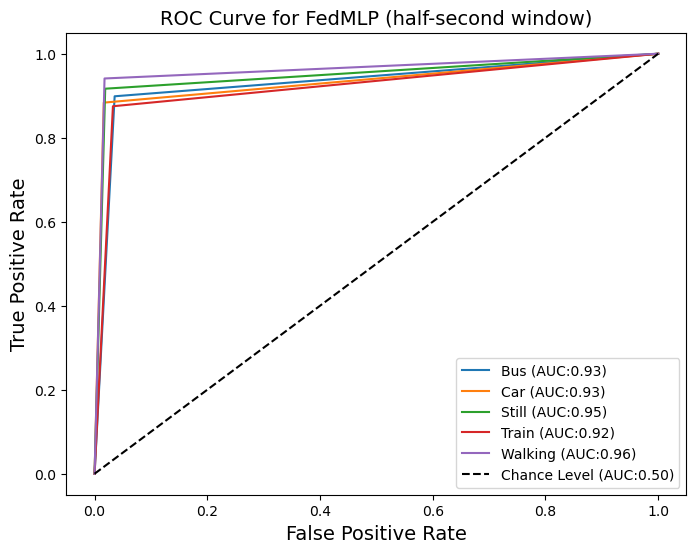

313/313 [==============================] - 1s 4ms/step - loss: 0.3472 - sparse_categorical_accuracy: 0.8790
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 162 | global_acc: 90.349% | global_loss: 1.0429264307022095
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.91      0.92      0.92      2498
           3       0.87      0.88      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9395970440052237


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


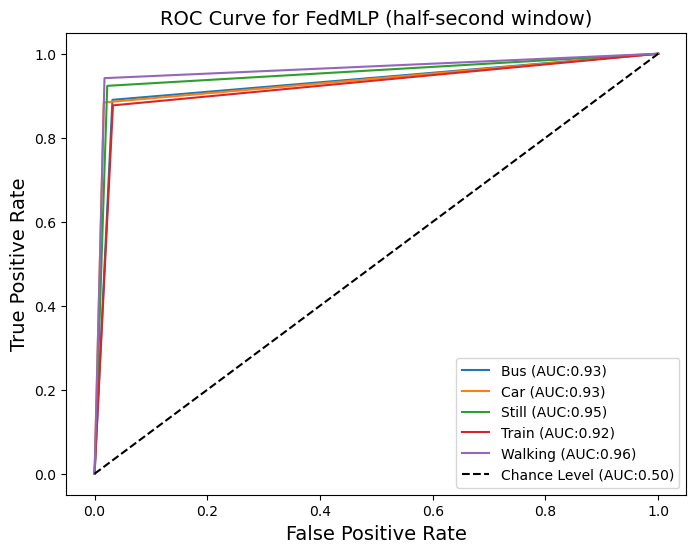

313/313 [==============================] - 1s 4ms/step - loss: 0.3653 - sparse_categorical_accuracy: 0.8726
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 163 | global_acc: 90.605% | global_loss: 1.0427323579788208
              precision    recall  f1-score   support

           0       0.88      0.89      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.90      0.94      0.92      2498
           3       0.89      0.86      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9411726464045552


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


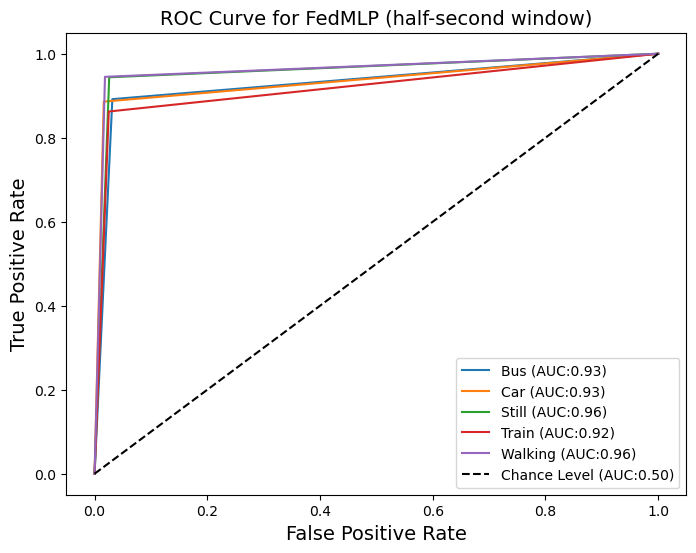

313/313 [==============================] - 1s 4ms/step - loss: 0.3493 - sparse_categorical_accuracy: 0.8765
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 164 | global_acc: 90.365% | global_loss: 1.0426537990570068
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.91      0.93      0.92      2498
           3       0.88      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9396891725025828


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


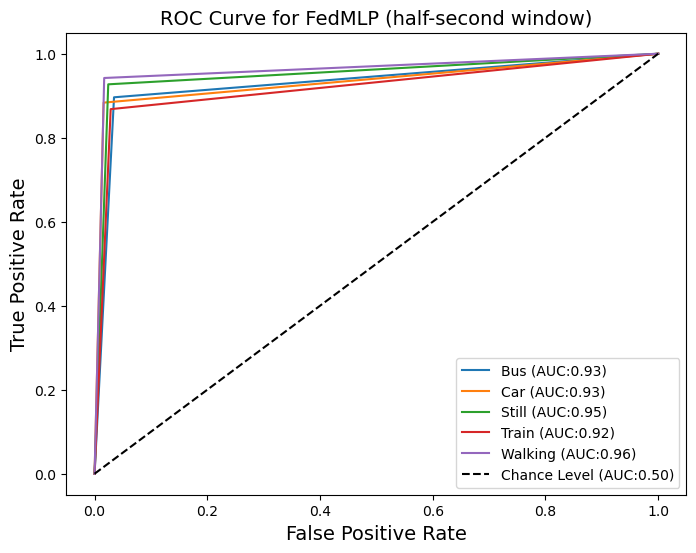

313/313 [==============================] - 1s 4ms/step - loss: 0.3514 - sparse_categorical_accuracy: 0.8829
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 165 | global_acc: 90.309% | global_loss: 1.0441991090774536
              precision    recall  f1-score   support

           0       0.85      0.91      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.92      0.92      2498
           3       0.88      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9393463551426386


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


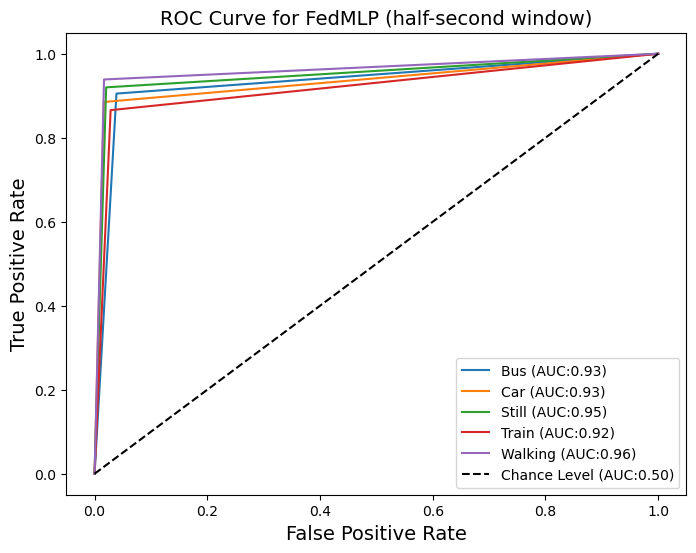

313/313 [==============================] - 1s 4ms/step - loss: 0.3541 - sparse_categorical_accuracy: 0.8795
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 166 | global_acc: 90.461% | global_loss: 1.0433355569839478
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.92      0.92      2498
           3       0.89      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.91      0.90      0.90     12517

0.9402897132089605


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


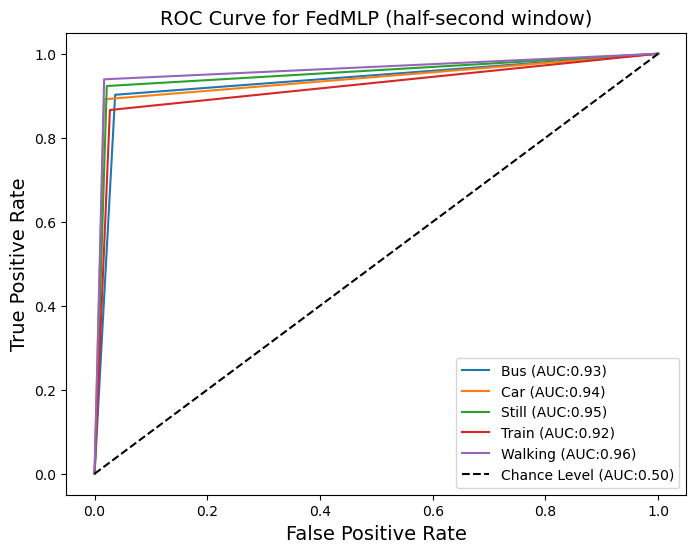

313/313 [==============================] - 1s 4ms/step - loss: 0.3662 - sparse_categorical_accuracy: 0.8743
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 167 | global_acc: 90.309% | global_loss: 1.0426751375198364
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.91      0.92      2498
           3       0.87      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.90     12517
   macro avg       0.90      0.90      0.90     12517
weighted avg       0.90      0.90      0.90     12517

0.9393395389753806


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


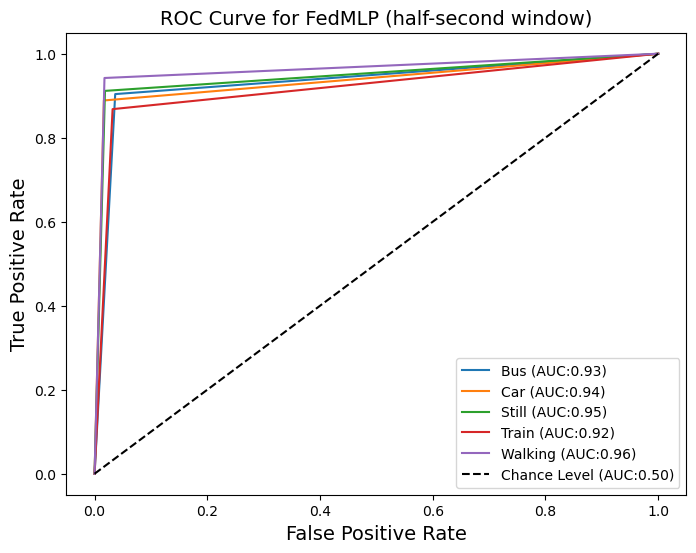

313/313 [==============================] - 1s 4ms/step - loss: 0.3567 - sparse_categorical_accuracy: 0.8762
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 168 | global_acc: 90.741% | global_loss: 1.0424355268478394
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.91      0.94      0.93      2498
           3       0.90      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9420368945846759


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


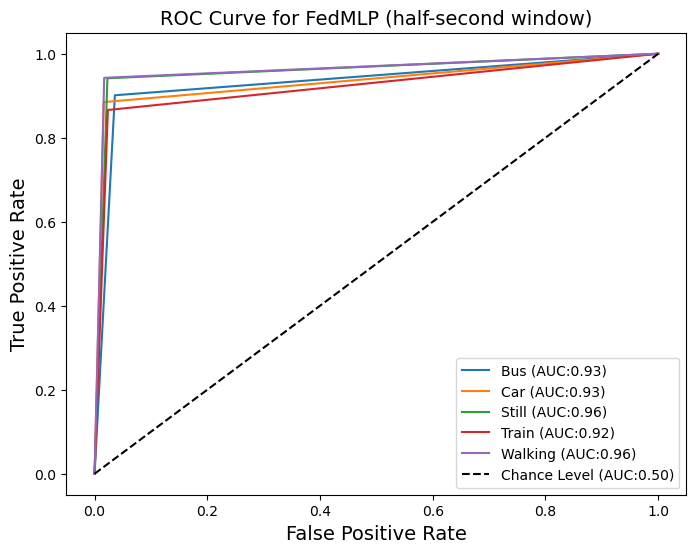

313/313 [==============================] - 1s 4ms/step - loss: 0.3655 - sparse_categorical_accuracy: 0.8731
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 169 | global_acc: 90.725% | global_loss: 1.042168378829956
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.90      0.95      0.92      2498
           3       0.90      0.86      0.88      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.941938164496721


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


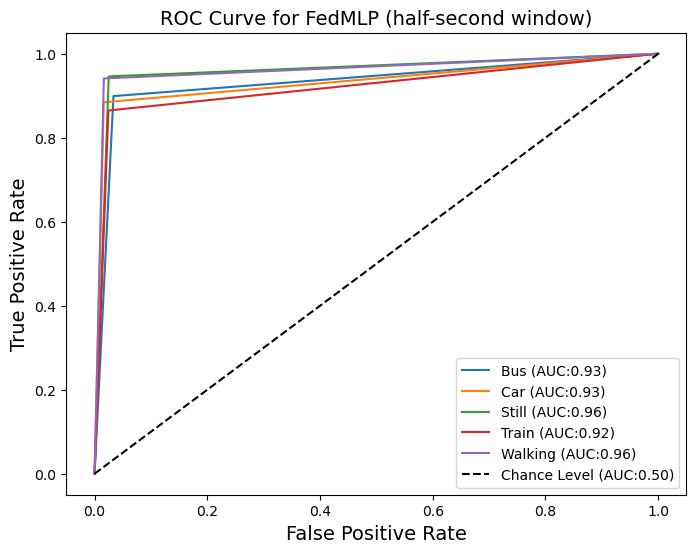

313/313 [==============================] - 1s 4ms/step - loss: 0.3364 - sparse_categorical_accuracy: 0.8813
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 170 | global_acc: 90.517% | global_loss: 1.0420230627059937
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.90      0.93      0.92      2498
           3       0.89      0.87      0.88      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.90      0.90     12517
weighted avg       0.91      0.91      0.91     12517

0.9406453466637894


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


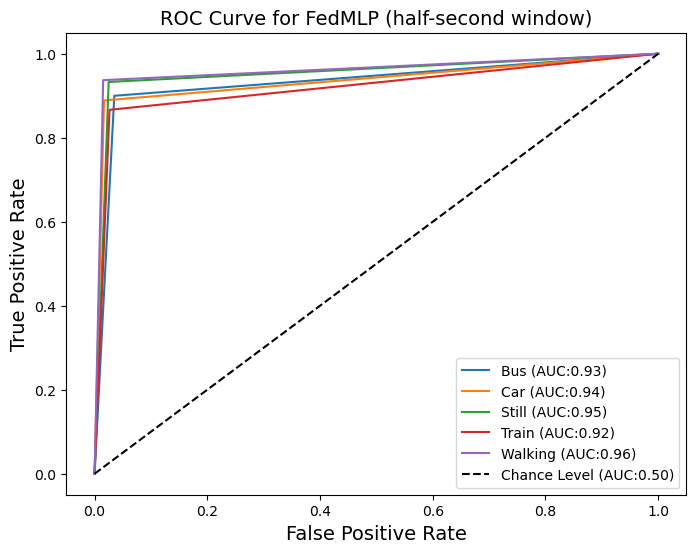

313/313 [==============================] - 2s 4ms/step - loss: 0.3457 - sparse_categorical_accuracy: 0.8817
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 171 | global_acc: 90.749% | global_loss: 1.0423520803451538
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.93      0.92      2498
           3       0.90      0.86      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9420759073415127


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


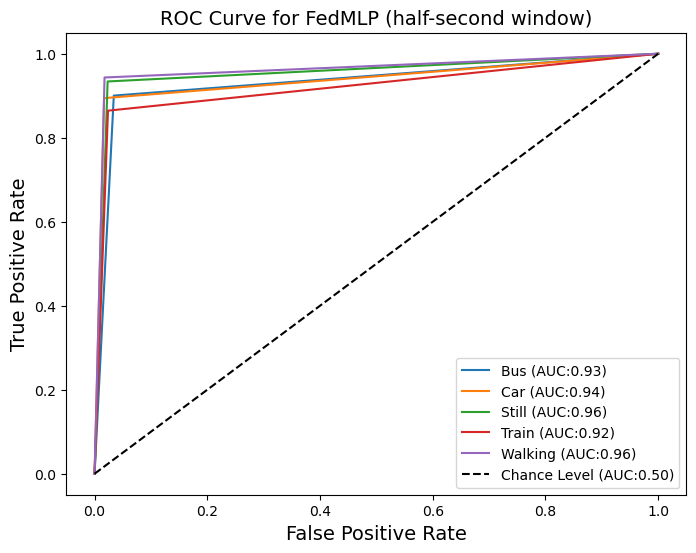

313/313 [==============================] - 1s 4ms/step - loss: 0.3398 - sparse_categorical_accuracy: 0.8779
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 172 | global_acc: 90.549% | global_loss: 1.0423203706741333
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.92      0.92      2498
           3       0.88      0.87      0.87      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9408323546173785


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


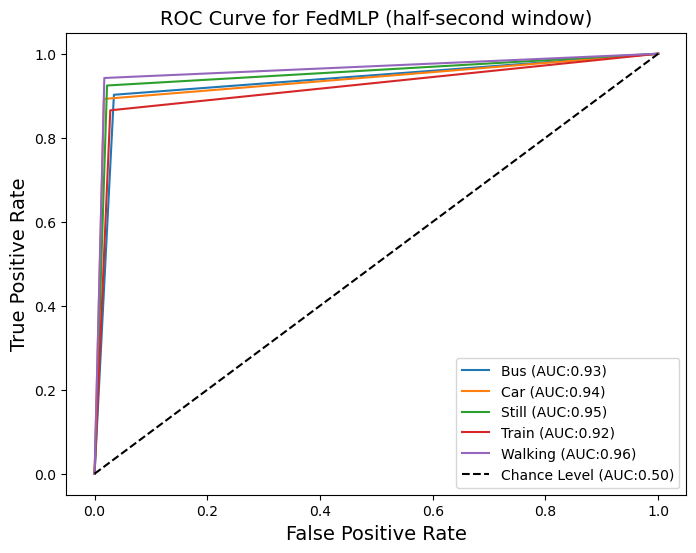

313/313 [==============================] - 1s 4ms/step - loss: 0.3431 - sparse_categorical_accuracy: 0.8768
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 173 | global_acc: 90.501% | global_loss: 1.0407371520996094
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.90      0.94      0.92      2498
           3       0.88      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.90      0.90     12517
weighted avg       0.91      0.91      0.90     12517

0.9405392594949824


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


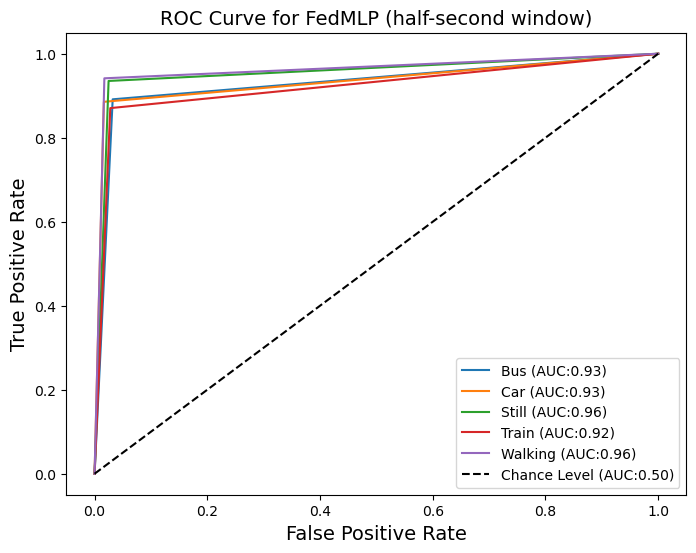

313/313 [==============================] - 1s 4ms/step - loss: 0.3603 - sparse_categorical_accuracy: 0.8736
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 174 | global_acc: 90.573% | global_loss: 1.0411388874053955
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.93      0.92      2498
           3       0.88      0.87      0.88      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9409994852168845


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


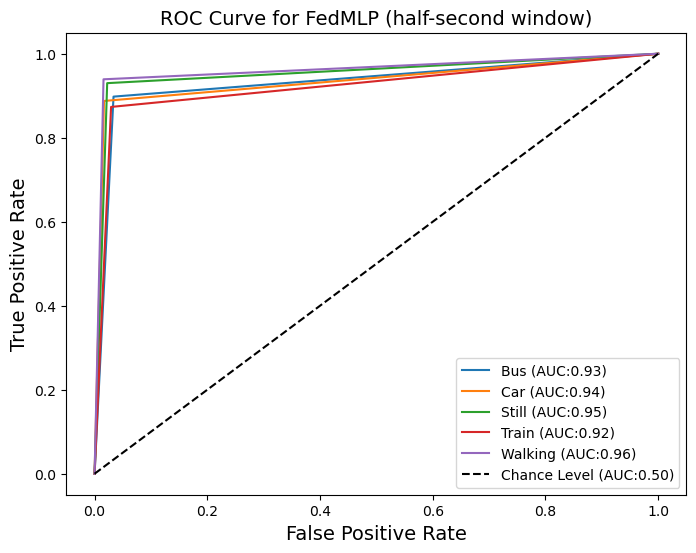

313/313 [==============================] - 1s 4ms/step - loss: 0.3510 - sparse_categorical_accuracy: 0.8784
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 175 | global_acc: 90.884% | global_loss: 1.0413793325424194
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.90      0.95      0.93      2498
           3       0.91      0.86      0.88      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9429276039649098


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


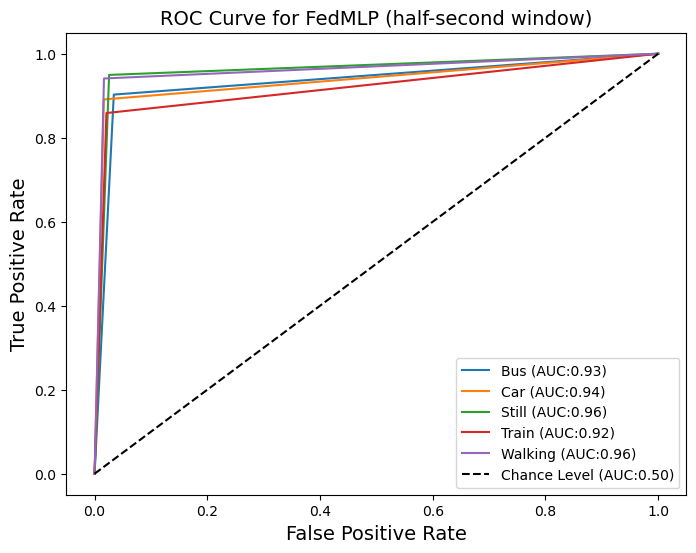

313/313 [==============================] - 2s 4ms/step - loss: 0.3675 - sparse_categorical_accuracy: 0.8747
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 176 | global_acc: 90.541% | global_loss: 1.0412030220031738
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.93      0.92      2498
           3       0.88      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9407872254204168


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


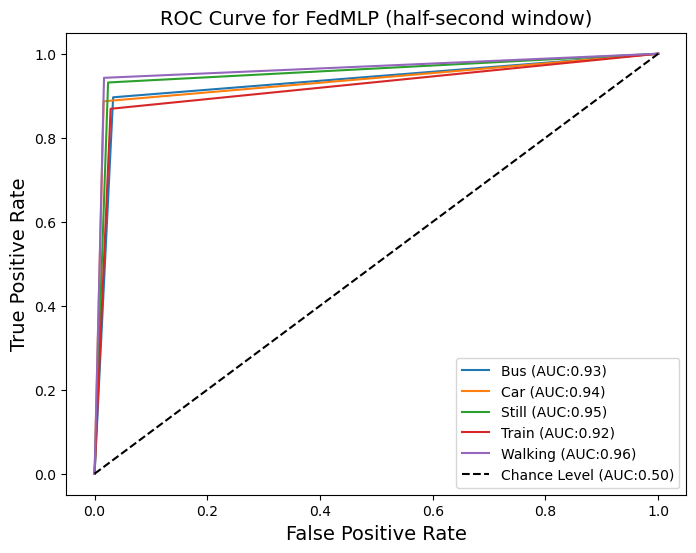

313/313 [==============================] - 1s 4ms/step - loss: 0.3415 - sparse_categorical_accuracy: 0.8786
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 177 | global_acc: 90.709% | global_loss: 1.041205644607544
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.93      0.92      2498
           3       0.88      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9418420016276787


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


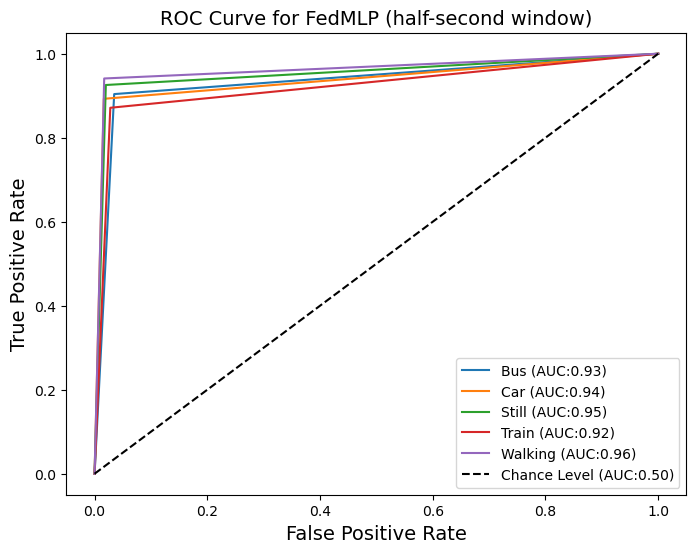

313/313 [==============================] - 1s 4ms/step - loss: 0.3442 - sparse_categorical_accuracy: 0.8813
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 178 | global_acc: 90.709% | global_loss: 1.0411863327026367
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      2487
           1       0.93      0.89      0.91      2516
           2       0.93      0.92      0.92      2498
           3       0.87      0.88      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9418473022058432


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


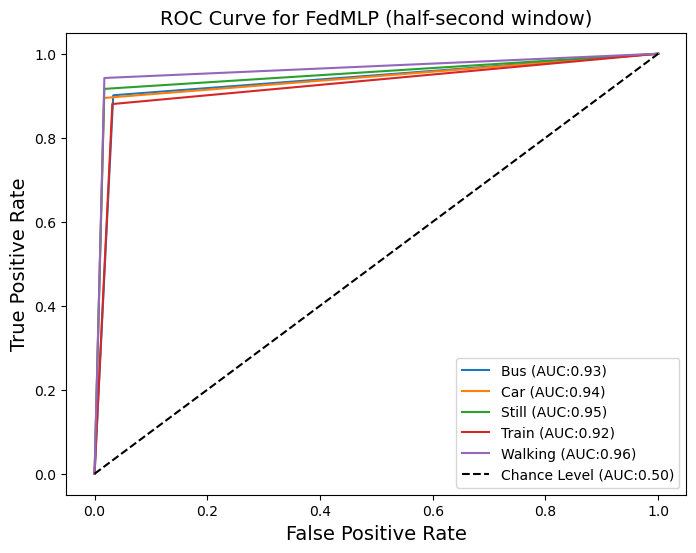

313/313 [==============================] - 1s 4ms/step - loss: 0.3613 - sparse_categorical_accuracy: 0.8748
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 179 | global_acc: 90.557% | global_loss: 1.040850281715393
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.92      0.92      2498
           3       0.89      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9408914283727441


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


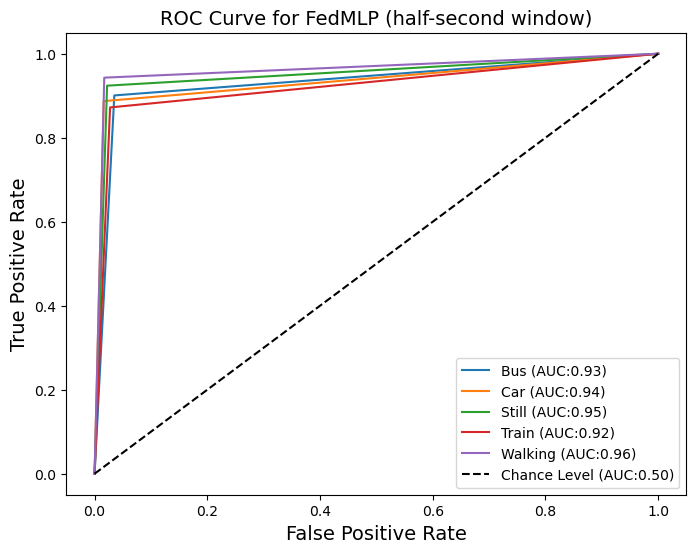

313/313 [==============================] - 1s 4ms/step - loss: 0.3576 - sparse_categorical_accuracy: 0.8799
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 180 | global_acc: 90.685% | global_loss: 1.040993094444275
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      2487
           1       0.93      0.89      0.91      2516
           2       0.93      0.92      0.92      2498
           3       0.87      0.88      0.87      2471
           4       0.93      0.95      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9416900244071161


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


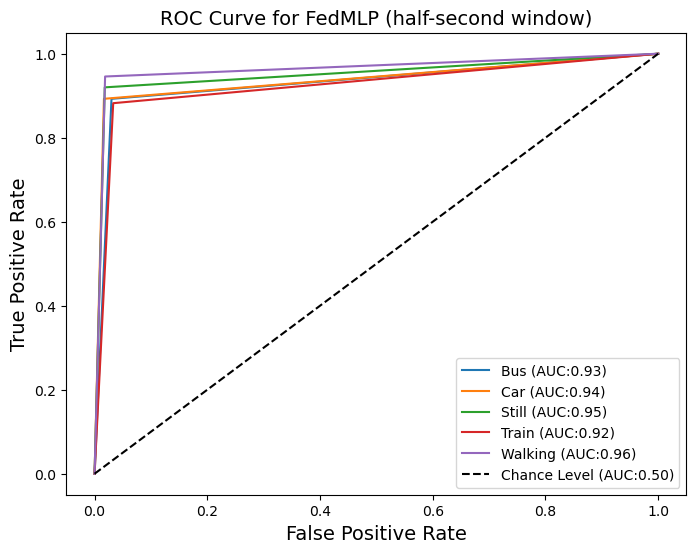

313/313 [==============================] - 1s 4ms/step - loss: 0.3619 - sparse_categorical_accuracy: 0.8748
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 181 | global_acc: 90.773% | global_loss: 1.0408049821853638
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.93      0.92      2498
           3       0.89      0.88      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9422414253178122


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


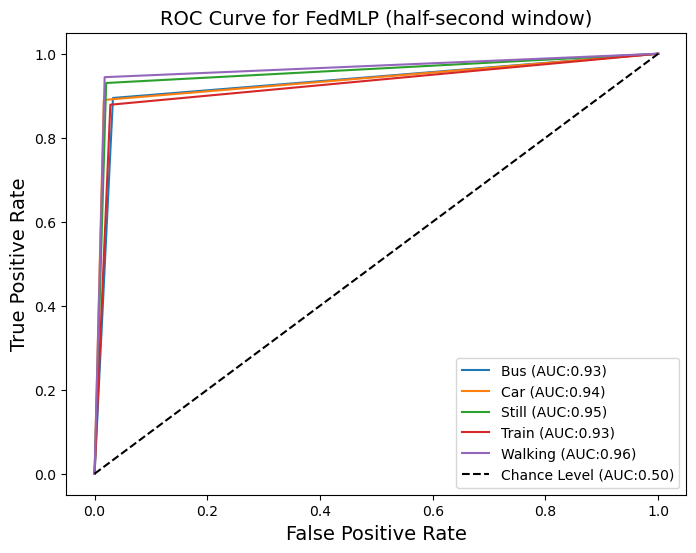

313/313 [==============================] - 1s 4ms/step - loss: 0.3573 - sparse_categorical_accuracy: 0.8729
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 182 | global_acc: 90.884% | global_loss: 1.0404376983642578
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.88      0.91      2516
           2       0.91      0.95      0.93      2498
           3       0.90      0.87      0.89      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9429416842704617


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


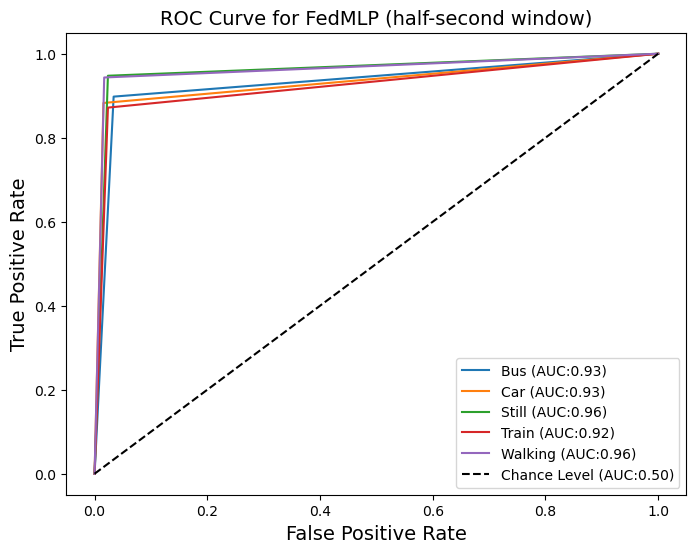

313/313 [==============================] - 2s 4ms/step - loss: 0.3384 - sparse_categorical_accuracy: 0.8804
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 183 | global_acc: 90.805% | global_loss: 1.0398955345153809
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.94      0.92      2498
           3       0.90      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9424351209444778


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


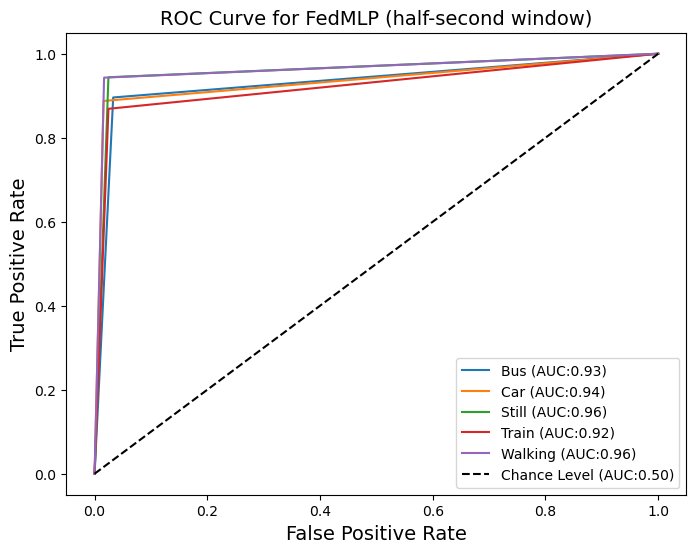

313/313 [==============================] - 1s 4ms/step - loss: 0.3315 - sparse_categorical_accuracy: 0.8818
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 184 | global_acc: 90.565% | global_loss: 1.0403248071670532
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.92      0.92      2498
           3       0.88      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9409394517639882


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


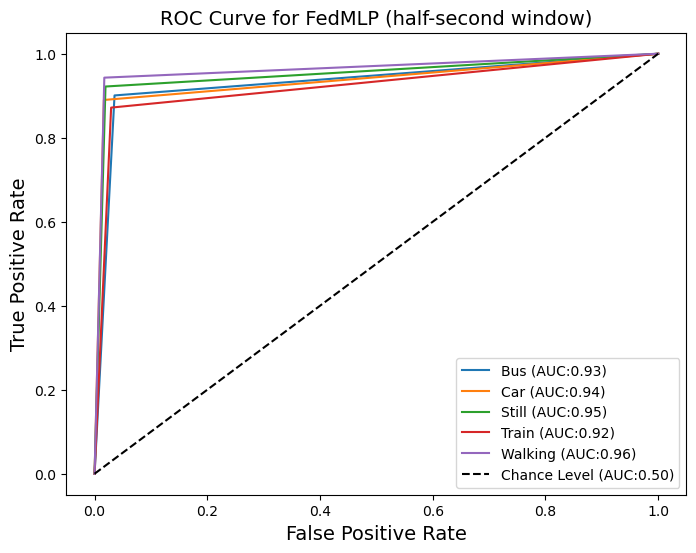

313/313 [==============================] - 1s 4ms/step - loss: 0.3437 - sparse_categorical_accuracy: 0.8804
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 185 | global_acc: 90.717% | global_loss: 1.0394600629806519
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.93      0.92      2498
           3       0.89      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.941887815008607


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


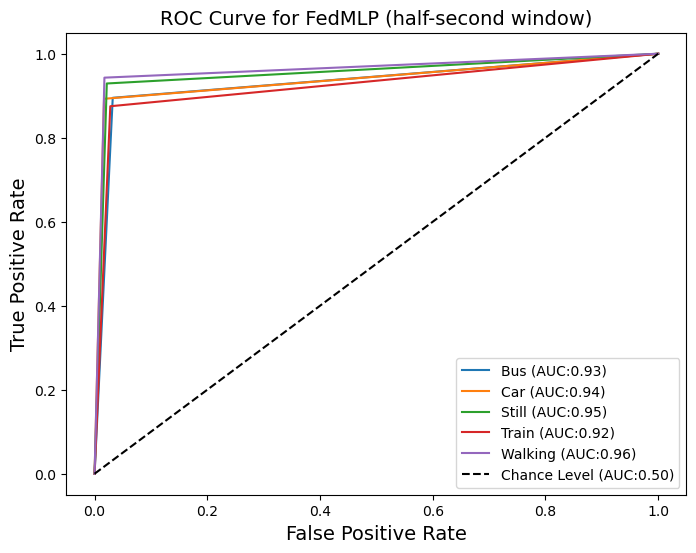

313/313 [==============================] - 1s 4ms/step - loss: 0.3608 - sparse_categorical_accuracy: 0.8727
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 186 | global_acc: 90.828% | global_loss: 1.039389729499817
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.90      0.91      2516
           2       0.91      0.94      0.92      2498
           3       0.90      0.87      0.88      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9425836309365824


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


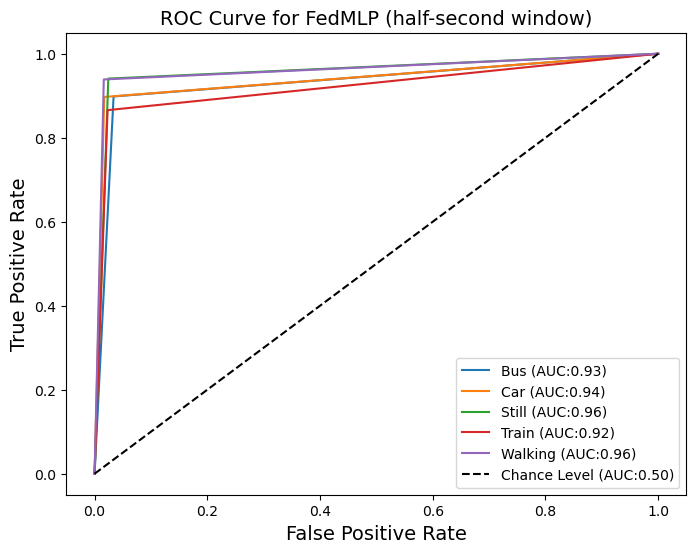

313/313 [==============================] - 1s 4ms/step - loss: 0.3408 - sparse_categorical_accuracy: 0.8834
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 187 | global_acc: 90.525% | global_loss: 1.03996741771698
              precision    recall  f1-score   support

           0       0.86      0.91      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.92      0.92      2498
           3       0.88      0.87      0.88      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.940696743992954


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


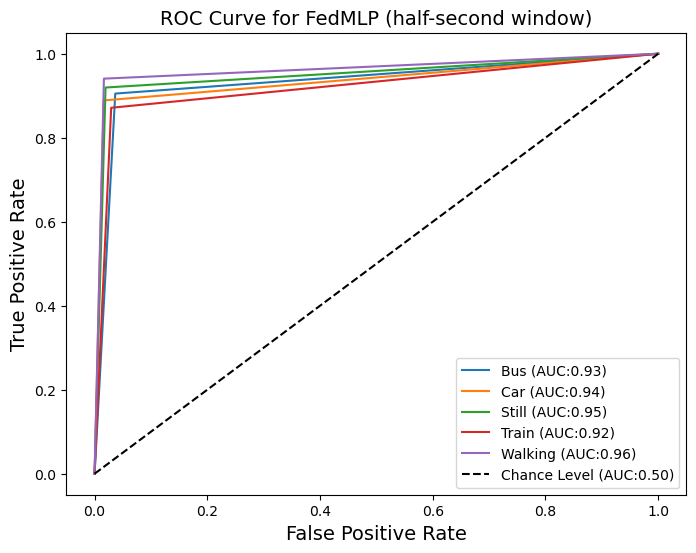

313/313 [==============================] - 2s 4ms/step - loss: 0.3409 - sparse_categorical_accuracy: 0.8840
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 188 | global_acc: 90.820% | global_loss: 1.0400255918502808
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.93      0.92      2498
           3       0.90      0.87      0.89      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.942540327419873


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


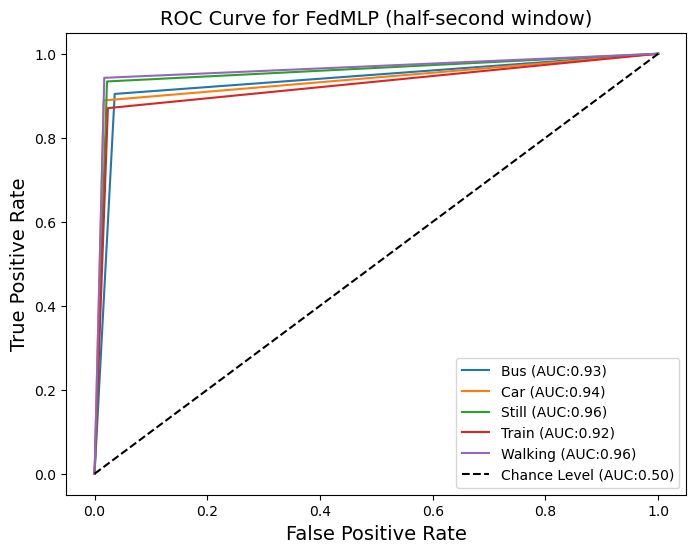

313/313 [==============================] - 2s 4ms/step - loss: 0.3317 - sparse_categorical_accuracy: 0.8823
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 189 | global_acc: 90.876% | global_loss: 1.0393242835998535
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.90      0.91      2516
           2       0.92      0.93      0.92      2498
           3       0.89      0.88      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9428825258227675


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


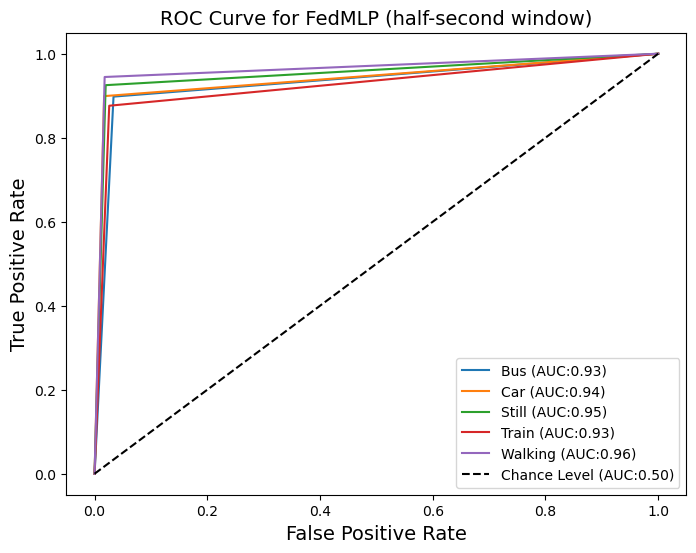

313/313 [==============================] - 2s 5ms/step - loss: 0.3565 - sparse_categorical_accuracy: 0.8731
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 190 | global_acc: 90.781% | global_loss: 1.038910150527954
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.93      0.92      2498
           3       0.88      0.88      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9423004312564991


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


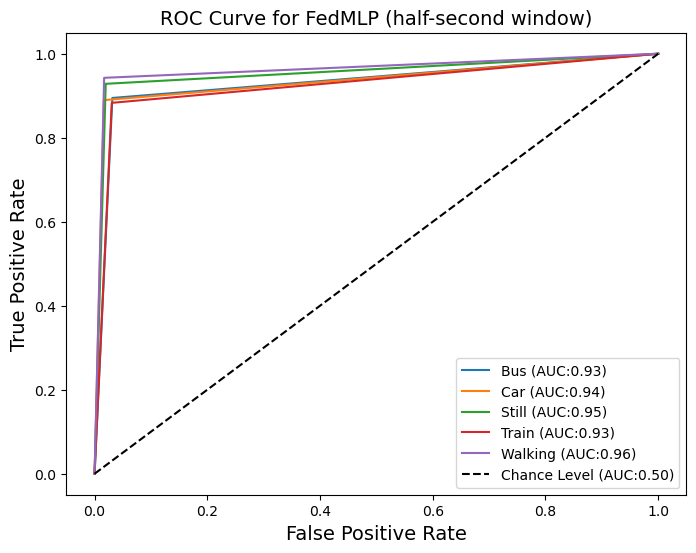

313/313 [==============================] - 2s 4ms/step - loss: 0.3477 - sparse_categorical_accuracy: 0.8802
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 191 | global_acc: 91.028% | global_loss: 1.039675235748291
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.94      0.93      2498
           3       0.90      0.87      0.89      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9438422384031557


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


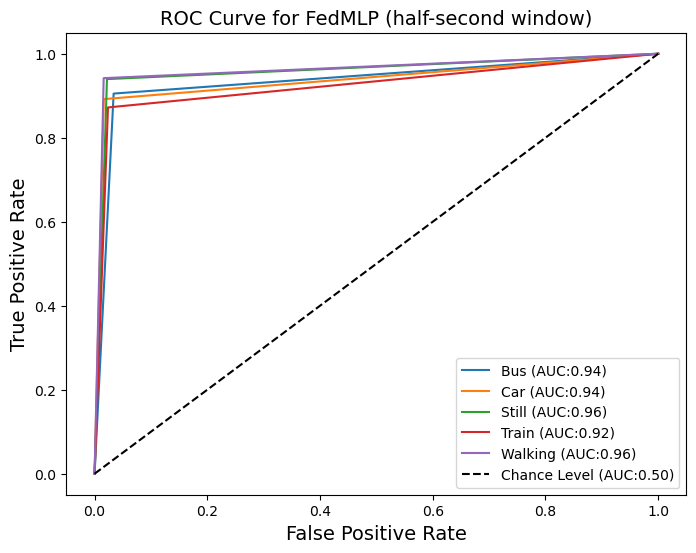

313/313 [==============================] - 2s 4ms/step - loss: 0.3323 - sparse_categorical_accuracy: 0.8854
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 192 | global_acc: 90.789% | global_loss: 1.0387215614318848
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.93      0.92      2498
           3       0.89      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9423325001268201


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


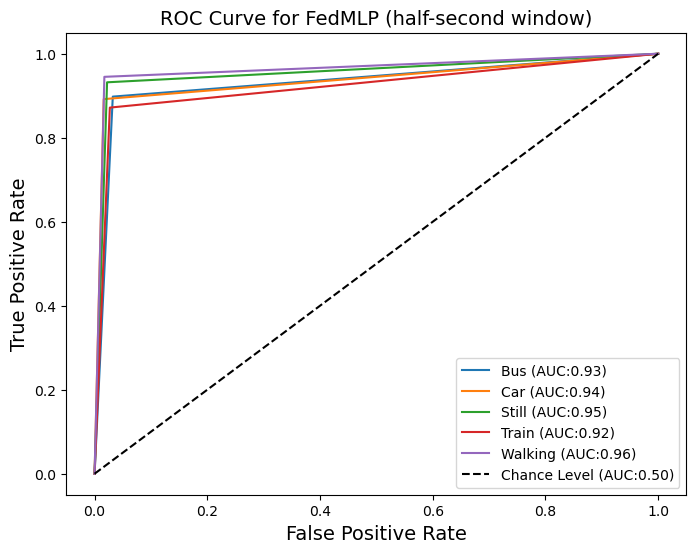

313/313 [==============================] - 1s 4ms/step - loss: 0.3546 - sparse_categorical_accuracy: 0.8790
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 193 | global_acc: 91.004% | global_loss: 1.0388234853744507
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.95      0.93      2498
           3       0.91      0.87      0.89      2471
           4       0.94      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9436814155182109


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


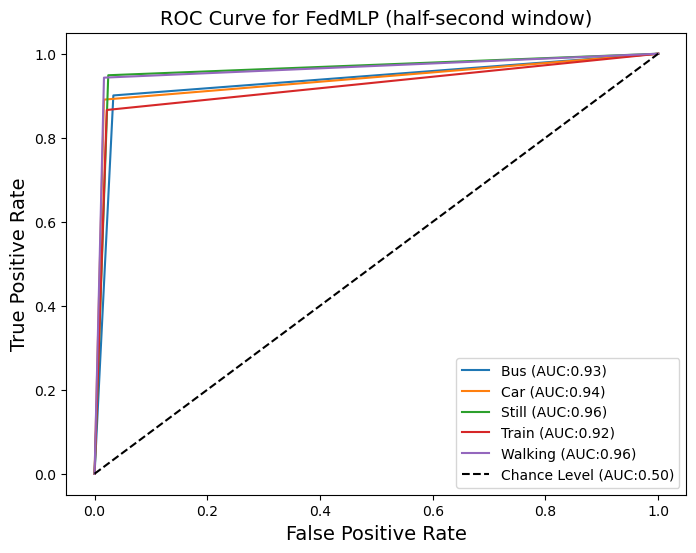

313/313 [==============================] - 1s 4ms/step - loss: 0.3649 - sparse_categorical_accuracy: 0.8779
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 194 | global_acc: 90.884% | global_loss: 1.0389902591705322
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.91      0.94      0.93      2498
           3       0.90      0.87      0.89      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9429322902764514


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


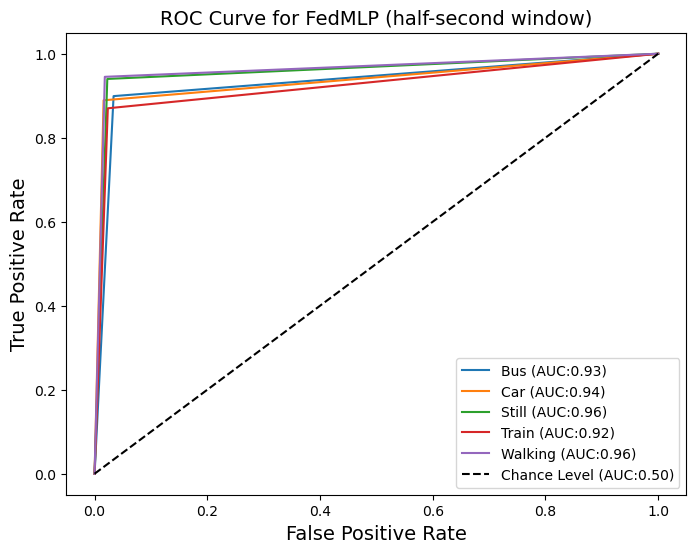

313/313 [==============================] - 1s 4ms/step - loss: 0.3482 - sparse_categorical_accuracy: 0.8846
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 195 | global_acc: 90.876% | global_loss: 1.0388555526733398
              precision    recall  f1-score   support

           0       0.87      0.90      0.88      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.93      0.92      2498
           3       0.89      0.88      0.89      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.942896570907644


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


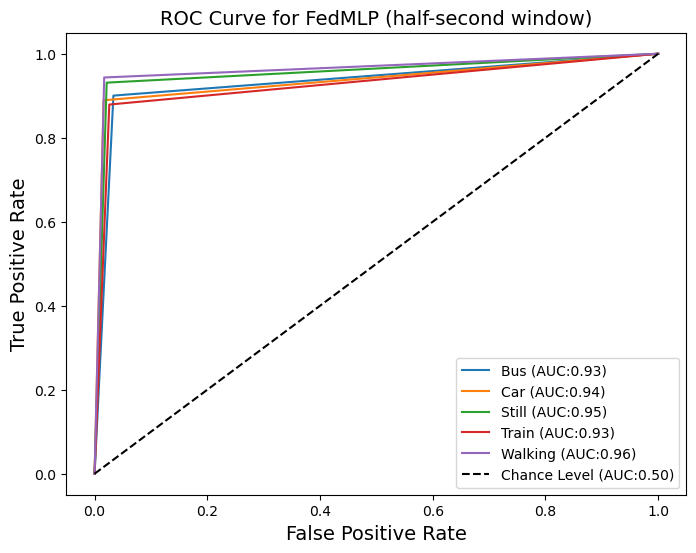

313/313 [==============================] - 1s 4ms/step - loss: 0.3528 - sparse_categorical_accuracy: 0.8759
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 196 | global_acc: 91.012% | global_loss: 1.0392863750457764
              precision    recall  f1-score   support

           0       0.87      0.90      0.89      2487
           1       0.93      0.90      0.91      2516
           2       0.92      0.93      0.92      2498
           3       0.90      0.87      0.88      2471
           4       0.93      0.95      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9437282585274964


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


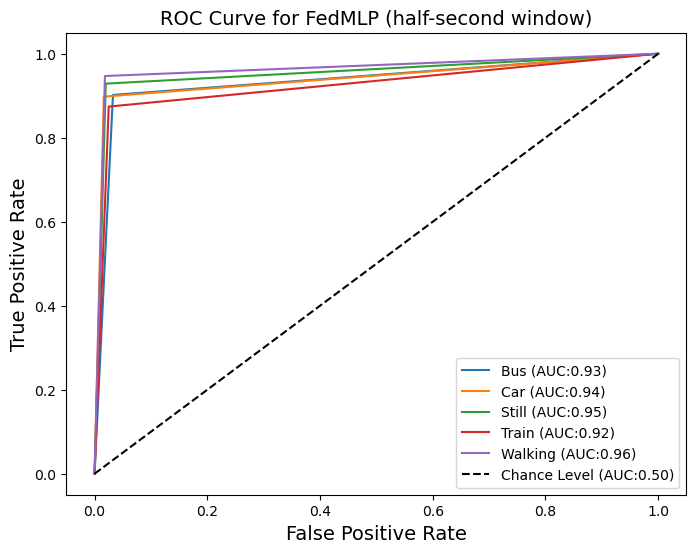

313/313 [==============================] - 1s 4ms/step - loss: 0.3427 - sparse_categorical_accuracy: 0.8840
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 197 | global_acc: 90.972% | global_loss: 1.0379993915557861
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      2487
           1       0.93      0.90      0.91      2516
           2       0.90      0.95      0.92      2498
           3       0.90      0.87      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.943476496434147


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


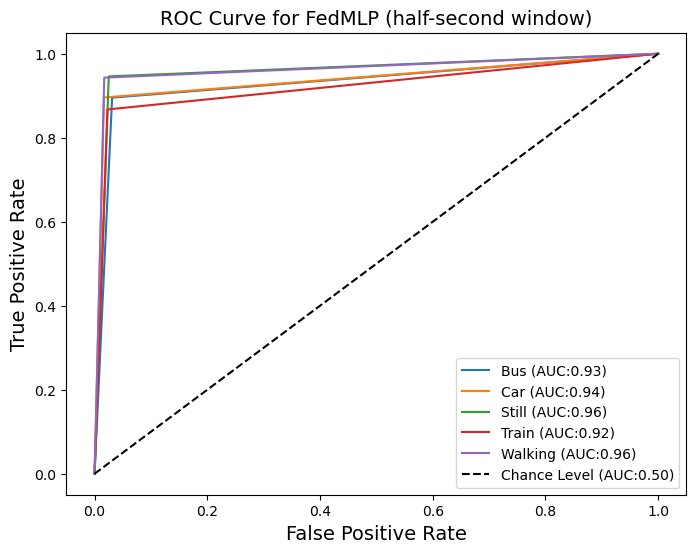

313/313 [==============================] - 1s 4ms/step - loss: 0.3314 - sparse_categorical_accuracy: 0.8840
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 198 | global_acc: 90.836% | global_loss: 1.0382367372512817
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.93      0.92      2498
           3       0.89      0.87      0.88      2471
           4       0.93      0.95      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9426325336455648


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


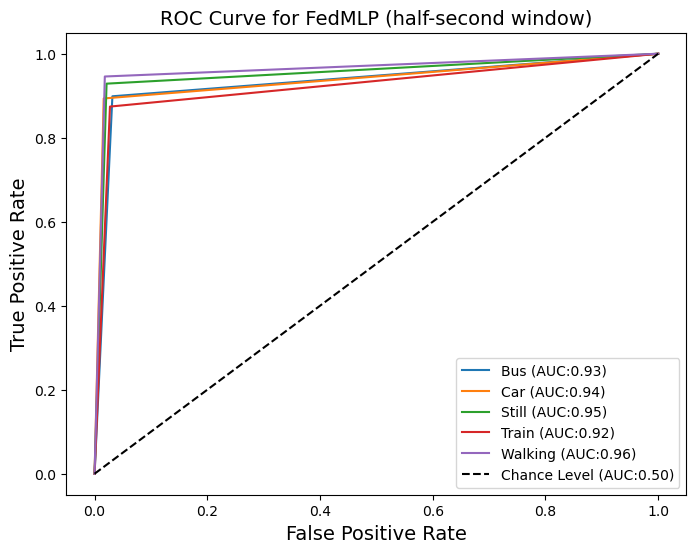

313/313 [==============================] - 1s 4ms/step - loss: 0.3331 - sparse_categorical_accuracy: 0.8838
y_pred = [0 0 1 ... 3 0 1]
y_test = tf.Tensor([0 0 1 ... 3 0 1], shape=(12517,), dtype=int64)
(12517,)
(12517,)
comm_round: 199 | global_acc: 90.892% | global_loss: 1.037899136543274
              precision    recall  f1-score   support

           0       0.88      0.89      0.89      2487
           1       0.93      0.89      0.91      2516
           2       0.92      0.93      0.92      2498
           3       0.88      0.89      0.88      2471
           4       0.93      0.94      0.94      2545

    accuracy                           0.91     12517
   macro avg       0.91      0.91      0.91     12517
weighted avg       0.91      0.91      0.91     12517

0.9429952116674457


C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b-" (-> linestyle='-'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')
C:\Users\mdabe\AppData\Local\Temp\ipykernel_16672\3700588823.py:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
  c_ax.plot(fpr, fpr, 'b-', color = "black", linestyle='--', label = 'Chance Level (AUC:0.50)')


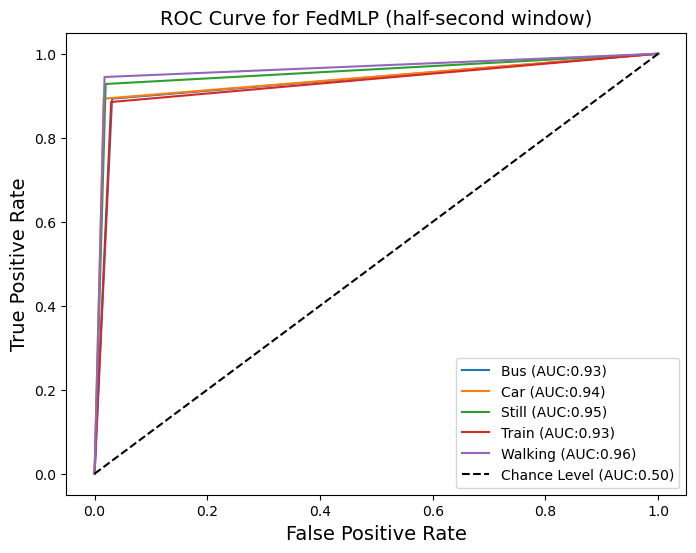

In [49]:
#initialize global model
smlp_global = SimpleMLP()
global_model = smlp_global.build(24, 5)
        
#commence global training loop
for comm_round in range(comms_round):
            
    # get the global model's weights - will serve as the initial weights for all local models
    global_weights = global_model.get_weights()
    
    #initial list to collect local model weights after scalling
    scaled_local_weight_list = list()

    #randomize client data - using keys
    client_names= list(clients_batched.keys())
    random.shuffle(client_names)
    
    #loop through each client and create new local model
    for client in client_names:
        #print(4)
        smlp_local = SimpleMLP()
        local_model = smlp_local.build(24, 5)
        local_model.compile(loss=loss, 
                      optimizer=optimizer, 
                      metrics=metrics)
        
        #set local model weight to the weight of the global model
        local_model.set_weights(global_weights)
        
        #fit local model with client's data
        local_model.fit(clients_batched[client], epochs=1, verbose=1)
        
        #scale the model weights and add to list
        scaling_factor = weight_scalling_factor(clients_batched, client) 
        scaled_weights = scale_model_weights(local_model.get_weights(), scaling_factor)
        scaled_local_weight_list.append(scaled_weights)
        
        #clear session to free memory after each communication round
        K.clear_session()
        
    #to get the average over all the local model, we simply take the sum of the scaled weights
    average_weights = sum_scaled_weights(scaled_local_weight_list)
    #print(average_weights)
    #update global model 
    global_model.set_weights(average_weights)

    #test global model and print out metrics after each communications round
    for(X_test, Y_test) in test_batched:
        global_acc, global_loss = test_model(X_test, Y_test, global_model, comm_round)